In [1]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import fastf1 as ff1

# FORMULA 1 TAG HUEUER GRAND PRIX DE MONACO 2025
The Monaco Grand Prix (French: Grand Prix de Monaco) is a Formula One motor racing event held annually on the Circuit de Monaco, in late May or early June. Run since 1929, it is widely considered to be one of the most important and prestigious automobile races in the world,[1][2][3] and is one of the races—along with the Indianapolis 500 and the 24 Hours of Le Mans—that form the Triple Crown of Motorsport.[4] It is the only Grand Prix that does not adhere to the FIA's mandated 305-kilometre (190-mile) minimum race distance for F1 races.[5]

The race is held on a narrow course laid out in the streets of Monaco, with many elevation changes and tight corners as well as the tunnel, making it one of the most demanding circuits in Formula One. In spite of the relatively low average speeds, the Monaco circuit is a dangerous place to race due to how narrow the track is, and the race often involves the intervention of a safety car.

The first Monaco Grand Prix took place on 14 April 1929, and the race eventually became part of the pre-Second World War European Championship and was included in the first World Championship of Drivers in 1950. It was twice designated the European Grand Prix, in 1955 and 1963, when this title was an honorary designation given each year to one Grand Prix race in Europe. Graham Hill was known as "Mr. Monaco"[6] due to his five Monaco wins in the 1960s. Ayrton Senna won the race more times than any other driver, with six victories, winning five races consecutively between 1989 and 1993.[7]

The circuit has been called "an exceptional location of glamour and prestige".[8] The Formula One event is usually held on the last weekend of May and is known as one of the largest weekends in motor racing, as the Formula One race occurs on the same Sunday as the Indianapolis 500 (IndyCar Series) and the Coca-Cola 600 (NASCAR Cup Series).[9] 
 Source: Wikipedia

## Obtain session information

In [2]:
libraryDataF1.obtain_information('sessions',year=2025,country_acronym="MON")

""


## Free Practice 1
### Obtain setup

In [6]:
practice = libraryDataF1.obtain_information('laps',session_key=9972)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9972)
drivers = libraryDataF1.obtain_information('drivers',session_key=9972)

In [7]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap
In Monaco, cars will be centered on turns due to there is only one striaght in this circuit.

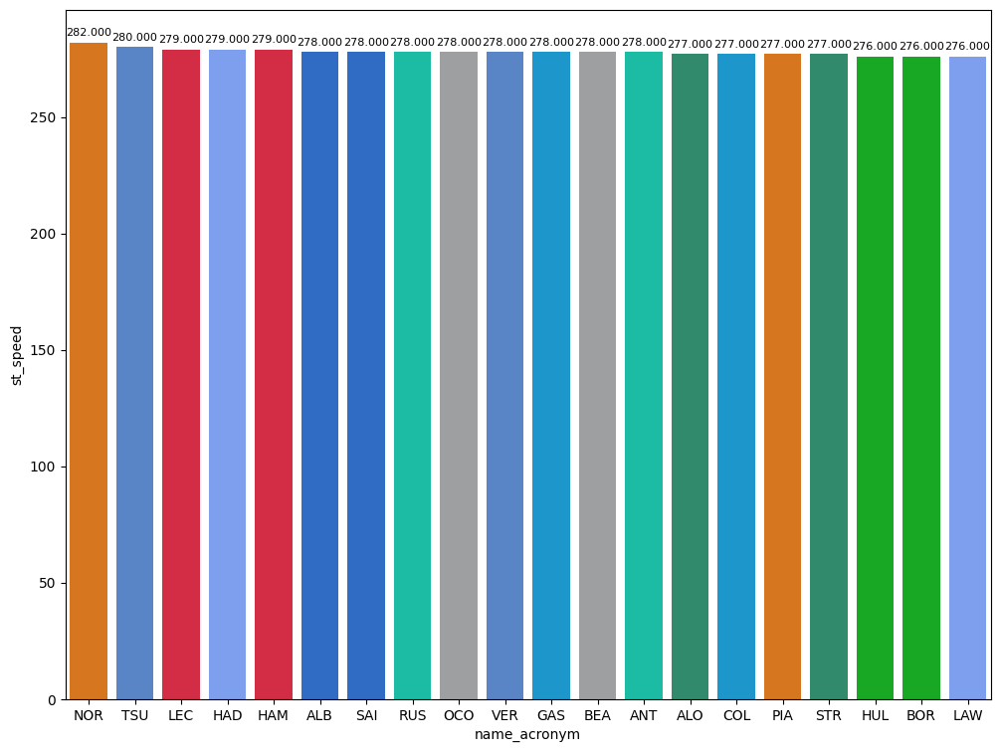

In [8]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

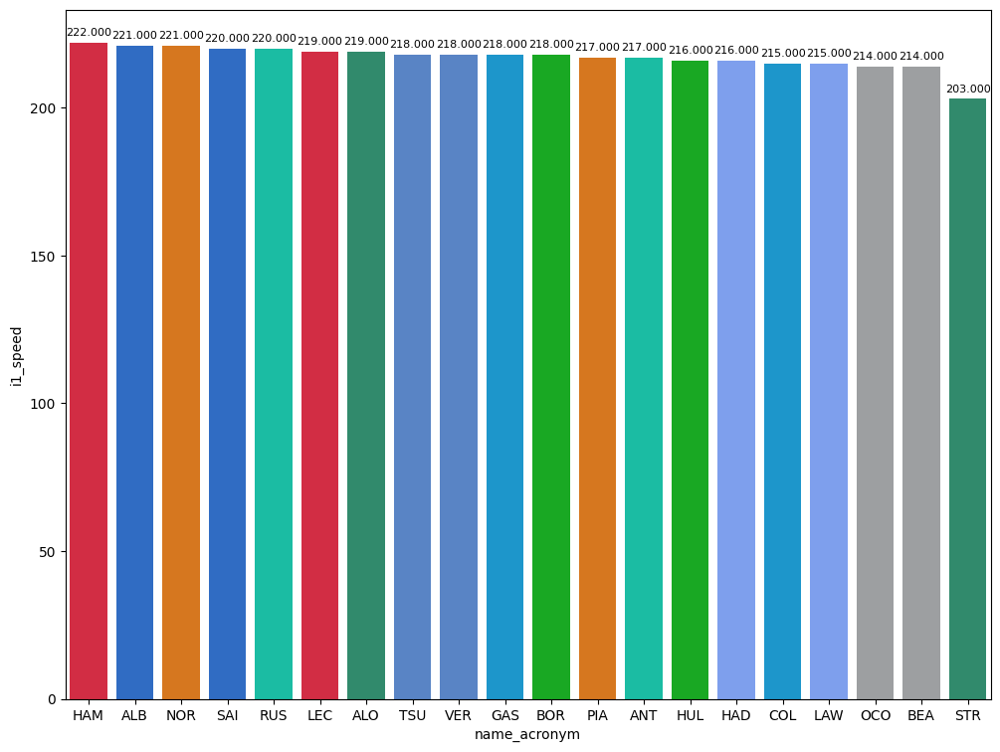

In [9]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

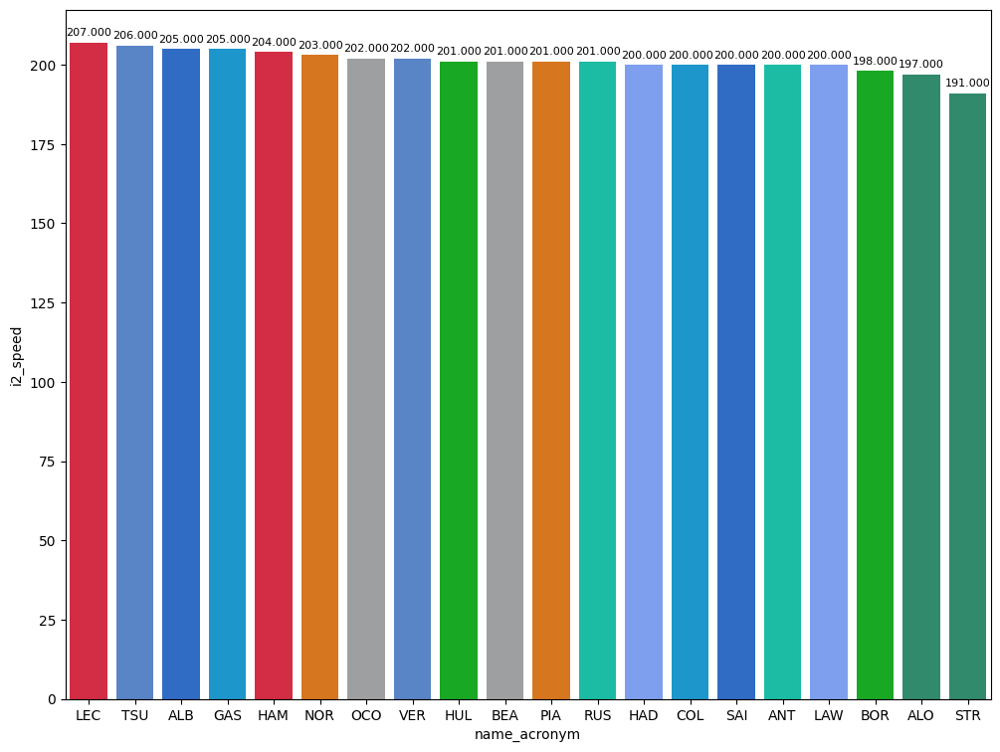

In [10]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [11]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
221,Max VERSTAPPEN,HARD,19.252,34.830,19.360,73.442
326,Oscar PIASTRI,MEDIUM,19.222,33.951,19.169,72.342
301,Charles LECLERC,SOFT,18.786,34.214,18.964,71.964


### Deltas
It seems that McLaren is not dominant here. Entering in Q3 will be very close due to the differences are very narrow.

In [12]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


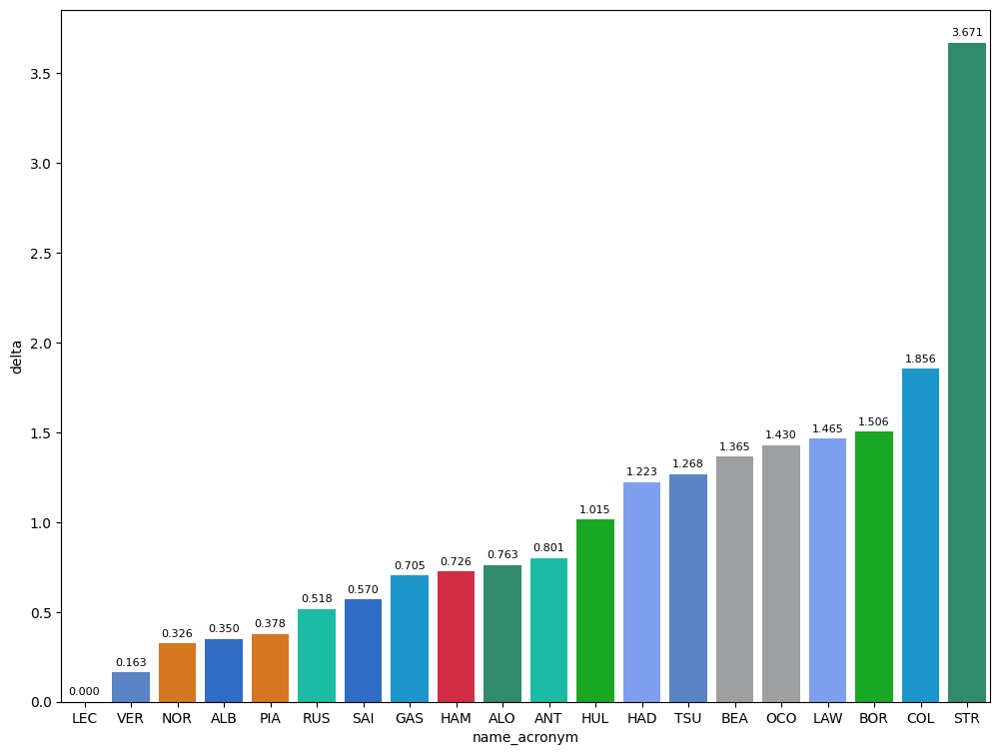

In [13]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector. Also, each sector will be commented.
<br>
<b>Sector 1:</b> Ferrari is the fastest here and Williams could be a surprise here.Alpine Haas and Sauber suffers here.
<br>
<b>Sector 2:</b> McLaren is dominant here and it could be crucial. Haas and RB could suffer here.Sauber is promising.
<br>
<b>Sector 3:</b> Unlike the first and second sector, Mercedes was the team that leaded the pace in this sector.

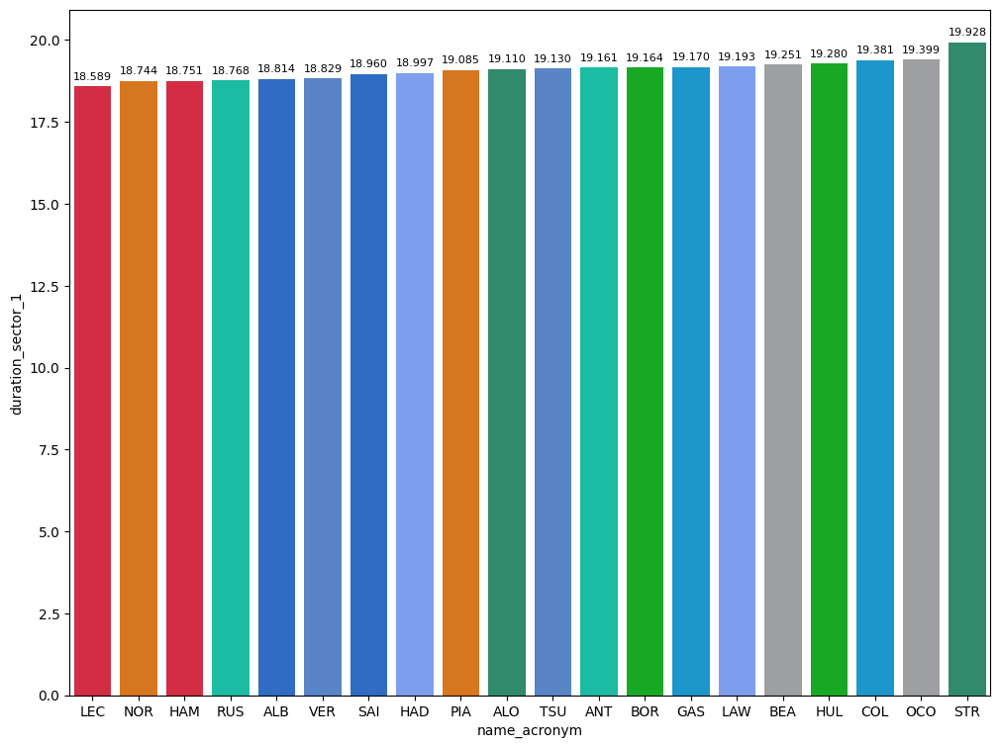

In [14]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

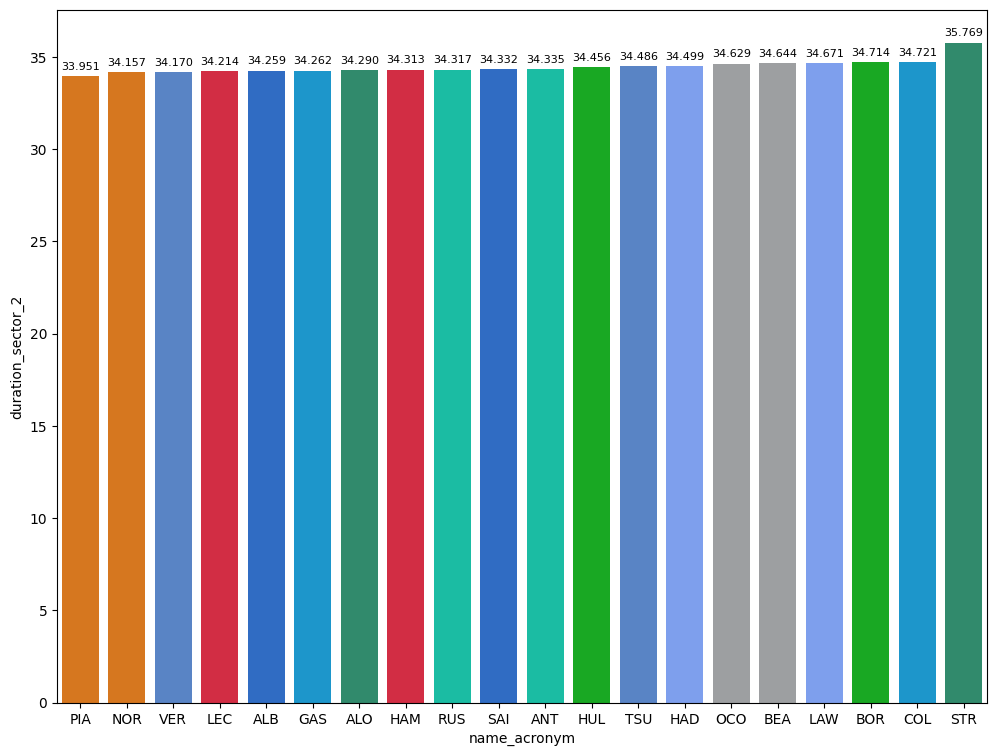

In [15]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

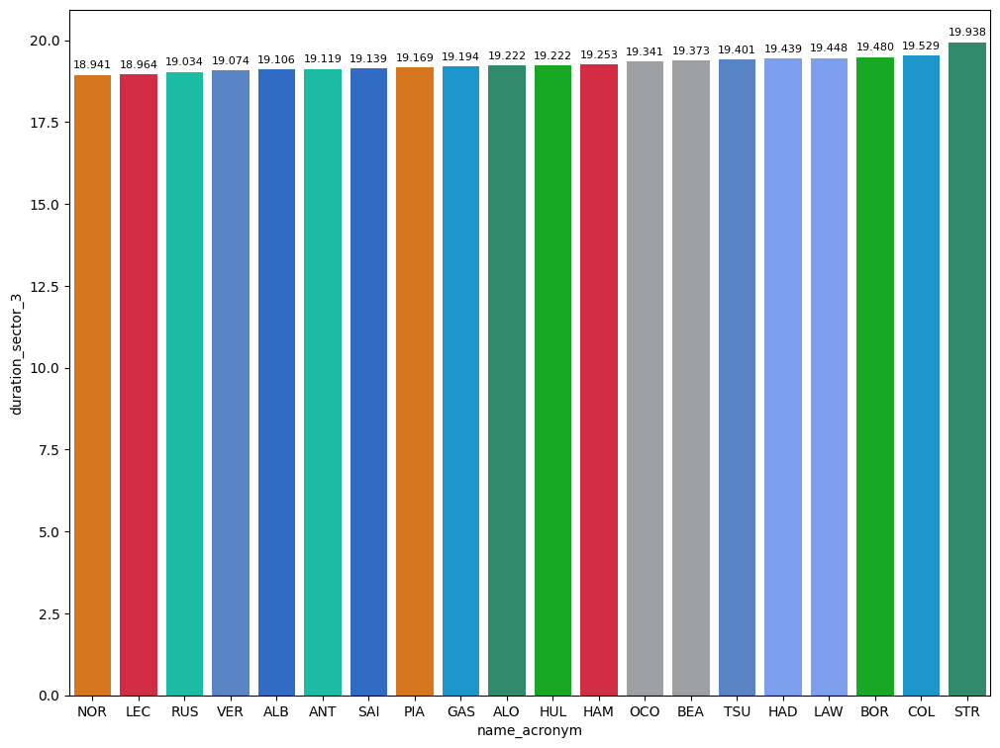

In [16]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [17]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 79").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,74.309582
MEDIUM,74.800200
HARD,75.554556


## Free Practice 2
### Obtain setup

In [100]:
practice = libraryDataF1.obtain_information('laps',session_key=9973)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9973)
drivers = libraryDataF1.obtain_information('drivers',session_key=9973)

In [101]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap
In Monaco, it is not important to be fast on the straights for the configuration of the circuit. It seems that Ferrari can earn some miliseconds in this straight.

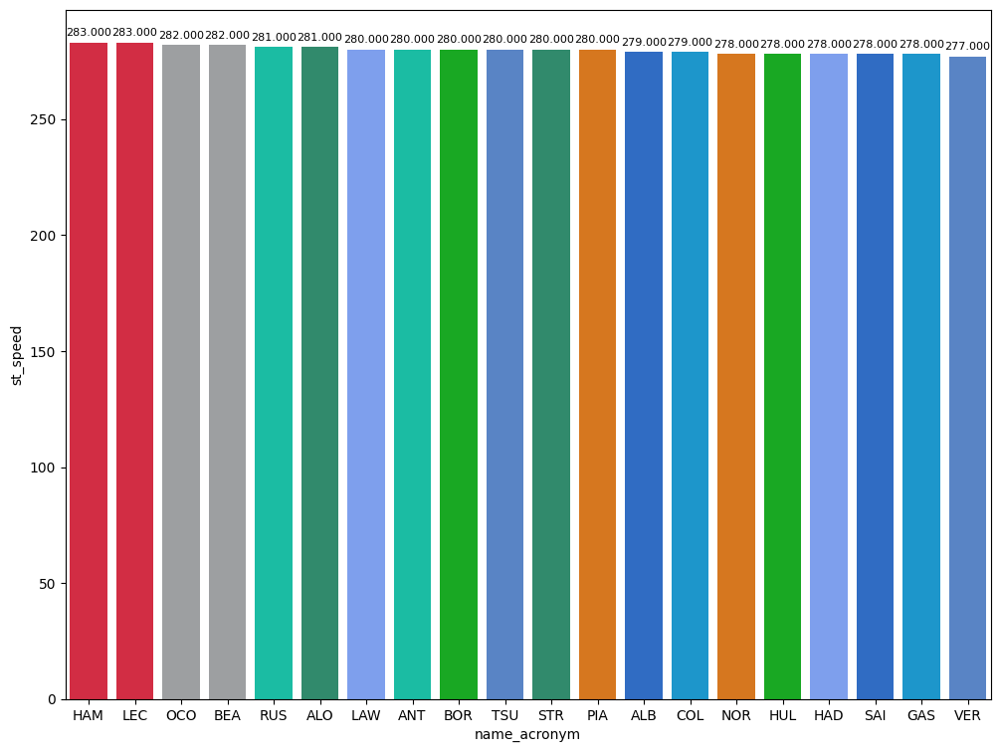

In [102]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

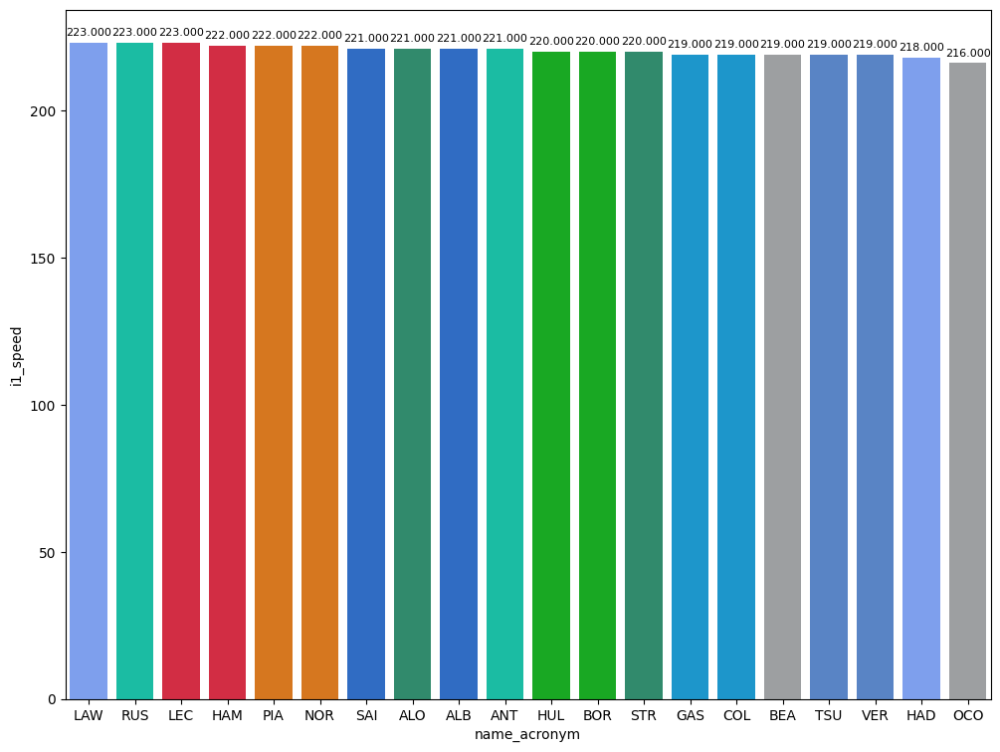

In [103]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

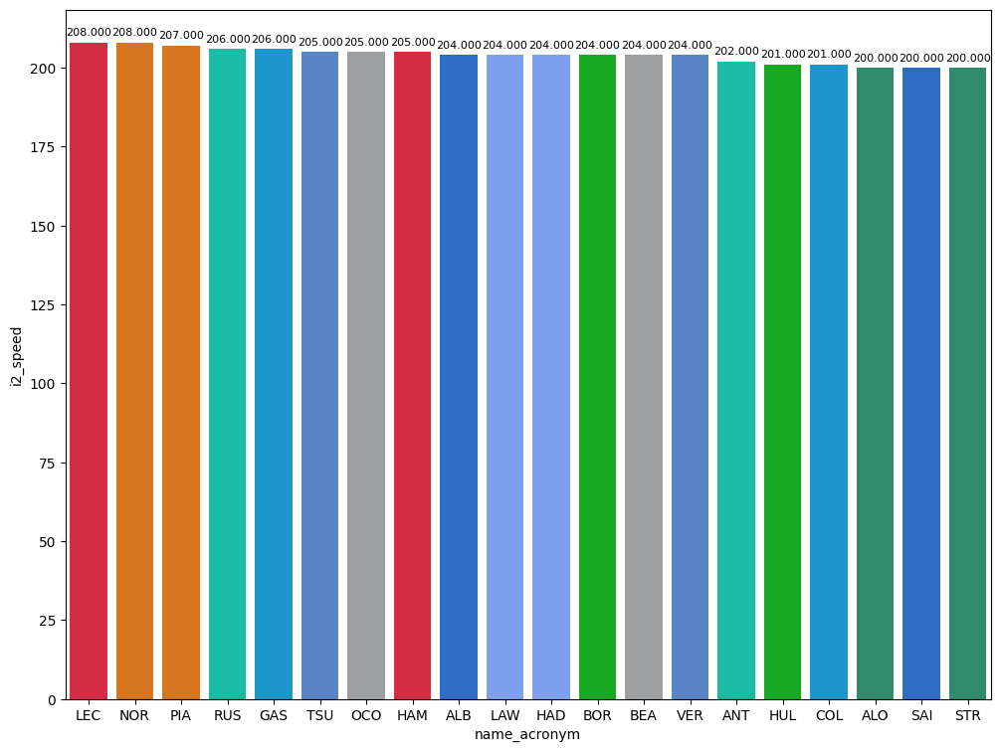

In [104]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [105]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
137,Charles LECLERC,HARD,18.836,34.224,19.043,72.103
188,Lewis HAMILTON,MEDIUM,18.704,34.080,19.241,72.025
280,Charles LECLERC,SOFT,18.573,33.852,18.930,71.355


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session.
it seems that Ferrari is strong here but Mercedes and Red Bull were hidden so it would not be representative.

In [106]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


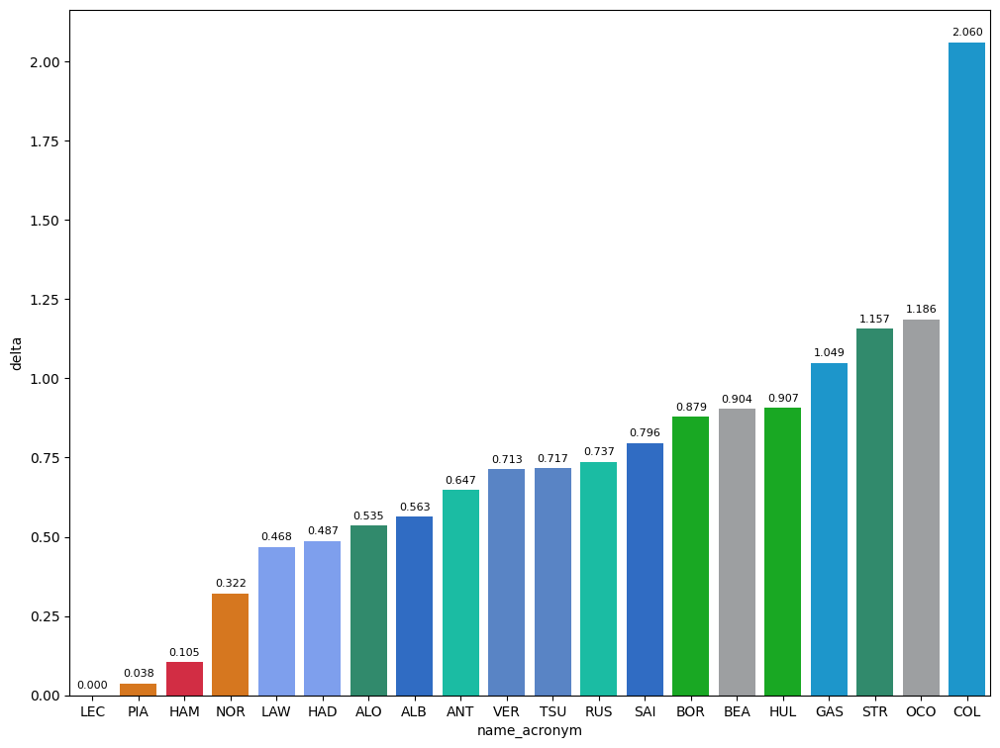

In [107]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.
<b>Sector 1:</b> Leclerc was the fastest with Ferrari being very competitive here followed by Piastri 2 tenths slower than him. Also, this sector will be crucial due to among Bortoleto and Stroll there is 1 tenth. Haas and Alpine are not competitive here.
<br>
<b>Sector 2:</b> McLaren is dominant here but Ferrari is not separated.Racing Bull could take advantage of this sector, Sauber could enter in Q2 thanks to this sector while Haas and Alpine suffers here.
<br>
<b>Sector 3:</b> Williams is strong here than in qualy it could be crucial for gaining positons.

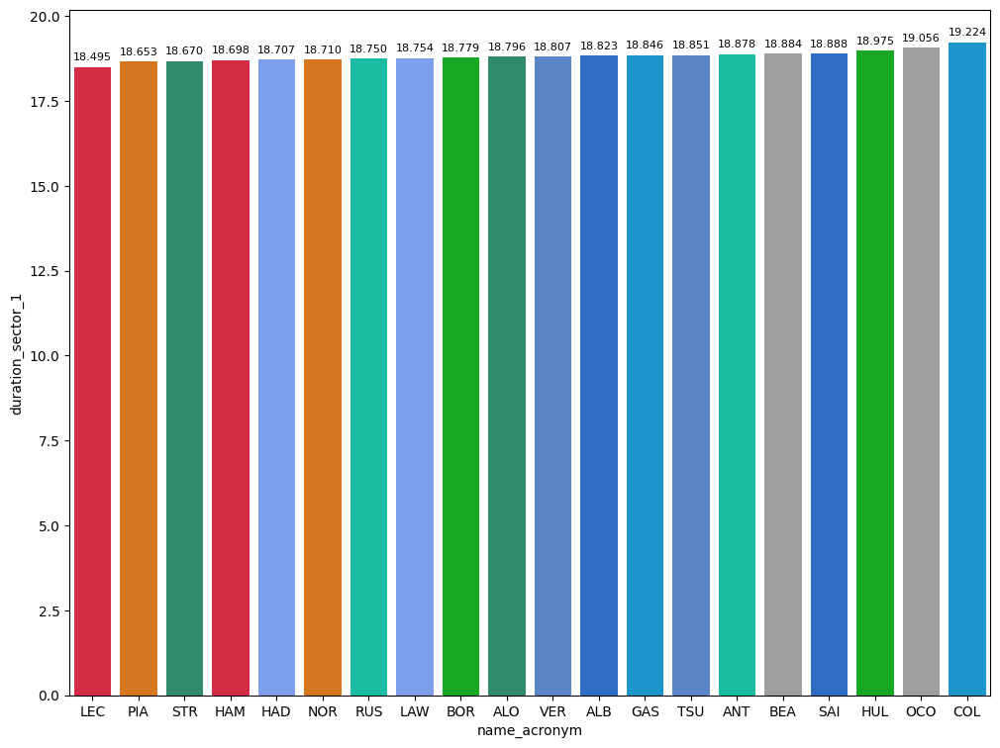

In [108]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

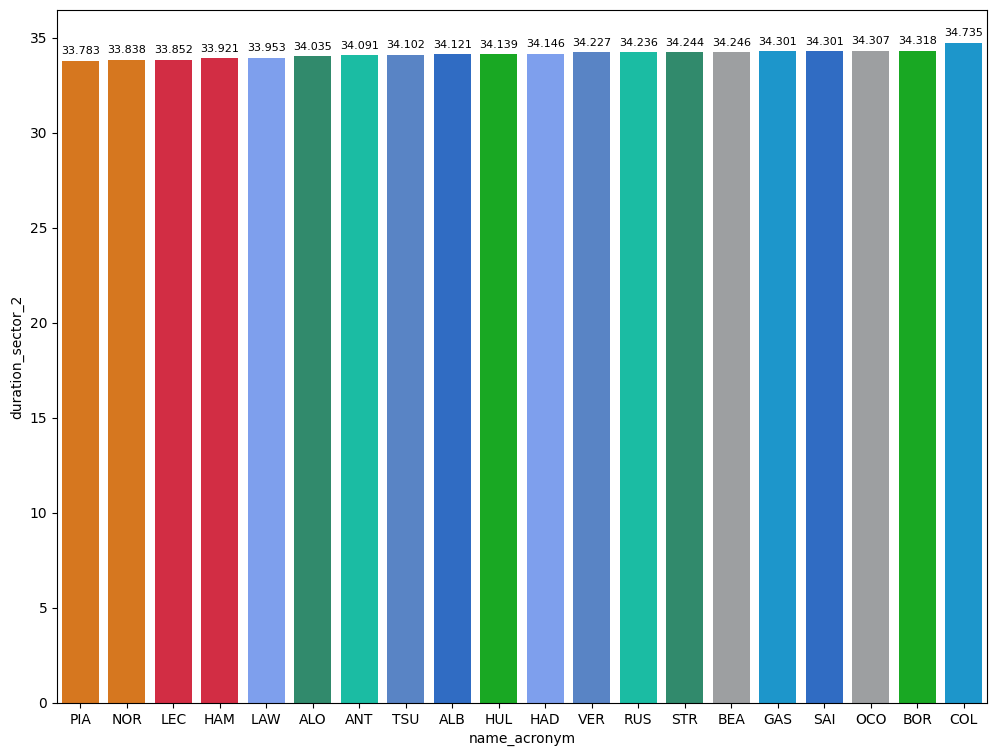

In [109]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

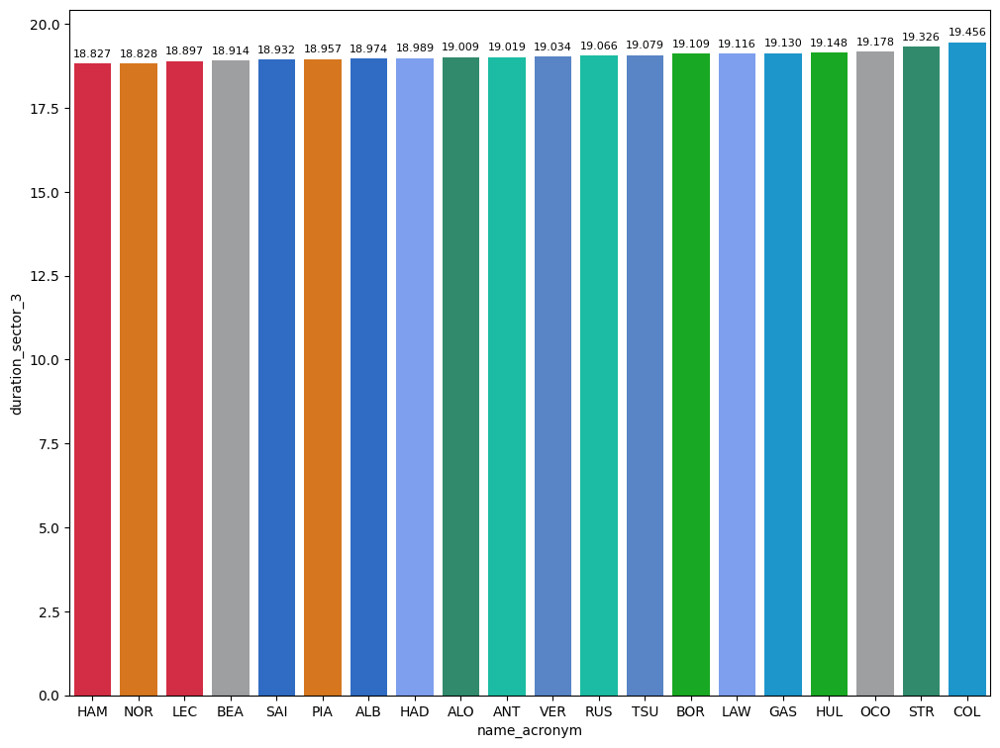

In [110]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [111]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 78").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,73.429716
HARD,74.603421
MEDIUM,75.158211


### Long runs

In [193]:
MINIMUN_SECONDS = 74
MAXIMUM_SECONDS = 76.5

#### Red Bull Racing

In [194]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1261,9973,1,1,1,4,MEDIUM,0
6,1261,9973,1,22,1,4,MEDIUM,0
21,1261,9973,2,1,5,7,MEDIUM,4
22,1261,9973,2,22,5,7,MEDIUM,4
40,1261,9973,3,1,8,12,SOFT,0
41,1261,9973,3,22,8,18,SOFT,0
61,1261,9973,4,1,13,17,SOFT,5
75,1261,9973,5,1,18,29,MEDIUM,7
76,1261,9973,4,22,19,30,MEDIUM,7


In [195]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
491,Max VERSTAPPEN,MEDIUM,2025-05-23T15:55:09.245000+00:00,24,20.415,35.635,19.985,76.035
510,Max VERSTAPPEN,MEDIUM,2025-05-23T15:56:25.337000+00:00,25,19.857,35.620,19.811,75.288
529,Max VERSTAPPEN,MEDIUM,2025-05-23T15:57:40.665000+00:00,26,19.543,35.122,19.749,74.414


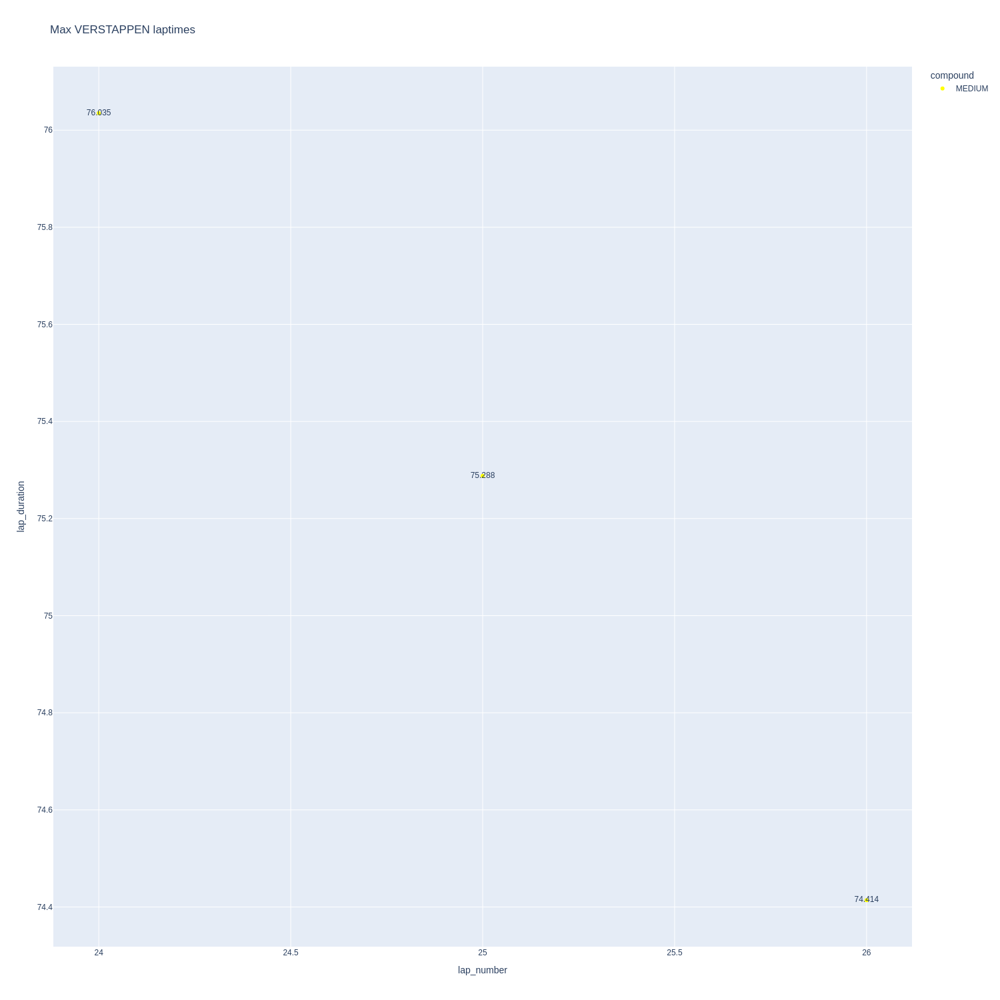

In [196]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

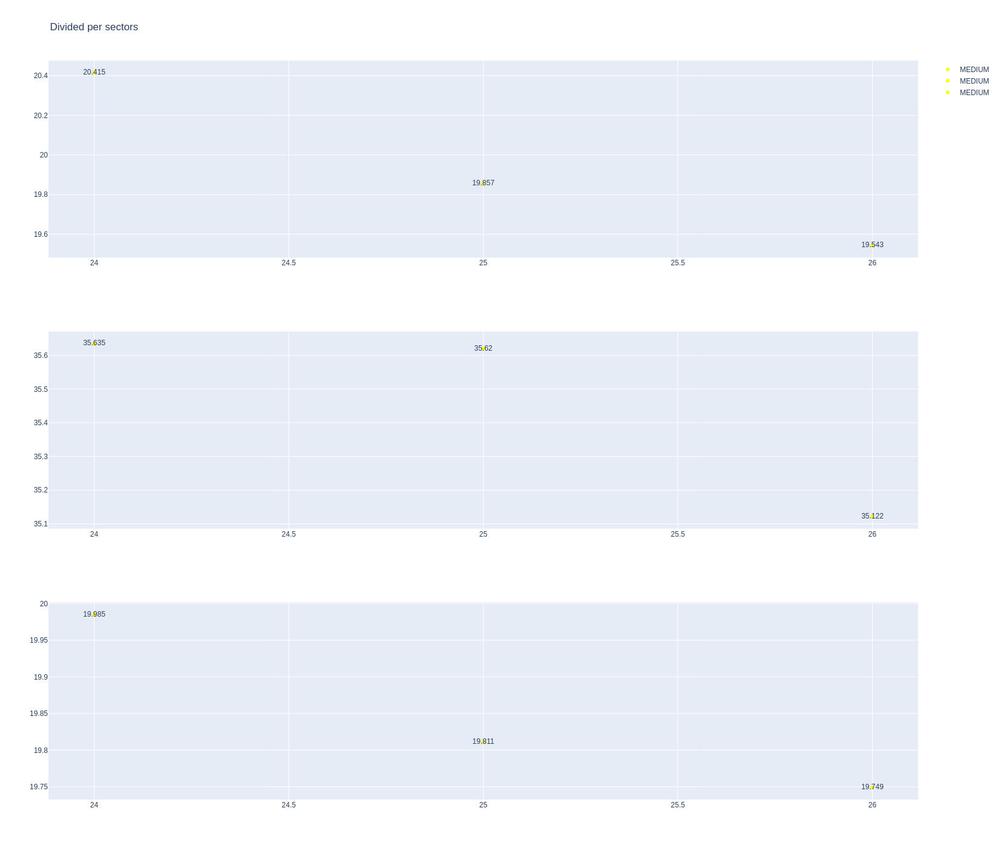

In [197]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [198]:
data = libraryDataF1.getinfolongruns(jointables2,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
436,Yuki TSUNODA,MEDIUM,2025-05-23T15:50:59.459000+00:00,21,20.261,35.737,20.188,76.186
470,Yuki TSUNODA,MEDIUM,2025-05-23T15:53:33.213000+00:00,23,19.875,35.719,20.008,75.602
488,Yuki TSUNODA,MEDIUM,2025-05-23T15:54:48.745000+00:00,24,19.639,35.479,19.883,75.001
507,Yuki TSUNODA,MEDIUM,2025-05-23T15:56:03.849000+00:00,25,19.860,35.987,20.362,76.209
526,Yuki TSUNODA,MEDIUM,2025-05-23T15:57:19.962000+00:00,26,19.901,35.738,20.169,75.808
545,Yuki TSUNODA,MEDIUM,2025-05-23T15:58:35.818000+00:00,27,19.795,35.676,20.048,75.519
564,Yuki TSUNODA,MEDIUM,2025-05-23T15:59:51.317000+00:00,28,19.688,35.827,20.003,75.518


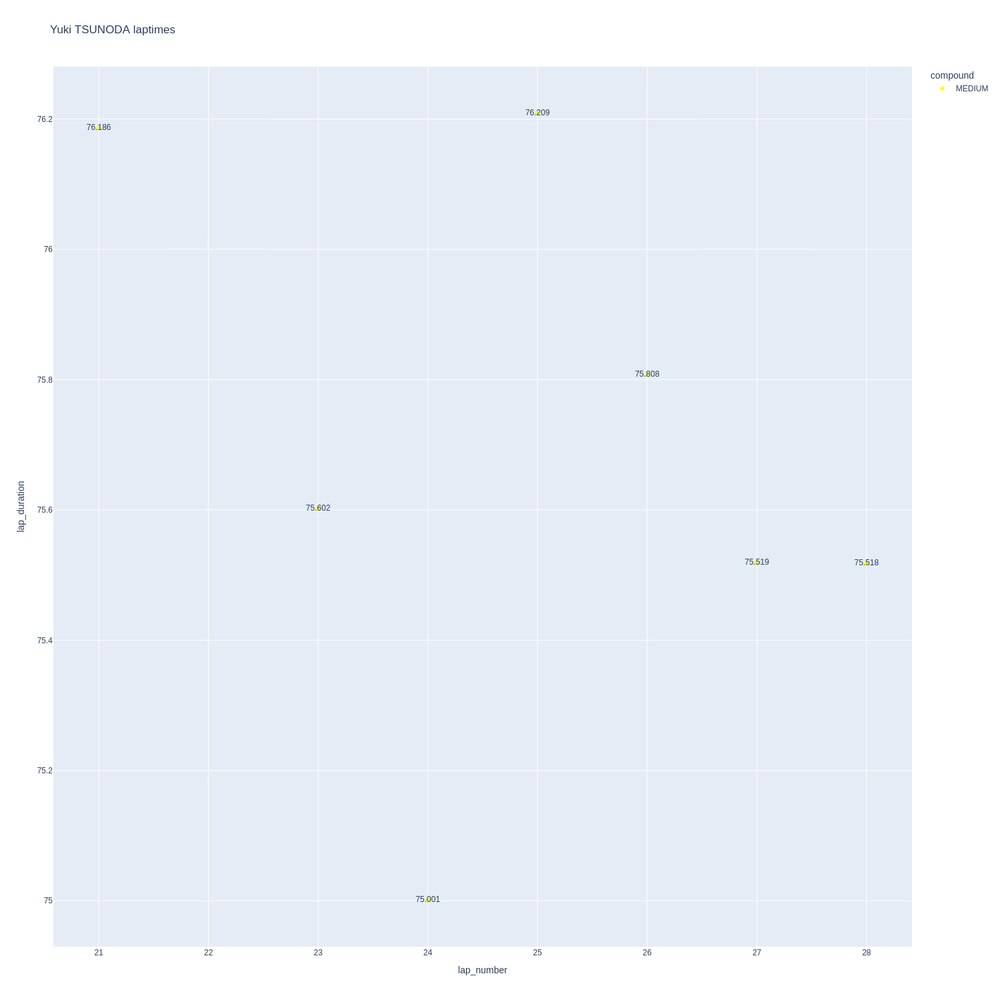

In [199]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

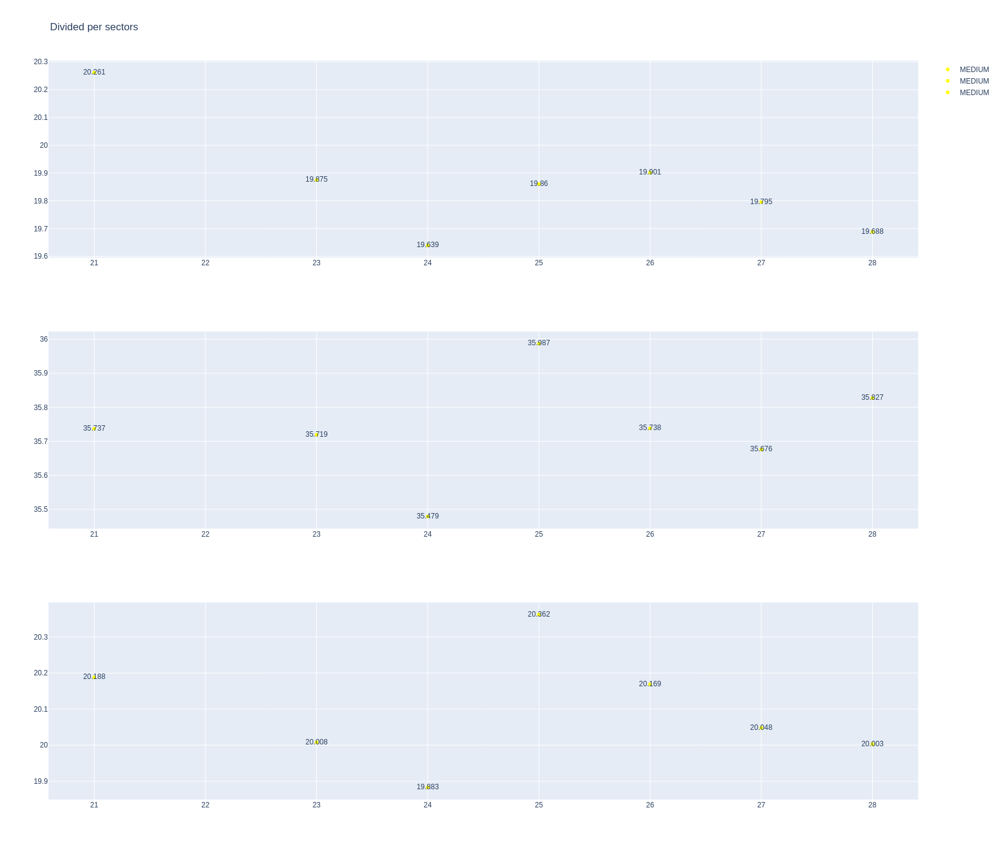

In [200]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [201]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
13,1261,9973,1,16,1,5,HARD,0
18,1261,9973,1,44,1,5,MEDIUM,0
33,1261,9973,2,44,6,8,MEDIUM,5
36,1261,9973,2,16,6,9,HARD,5
44,1261,9973,3,44,9,12,MEDIUM,8
53,1261,9973,3,16,10,12,HARD,9
63,1261,9973,4,16,13,20,SOFT,0
64,1261,9973,4,44,13,20,SOFT,0
82,1261,9973,5,44,21,30,MEDIUM,12
85,1261,9973,5,16,21,32,HARD,12


In [202]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
22,Charles LECLERC,HARD,2025-05-23T15:02:12.690000+00:00,2,19.814,35.433,19.657,74.904
430,Charles LECLERC,HARD,2025-05-23T15:50:34.850000+00:00,23,19.450,35.305,19.769,74.524
463,Charles LECLERC,HARD,2025-05-23T15:53:05.912000+00:00,25,19.349,35.018,19.666,74.033
480,Charles LECLERC,HARD,2025-05-23T15:54:20.073000+00:00,26,19.294,35.103,19.605,74.002
554,Charles LECLERC,HARD,2025-05-23T15:59:19.015000+00:00,30,19.511,35.534,19.864,74.909


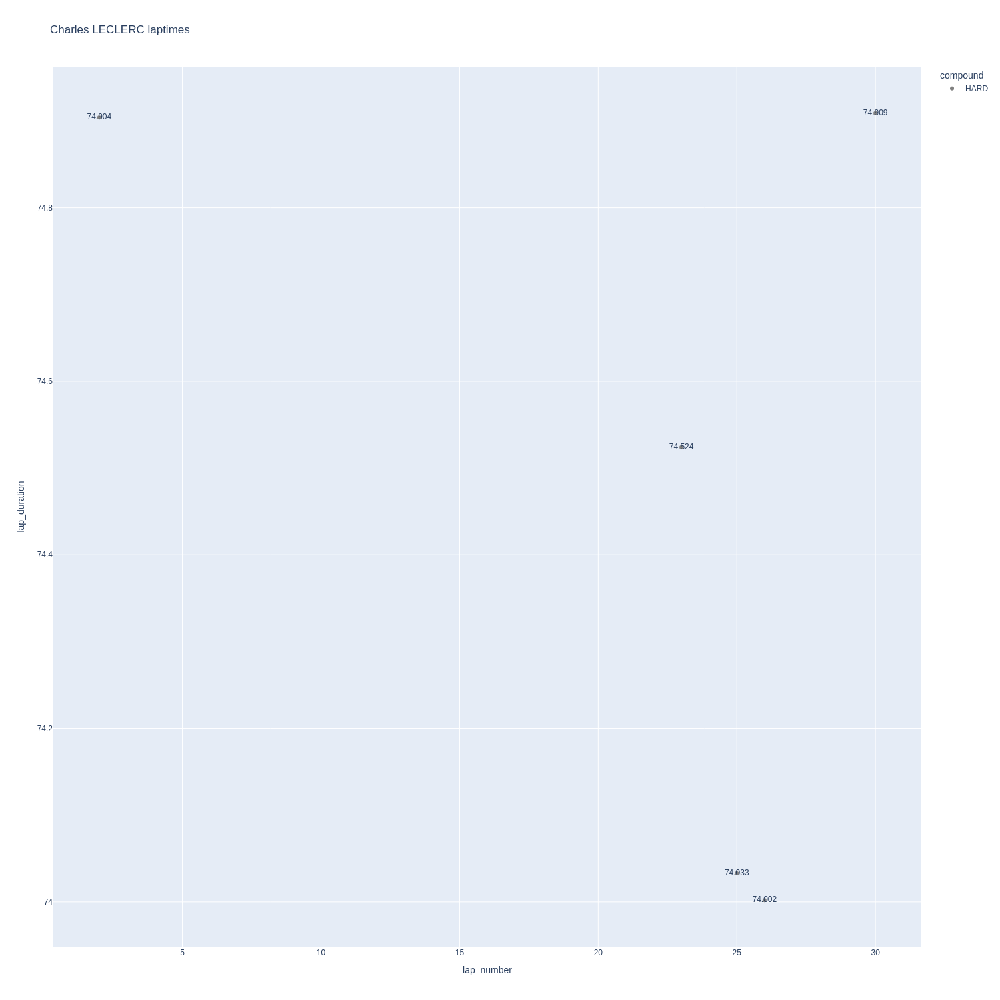

In [203]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

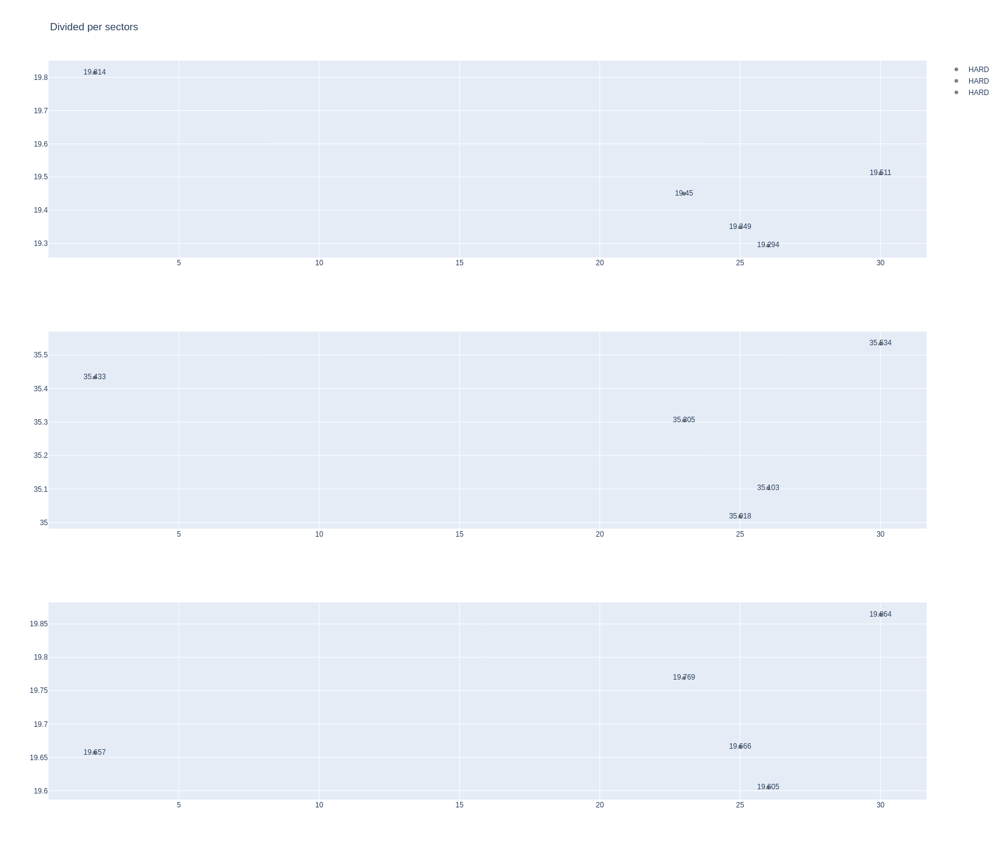

In [204]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [205]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
19,Lewis HAMILTON,MEDIUM,2025-05-23T15:02:00.393000+00:00,2,19.486,35.409,20.067,74.962
442,Lewis HAMILTON,MEDIUM,2025-05-23T15:51:33.209000+00:00,22,19.905,35.651,20.150,75.706
459,Lewis HAMILTON,MEDIUM,2025-05-23T15:52:48.914000+00:00,23,19.687,35.341,19.888,74.916
477,Lewis HAMILTON,MEDIUM,2025-05-23T15:54:03.807000+00:00,24,19.440,35.946,20.205,75.591
495,Lewis HAMILTON,MEDIUM,2025-05-23T15:55:19.433000+00:00,25,19.499,35.352,19.866,74.717
532,Lewis HAMILTON,MEDIUM,2025-05-23T15:57:53.462000+00:00,27,19.545,35.129,19.746,74.420
551,Lewis HAMILTON,MEDIUM,2025-05-23T15:59:07.734000+00:00,28,19.361,35.291,19.739,74.391


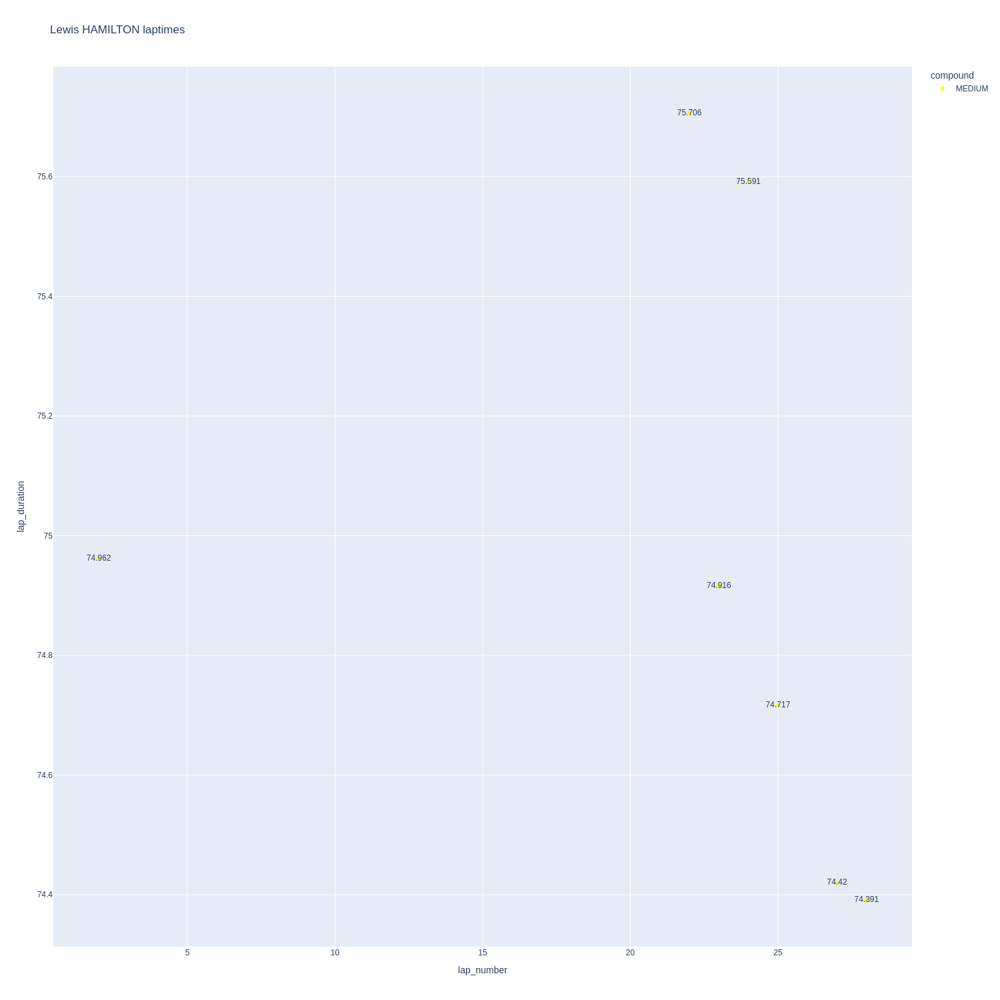

In [206]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

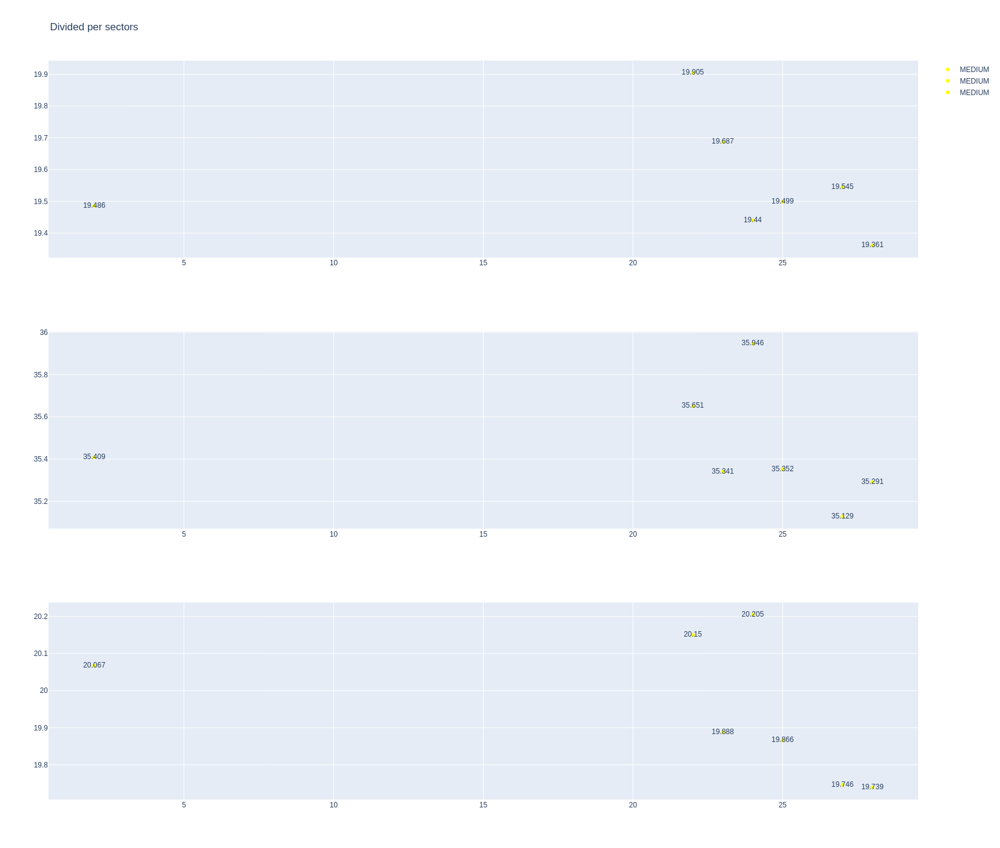

In [207]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [208]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1261,9973,1,12,1,4,MEDIUM,0
9,1261,9973,1,63,1,4,MEDIUM,0
24,1261,9973,2,12,5,8,MEDIUM,4
28,1261,9973,2,63,5,8,MEDIUM,4
48,1261,9973,3,12,9,14,SOFT,0
50,1261,9973,3,63,9,16,SOFT,0
68,1261,9973,4,12,15,17,SOFT,6
72,1261,9973,4,63,17,20,SOFT,8
74,1261,9973,5,12,18,20,SOFT,9
86,1261,9973,5,63,21,32,MEDIUM,8


In [209]:
data = libraryDataF1.getinfolongruns(jointables2,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
37,Kimi ANTONELLI,MEDIUM,2025-05-23T15:03:24.861000+00:00,2,19.766,35.164,19.764,74.694
224,Kimi ANTONELLI,SOFT,2025-05-23T15:30:16.981000+00:00,13,19.072,34.700,21.784,75.556
428,Kimi ANTONELLI,MEDIUM,2025-05-23T15:50:24.662000+00:00,23,19.788,35.439,20.006,75.233
461,Kimi ANTONELLI,MEDIUM,2025-05-23T15:52:59.556000+00:00,25,19.791,35.565,20.001,75.357
479,Kimi ANTONELLI,MEDIUM,2025-05-23T15:54:14.776000+00:00,26,19.696,35.440,20.039,75.175
497,Kimi ANTONELLI,MEDIUM,2025-05-23T15:55:30.027000+00:00,27,19.641,35.301,20.006,74.948
516,Kimi ANTONELLI,MEDIUM,2025-05-23T15:56:44.971000+00:00,28,19.816,35.450,19.994,75.260
534,Kimi ANTONELLI,MEDIUM,2025-05-23T15:58:00.224000+00:00,29,19.684,35.467,20.040,75.191
553,Kimi ANTONELLI,MEDIUM,2025-05-23T15:59:15.484000+00:00,30,19.865,35.763,20.031,75.659


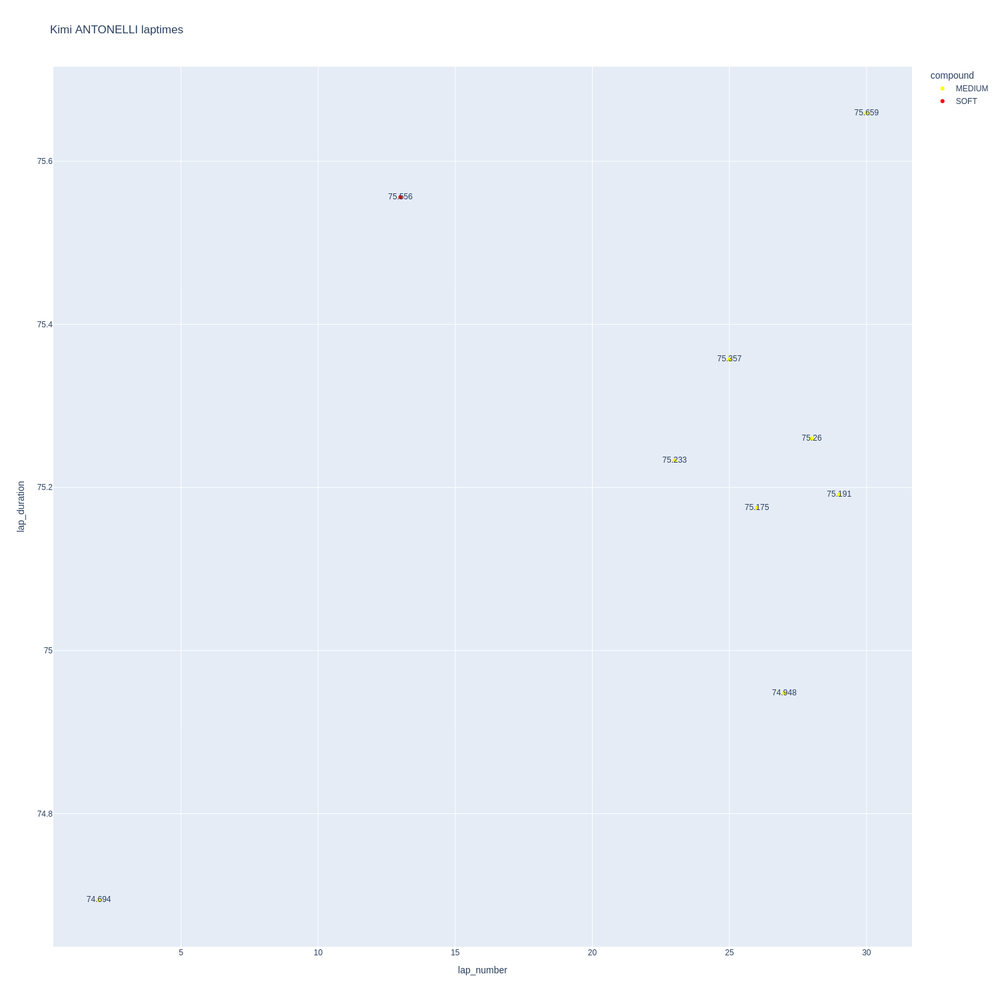

In [210]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

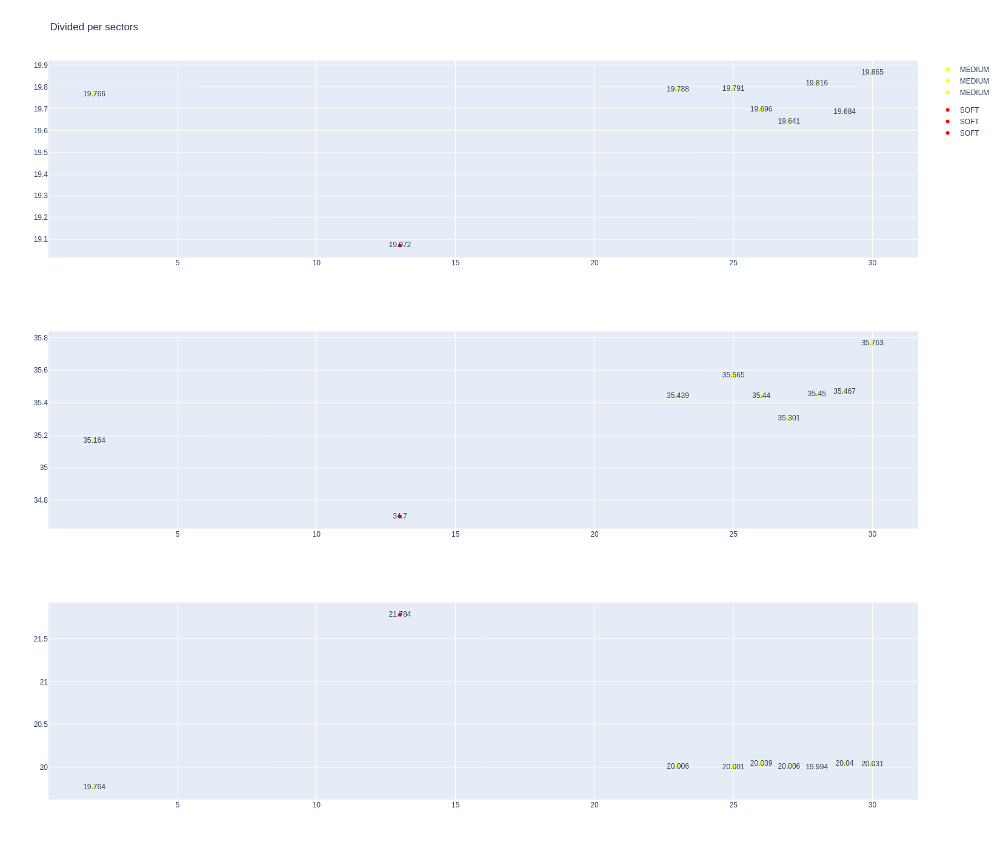

In [211]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [212]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
468,George RUSSELL,MEDIUM,2025-05-23T15:53:24.401000+00:00,25,20.050,35.726,20.426,76.202
505,George RUSSELL,MEDIUM,2025-05-23T15:56:00.083000+00:00,27,19.896,35.492,20.130,75.518
524,George RUSSELL,MEDIUM,2025-05-23T15:57:15.602000+00:00,28,19.781,35.507,20.141,75.429
543,George RUSSELL,MEDIUM,2025-05-23T15:58:30.927000+00:00,29,19.778,35.514,19.902,75.194
562,George RUSSELL,MEDIUM,2025-05-23T15:59:46.238000+00:00,30,19.656,35.584,20.062,75.302


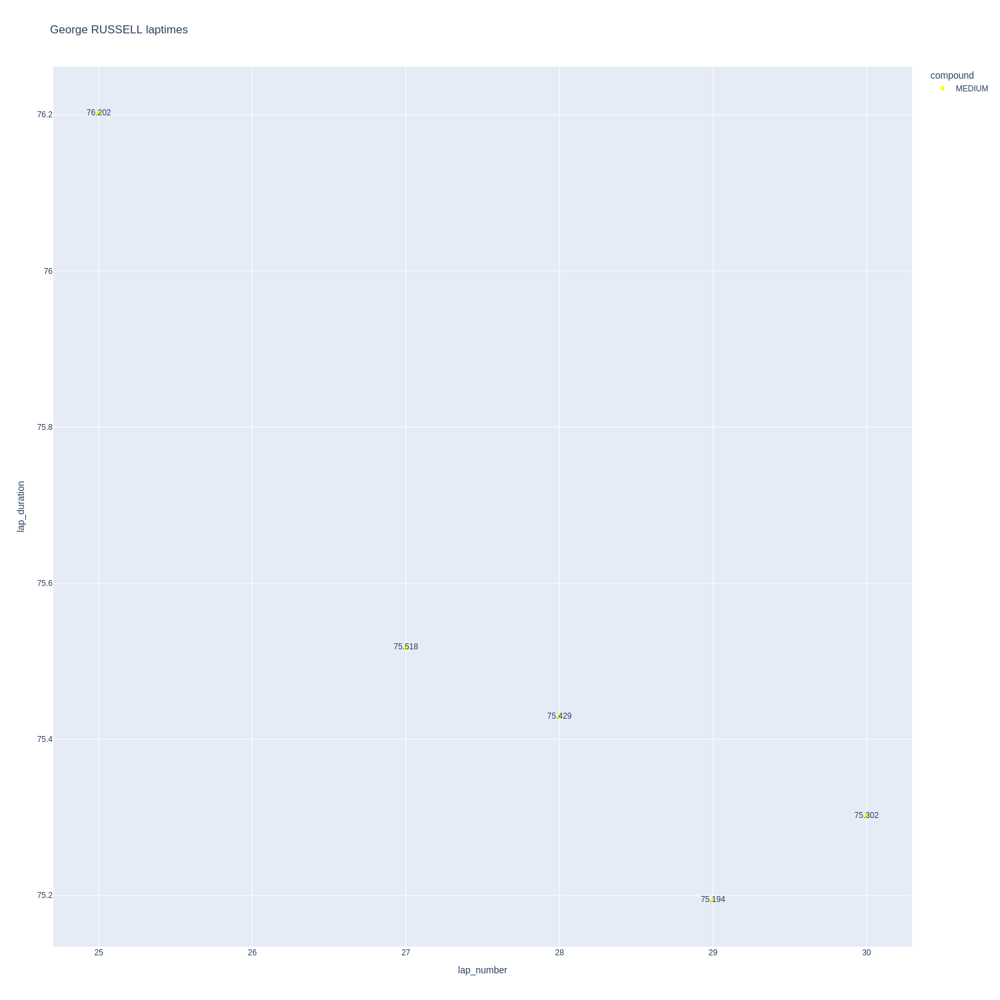

In [213]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

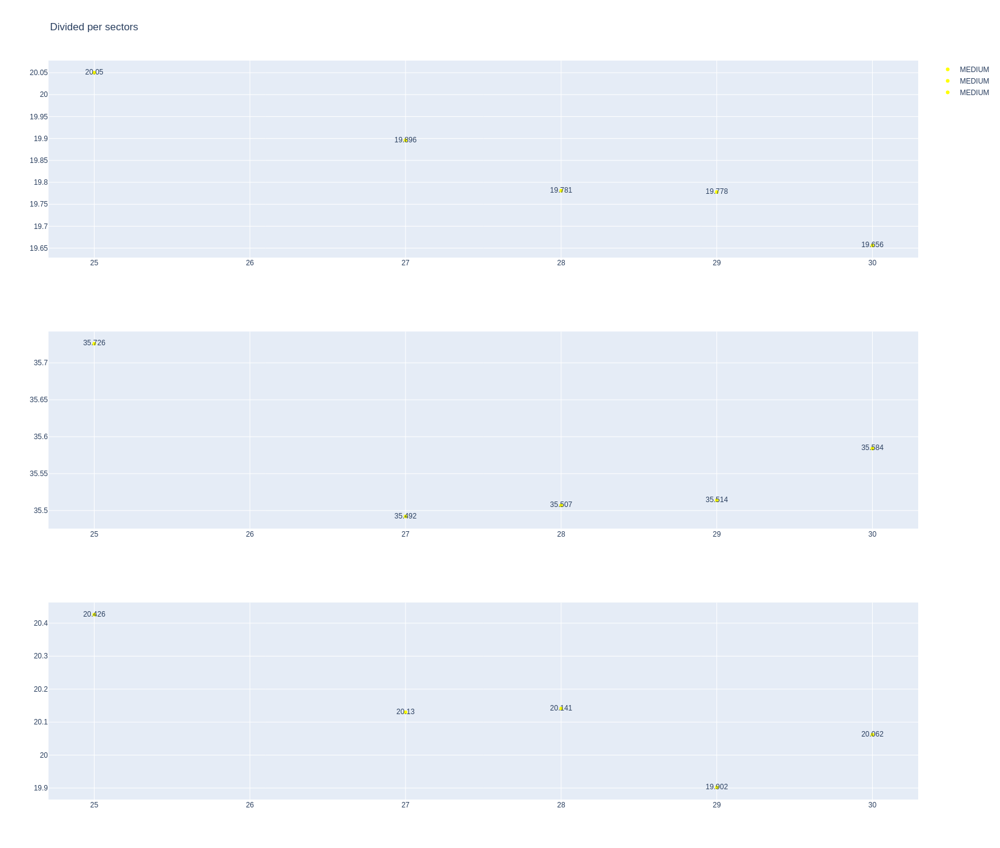

In [214]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [215]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1261,9973,1,4,1,4,MEDIUM,0
10,1261,9973,1,81,1,4,MEDIUM,0
23,1261,9973,2,4,5,8,MEDIUM,4
29,1261,9973,2,81,5,8,MEDIUM,4
42,1261,9973,3,4,9,11,MEDIUM,8
49,1261,9973,3,81,9,15,SOFT,0
60,1261,9973,4,4,12,20,SOFT,0
70,1261,9973,4,81,16,22,SOFT,7
84,1261,9973,5,4,21,32,MEDIUM,11
91,1261,9973,5,81,23,28,SOFT,14


In [216]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
431,Lando NORRIS,MEDIUM,2025-05-23T15:50:37.100000+00:00,23,19.682,35.307,19.696,74.685
447,Lando NORRIS,MEDIUM,2025-05-23T15:51:51.757000+00:00,24,19.537,36.208,20.103,75.848
464,Lando NORRIS,MEDIUM,2025-05-23T15:53:07.622000+00:00,25,19.579,35.504,19.708,74.791
481,Lando NORRIS,MEDIUM,2025-05-23T15:54:22.354000+00:00,26,19.510,35.051,19.670,74.231
500,Lando NORRIS,MEDIUM,2025-05-23T15:55:36.655000+00:00,27,19.520,35.511,19.754,74.785
518,Lando NORRIS,MEDIUM,2025-05-23T15:56:51.361000+00:00,28,19.589,35.515,19.904,75.008
537,Lando NORRIS,MEDIUM,2025-05-23T15:58:06.396000+00:00,29,19.908,35.941,19.878,75.727


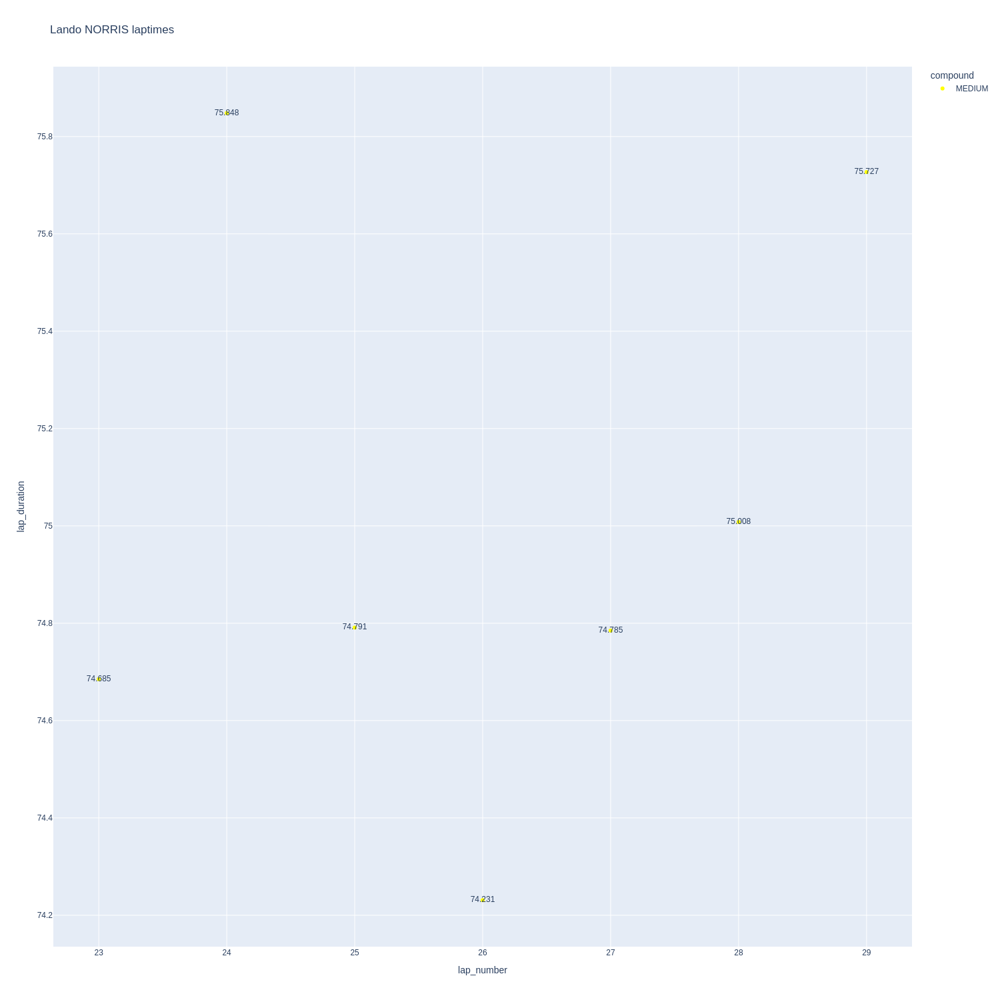

In [217]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

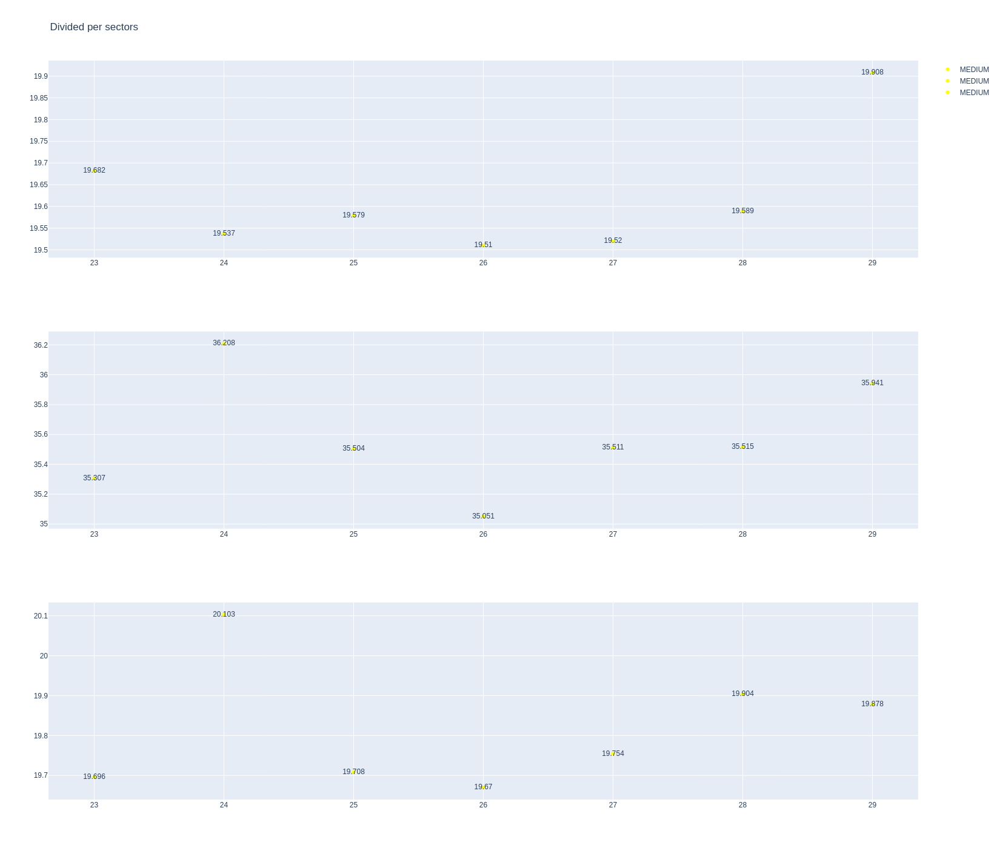

In [218]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [219]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
519,Oscar PIASTRI,SOFT,2025-05-23T15:56:55.486000+00:00,24,19.640,35.050,19.855,74.545
557,Oscar PIASTRI,SOFT,2025-05-23T15:59:28.062000+00:00,26,19.537,35.155,19.673,74.365


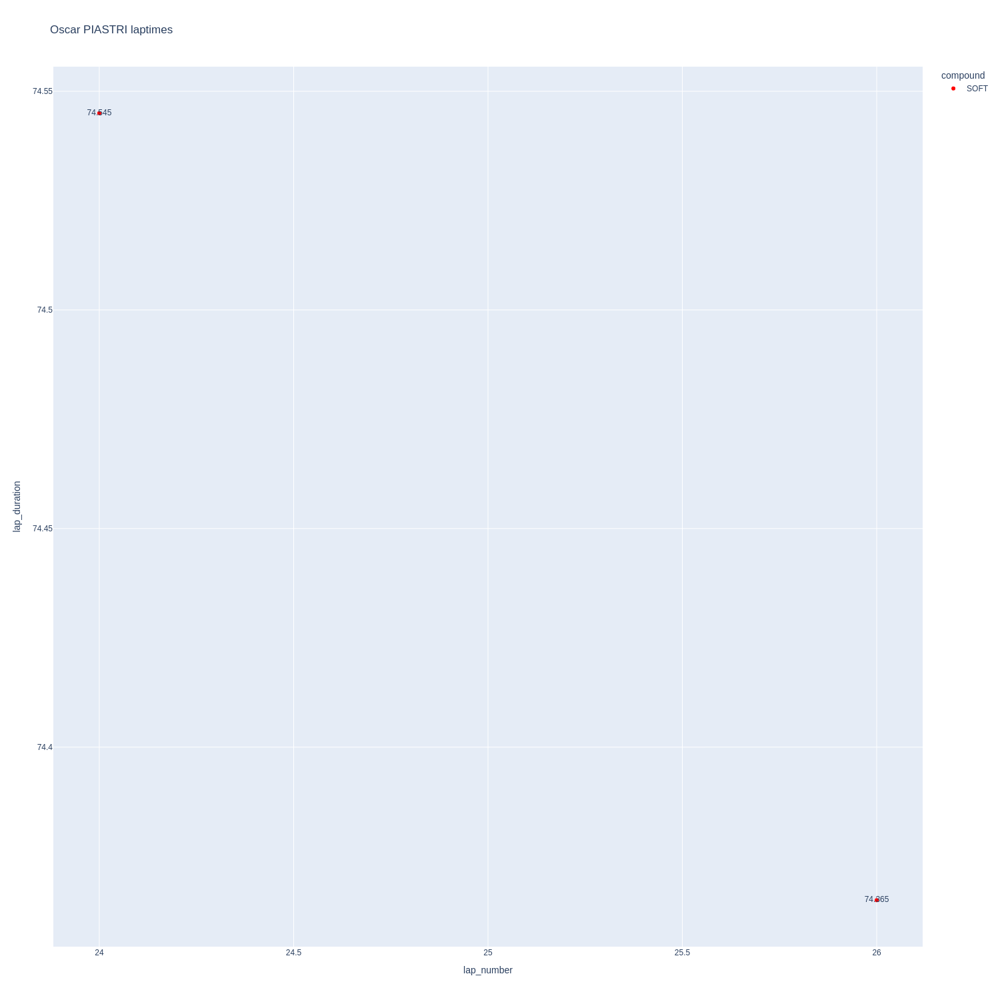

In [220]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

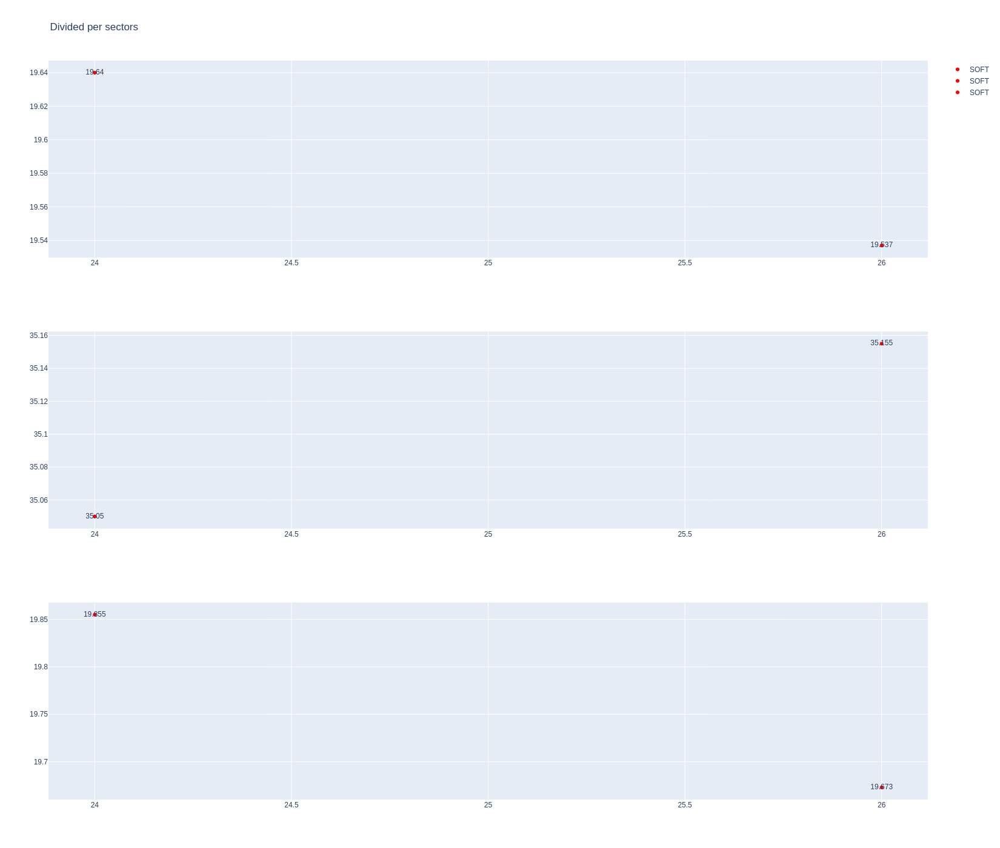

In [221]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [222]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1261,9973,1,14,1,4,MEDIUM,0
5,1261,9973,1,18,1,4,MEDIUM,0
25,1261,9973,2,14,5,8,MEDIUM,4
26,1261,9973,2,18,5,8,MEDIUM,4
45,1261,9973,3,14,9,13,SOFT,0
46,1261,9973,3,18,9,13,SOFT,0
65,1261,9973,4,14,14,19,SOFT,8
67,1261,9973,4,18,14,22,SOFT,8
80,1261,9973,5,14,20,30,MEDIUM,8
92,1261,9973,5,18,23,30,MEDIUM,8


In [223]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
511,Fernando ALONSO,MEDIUM,2025-05-23T15:56:27.095000+00:00,26,19.987,35.840,20.120,75.947
530,Fernando ALONSO,MEDIUM,2025-05-23T15:57:43.055000+00:00,27,19.820,35.552,19.988,75.360
549,Fernando ALONSO,MEDIUM,2025-05-23T15:58:58.468000+00:00,28,19.845,35.604,20.151,75.600


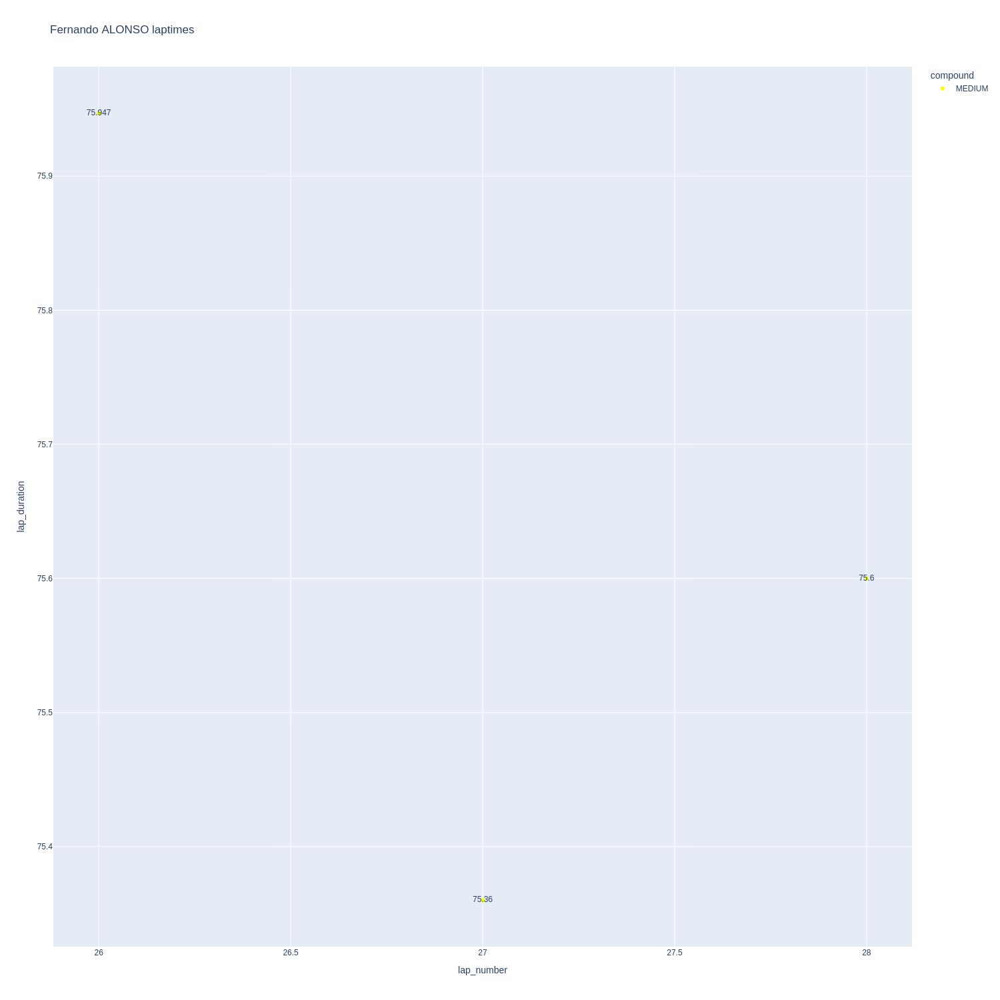

In [224]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

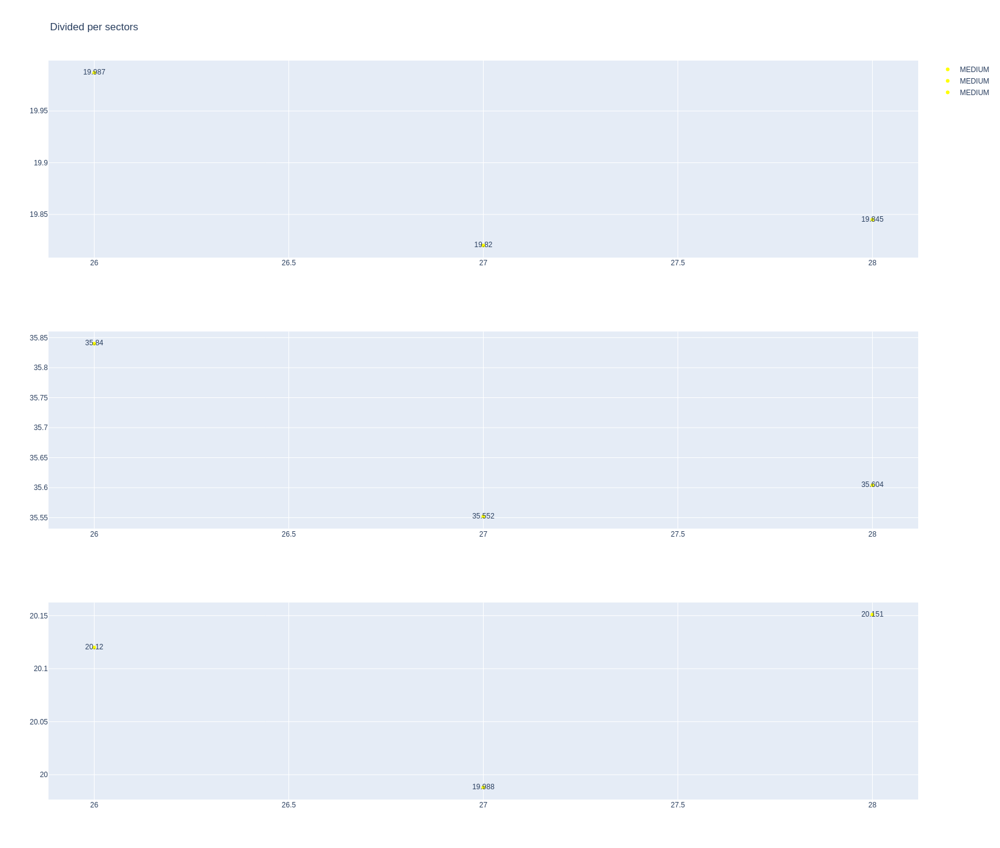

In [225]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [226]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
42,Lance STROLL,MEDIUM,2025-05-23T15:03:44.559000+00:00,2,20.061,35.924,20.085,76.070
60,Lance STROLL,MEDIUM,2025-05-23T15:05:00.537000+00:00,3,19.640,35.190,19.801,74.631
107,Lance STROLL,MEDIUM,2025-05-23T15:15:27.035000+00:00,6,19.537,35.104,19.701,74.342
484,Lance STROLL,MEDIUM,2025-05-23T15:54:36.026000+00:00,24,19.431,35.503,20.147,75.081
503,Lance STROLL,MEDIUM,2025-05-23T15:55:51.083000+00:00,25,19.377,35.372,20.038,74.787
522,Lance STROLL,MEDIUM,2025-05-23T15:57:05.883000+00:00,26,19.814,35.481,20.107,75.402
541,Lance STROLL,MEDIUM,2025-05-23T15:58:21.209000+00:00,27,19.486,35.351,20.087,74.924
560,Lance STROLL,MEDIUM,2025-05-23T15:59:36.114000+00:00,28,19.592,36.132,20.719,76.443


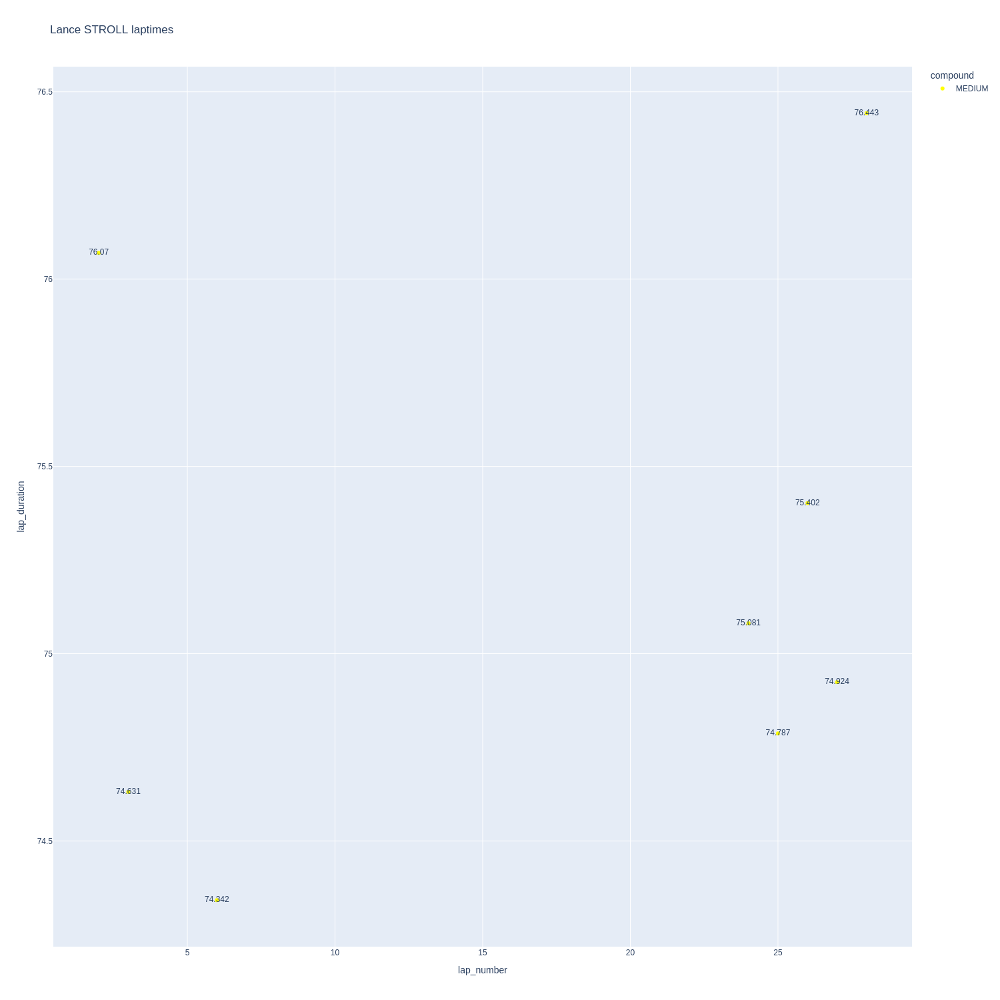

In [227]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

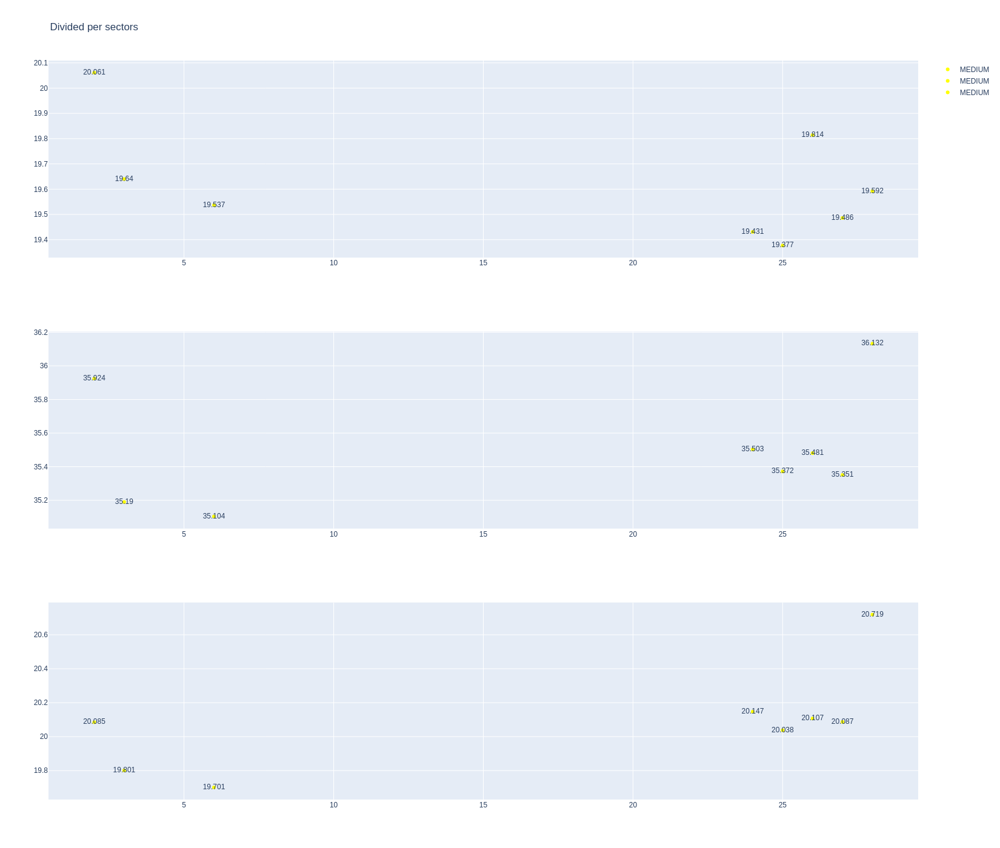

In [228]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [229]:
stintInformation.query('driver_number == 30 or driver_number == 6')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1261,9973,1,6,1,2,MEDIUM,0
15,1261,9973,1,30,1,5,MEDIUM,0
20,1261,9973,2,6,3,17,SOFT,0
31,1261,9973,2,30,6,8,MEDIUM,5
47,1261,9973,3,30,9,13,MEDIUM,8
66,1261,9973,4,30,14,21,SOFT,0
90,1261,9973,5,30,22,32,MEDIUM,8


In [230]:
data = libraryDataF1.getinfolongruns(jointables2,30,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [231]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [232]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [233]:
data = libraryDataF1.getinfolongruns(jointables2,6,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [234]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [235]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [236]:
stintInformation.query('driver_number == 31 or driver_number == 87')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
16,1261,9973,1,31,1,5,MEDIUM,0
19,1261,9973,1,87,1,5,SOFT,0
32,1261,9973,2,31,6,8,MEDIUM,5
34,1261,9973,2,87,6,8,SOFT,5
51,1261,9973,3,87,9,18,MEDIUM,0
52,1261,9973,3,31,9,20,SOFT,0
77,1261,9973,4,87,19,33,SOFT,8
89,1261,9973,4,31,21,33,MEDIUM,8


In [237]:
data = libraryDataF1.getinfolongruns(jointables2,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
36,Esteban OCON,MEDIUM,2025-05-23T15:03:20.977000+00:00,3,19.848,35.367,19.679,74.894
525,Esteban OCON,MEDIUM,2025-05-23T15:57:17.430000+00:00,29,19.941,35.569,20.111,75.621
544,Esteban OCON,MEDIUM,2025-05-23T15:58:32.943000+00:00,30,19.980,35.632,20.208,75.820
563,Esteban OCON,MEDIUM,2025-05-23T15:59:48.770000+00:00,31,19.945,35.649,20.244,75.838


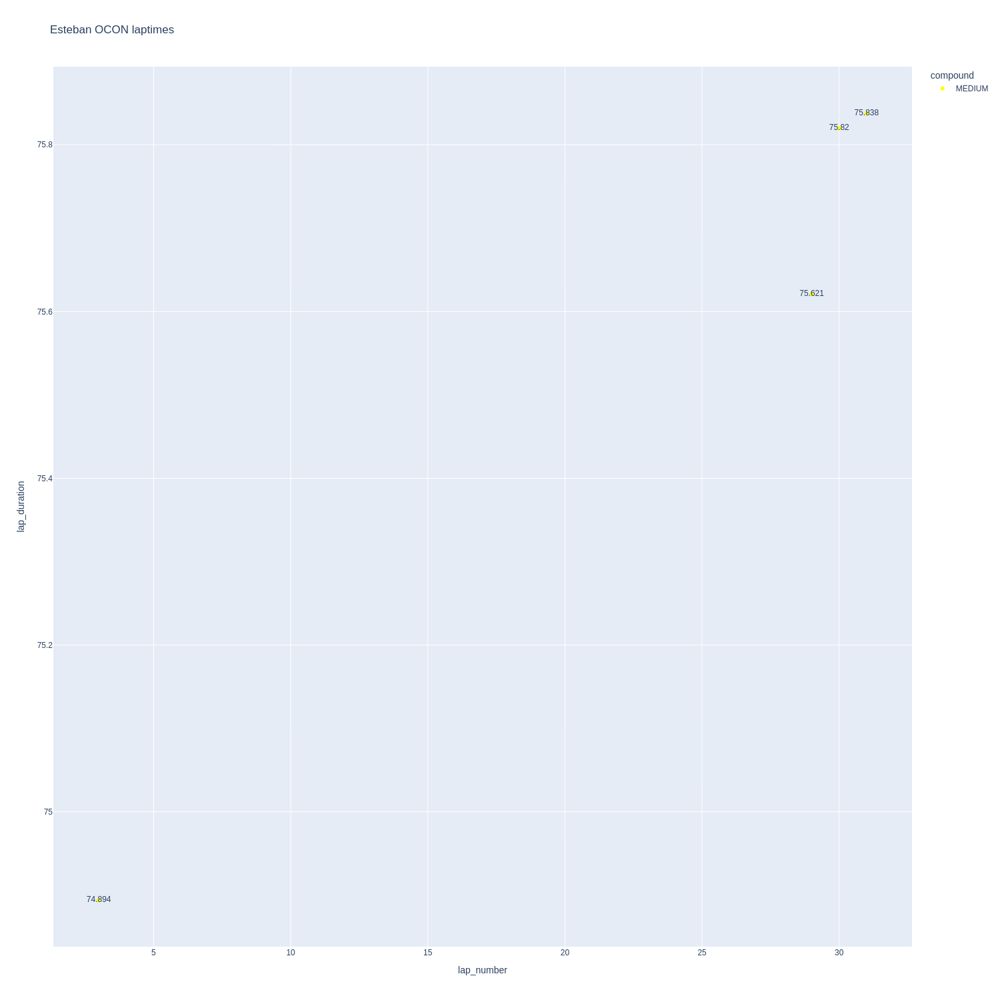

In [238]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

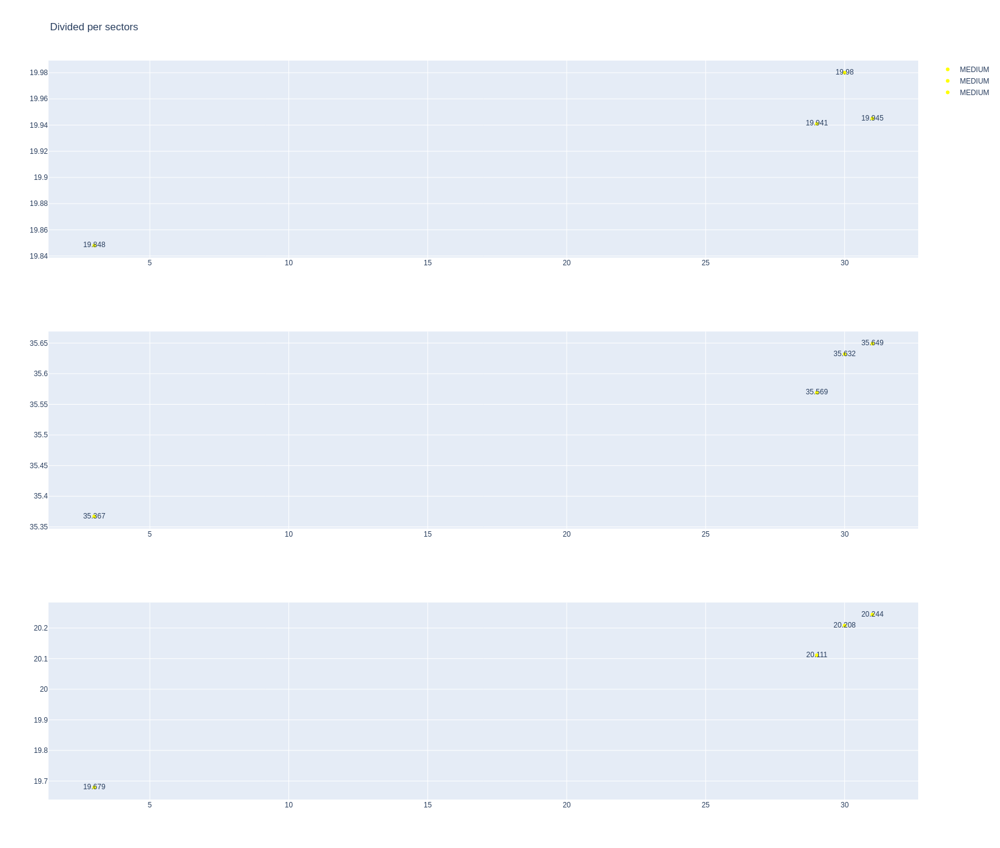

In [239]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [240]:
data = libraryDataF1.getinfolongruns(jointables2,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
33,Oliver BEARMAN,SOFT,2025-05-23T15:03:10.944000+00:00,3,19.565,35.219,19.829,74.613
388,Oliver BEARMAN,SOFT,2025-05-23T15:46:41.291000+00:00,21,20.134,35.880,20.275,76.289
432,Oliver BEARMAN,SOFT,2025-05-23T15:50:42.037000+00:00,24,19.898,35.935,20.022,75.855
449,Oliver BEARMAN,SOFT,2025-05-23T15:51:57.867000+00:00,25,19.845,35.891,20.082,75.818
466,Oliver BEARMAN,SOFT,2025-05-23T15:53:13.585000+00:00,26,19.798,35.511,19.898,75.207
483,Oliver BEARMAN,SOFT,2025-05-23T15:54:28.886000+00:00,27,19.675,35.768,19.847,75.290
502,Oliver BEARMAN,SOFT,2025-05-23T15:55:44.084000+00:00,28,19.563,35.947,19.752,75.262
521,Oliver BEARMAN,SOFT,2025-05-23T15:56:59.461000+00:00,29,19.871,35.784,20.326,75.981
540,Oliver BEARMAN,SOFT,2025-05-23T15:58:15.459000+00:00,30,19.811,35.669,20.095,75.575
558,Oliver BEARMAN,SOFT,2025-05-23T15:59:31.046000+00:00,31,19.694,35.570,19.786,75.050


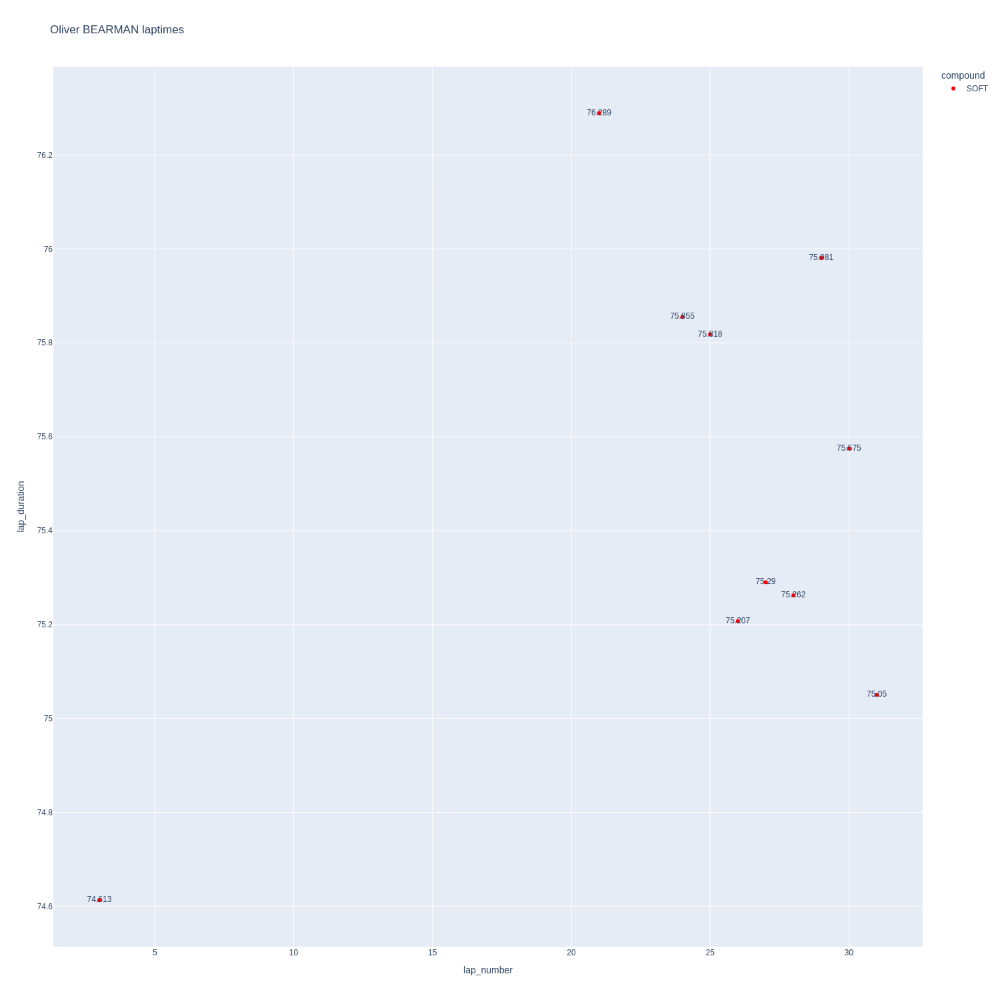

In [241]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

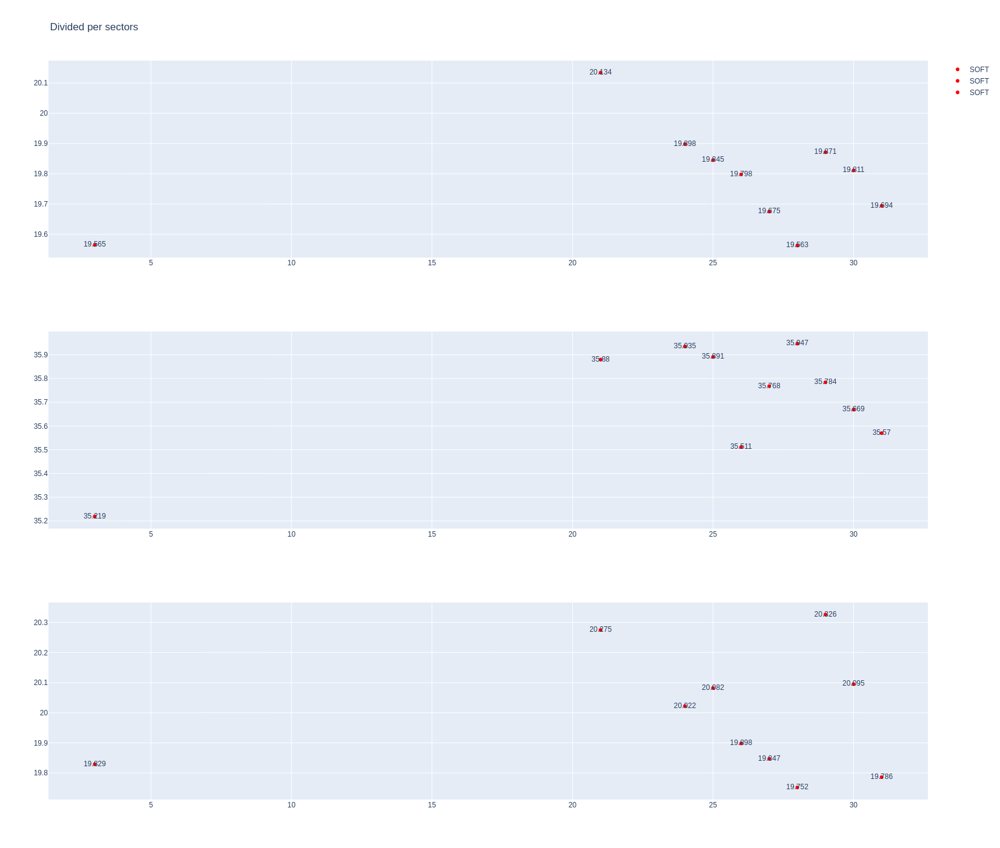

In [242]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [243]:
stintInformation.query('driver_number == 10 or driver_number == 43')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1261,9973,1,10,1,5,MEDIUM,0
17,1261,9973,1,43,1,5,MEDIUM,0
38,1261,9973,2,43,6,9,MEDIUM,0
39,1261,9973,2,10,6,10,MEDIUM,5
57,1261,9973,3,43,10,16,SOFT,0
58,1261,9973,3,10,11,22,SOFT,0
71,1261,9973,4,43,17,20,SOFT,7
83,1261,9973,5,43,21,31,MEDIUM,9
93,1261,9973,4,10,23,34,MEDIUM,0


In [244]:
data =libraryDataF1.getinfolongruns(jointables2,43,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
26,Franco COLAPINTO,MEDIUM,2025-05-23T15:02:34.440000+00:00,2,19.843,35.666,20.154,75.663
67,Franco COLAPINTO,MEDIUM,2025-05-23T15:05:27.449000+00:00,4,19.488,34.953,19.957,74.398
105,Franco COLAPINTO,MEDIUM,2025-05-23T15:15:14.051000+00:00,7,19.686,35.018,20.024,74.728
186,Franco COLAPINTO,SOFT,2025-05-23T15:27:14.968000+00:00,11,19.318,35.276,19.703,74.297
437,Franco COLAPINTO,MEDIUM,2025-05-23T15:51:03.772000+00:00,22,20.107,35.826,20.500,76.433
454,Franco COLAPINTO,MEDIUM,2025-05-23T15:52:20.117000+00:00,23,19.836,35.973,20.197,76.006
471,Franco COLAPINTO,MEDIUM,2025-05-23T15:53:36.057000+00:00,24,19.825,35.542,20.126,75.493
489,Franco COLAPINTO,MEDIUM,2025-05-23T15:54:51.604000+00:00,25,19.661,35.567,20.199,75.427
508,Franco COLAPINTO,MEDIUM,2025-05-23T15:56:07.088000+00:00,26,19.677,35.660,19.994,75.331
546,Franco COLAPINTO,MEDIUM,2025-05-23T15:58:40.396000+00:00,28,19.789,36.044,20.214,76.047


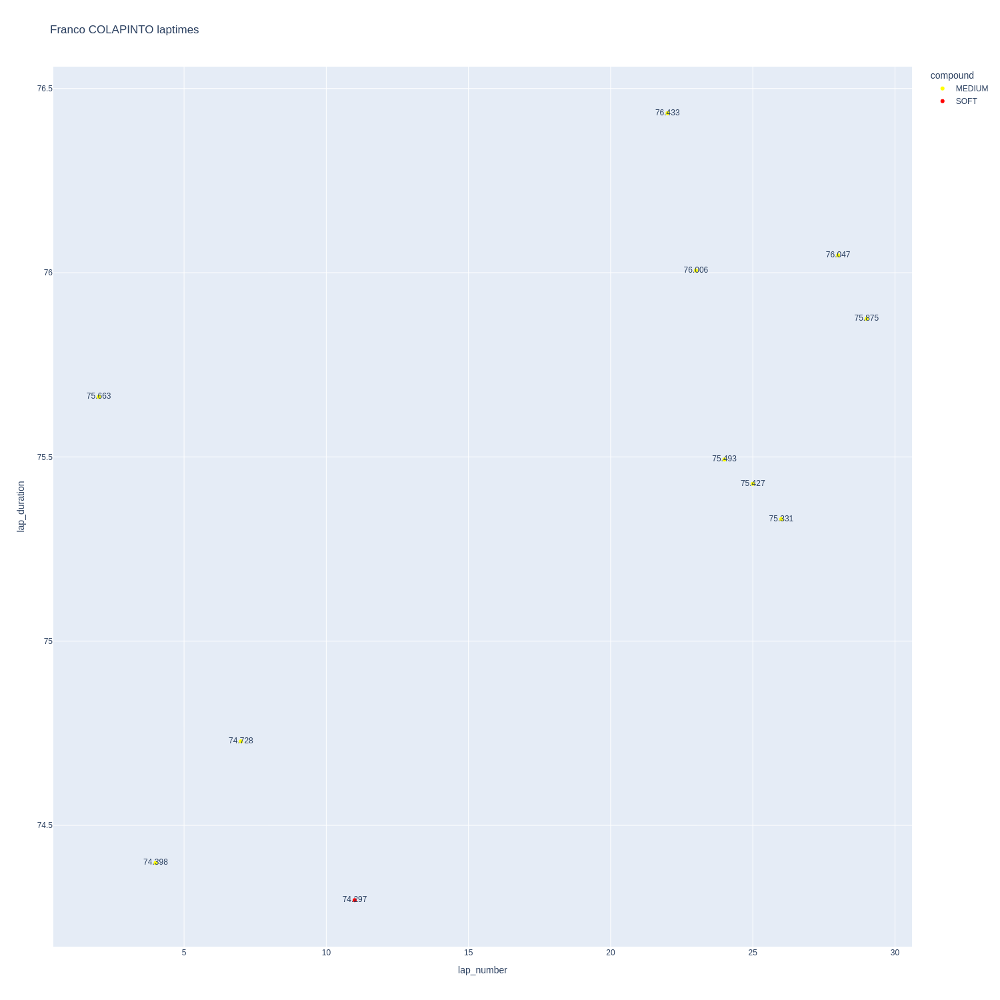

In [245]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

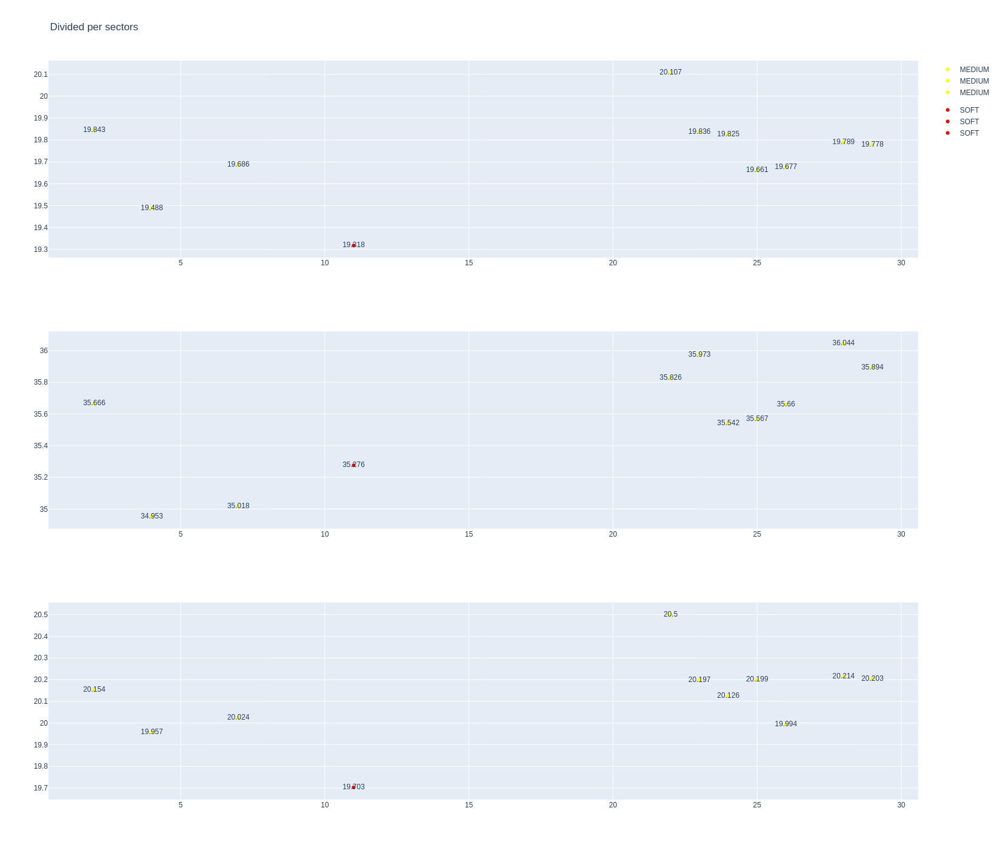

In [246]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [247]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
24,Pierre GASLY,MEDIUM,2025-05-23T15:02:16.800000+00:00,2,19.999,35.917,20.231,76.147
40,Pierre GASLY,MEDIUM,2025-05-23T15:03:32.919000+00:00,3,19.497,35.097,19.674,74.268
101,Pierre GASLY,MEDIUM,2025-05-23T15:14:50.353000+00:00,7,19.399,35.053,19.707,74.159
427,Pierre GASLY,MEDIUM,2025-05-23T15:50:21.490000+00:00,25,19.898,36.040,20.481,76.419
444,Pierre GASLY,MEDIUM,2025-05-23T15:51:37.959000+00:00,26,19.805,36.126,20.190,76.121
460,Pierre GASLY,MEDIUM,2025-05-23T15:52:54.002000+00:00,27,19.537,35.582,19.988,75.107
478,Pierre GASLY,MEDIUM,2025-05-23T15:54:09.104000+00:00,28,19.498,35.406,19.867,74.771
496,Pierre GASLY,MEDIUM,2025-05-23T15:55:23.980000+00:00,29,19.601,35.646,19.956,75.203
515,Pierre GASLY,MEDIUM,2025-05-23T15:56:39.095000+00:00,30,19.558,35.568,20.204,75.330
552,Pierre GASLY,MEDIUM,2025-05-23T15:59:14.062000+00:00,32,19.459,35.610,19.862,74.931


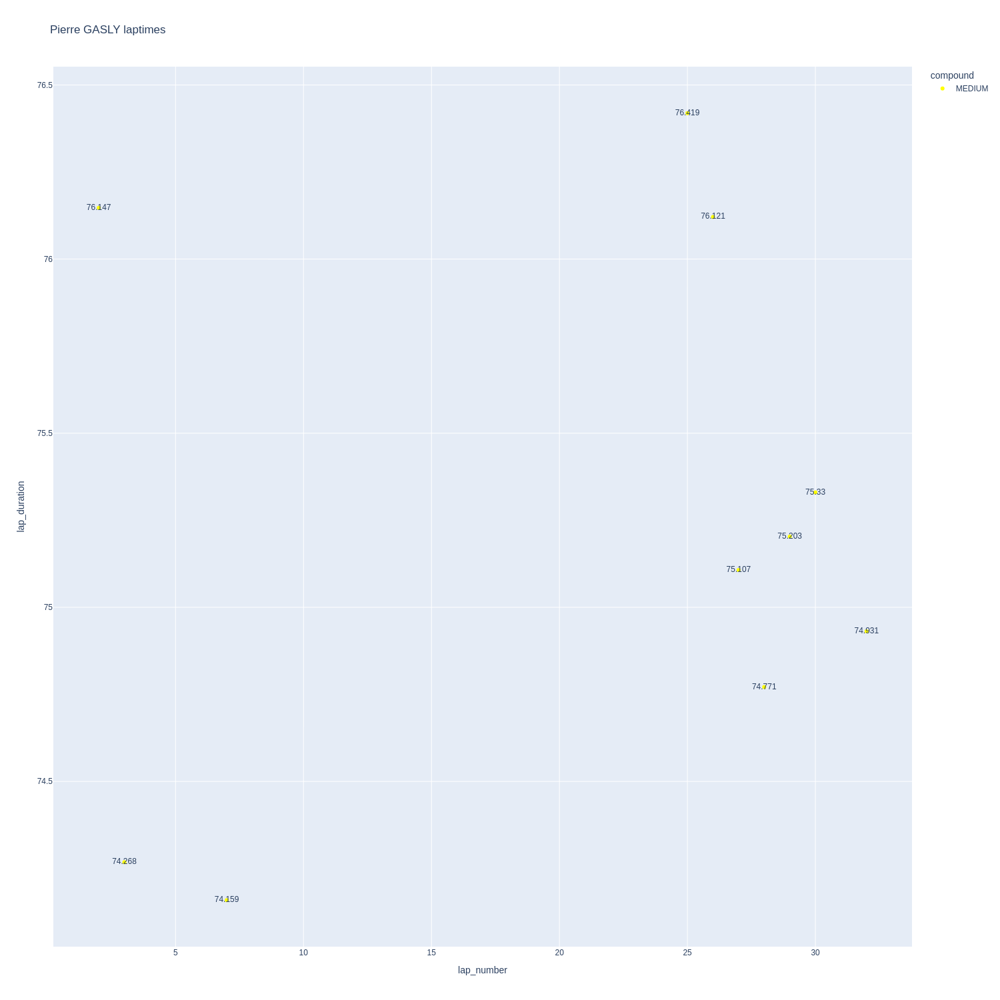

In [248]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

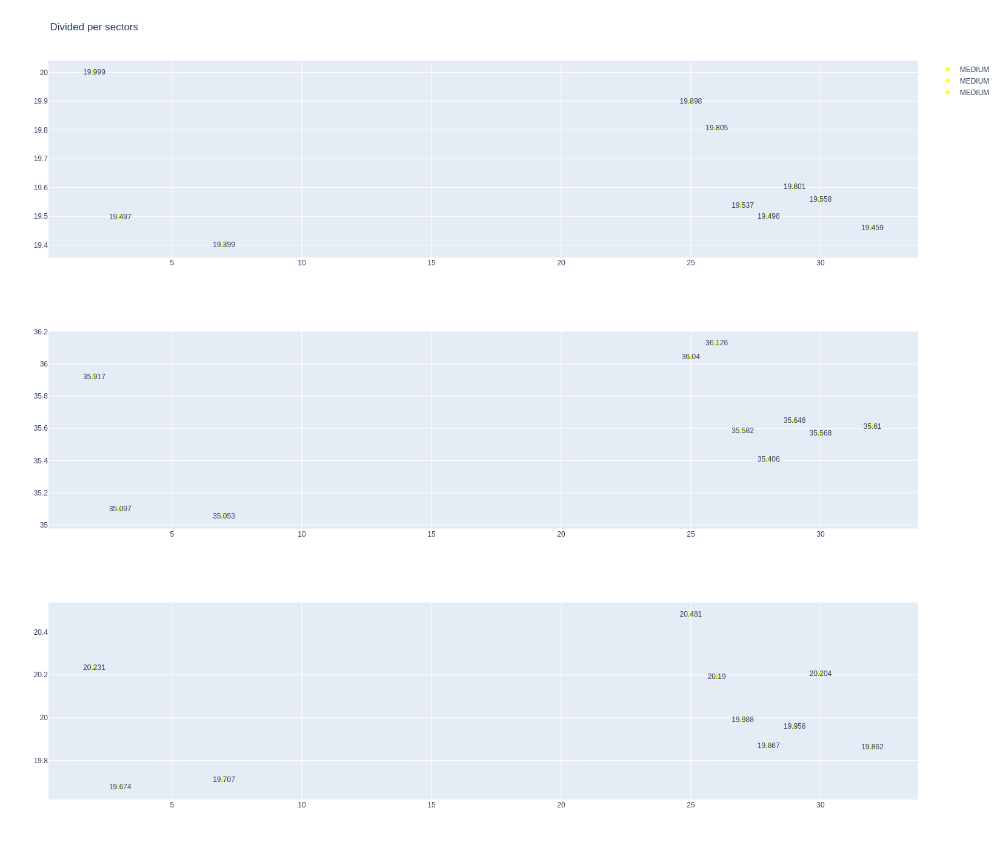

In [249]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [250]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1261,9973,1,55,1,4,SOFT,0
14,1261,9973,1,23,1,5,MEDIUM,0
27,1261,9973,2,55,5,8,SOFT,4
37,1261,9973,2,23,6,9,MEDIUM,5
43,1261,9973,3,55,9,11,SOFT,8
54,1261,9973,3,23,10,12,MEDIUM,9
59,1261,9973,4,55,12,19,MEDIUM,11
62,1261,9973,4,23,13,19,SOFT,0
78,1261,9973,5,55,20,20,SOFT,11
81,1261,9973,5,23,20,34,MEDIUM,12


In [251]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
382,Alexander ALBON,MEDIUM,2025-05-23T15:45:31.233000+00:00,21,19.980,35.524,20.214,75.718
390,Alexander ALBON,MEDIUM,2025-05-23T15:46:47.058000+00:00,22,19.729,35.260,19.951,74.940
416,Alexander ALBON,MEDIUM,2025-05-23T15:49:28.221000+00:00,24,19.921,36.097,20.362,76.380
433,Alexander ALBON,MEDIUM,2025-05-23T15:50:44.569000+00:00,25,19.661,35.523,20.151,75.335
485,Alexander ALBON,MEDIUM,2025-05-23T15:54:39.807000+00:00,28,19.864,35.808,20.259,75.931
504,Alexander ALBON,MEDIUM,2025-05-23T15:55:55.771000+00:00,29,19.773,35.725,20.156,75.654
523,Alexander ALBON,MEDIUM,2025-05-23T15:57:11.321000+00:00,30,19.921,35.825,20.173,75.919
542,Alexander ALBON,MEDIUM,2025-05-23T15:58:27.240000+00:00,31,20.000,35.955,20.335,76.290
561,Alexander ALBON,MEDIUM,2025-05-23T15:59:43.610000+00:00,32,19.787,36.028,20.158,75.973


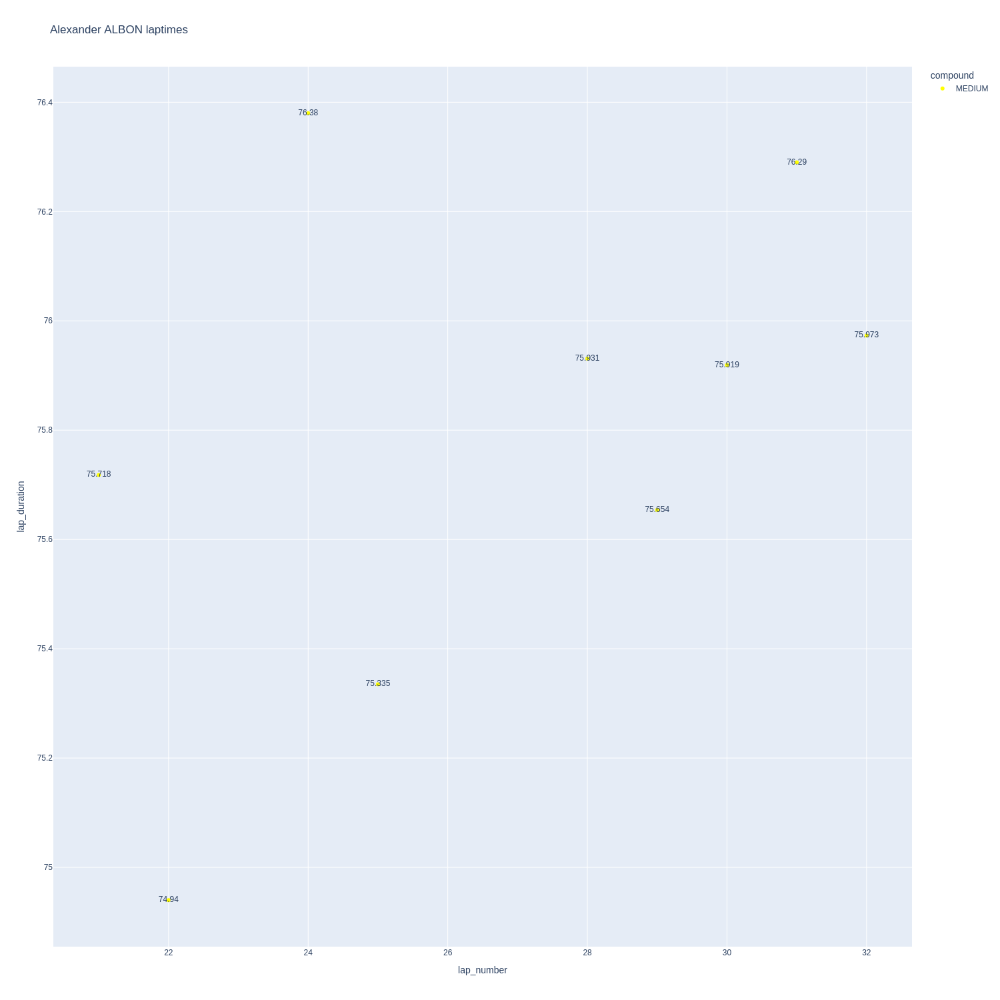

In [252]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

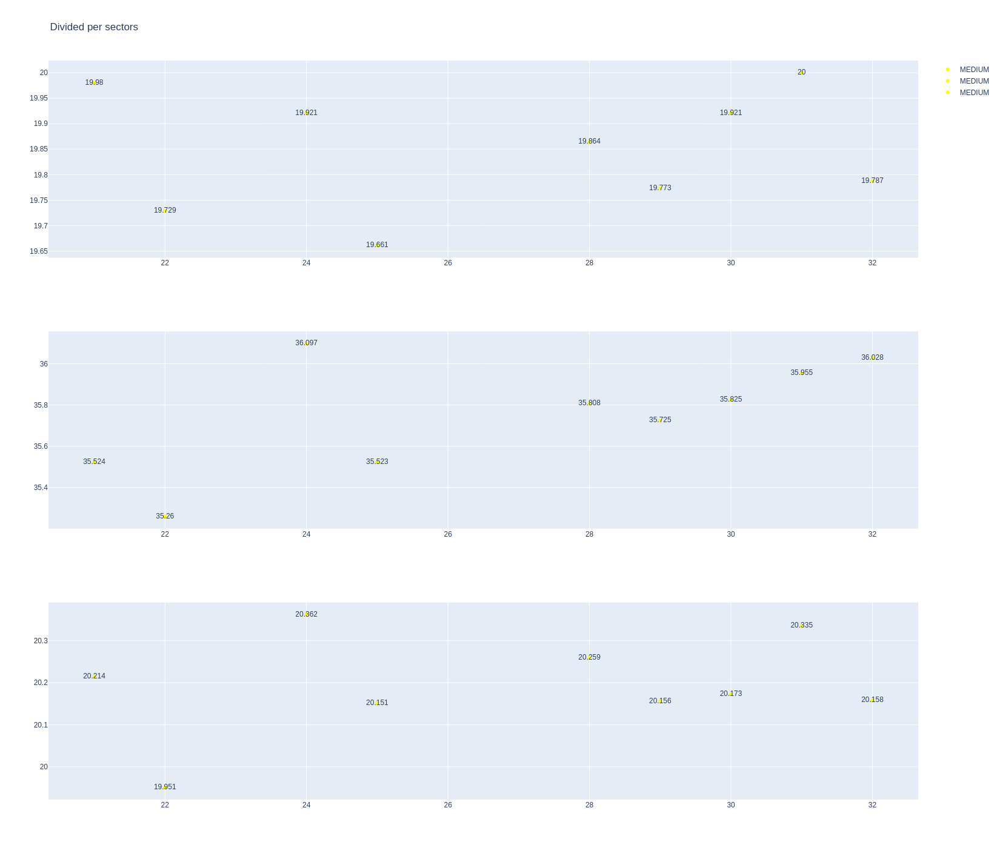

In [253]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [254]:
data= libraryDataF1.getinfolongruns(jointables2,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
43,Carlos SAINZ,SOFT,2025-05-23T15:03:49.481000+00:00,2,19.780,35.128,19.702,74.610
438,Carlos SAINZ,MEDIUM,2025-05-23T15:51:10.475000+00:00,24,19.665,35.477,20.015,75.157
472,Carlos SAINZ,MEDIUM,2025-05-23T15:53:44.729000+00:00,26,19.716,35.362,19.893,74.971
490,Carlos SAINZ,MEDIUM,2025-05-23T15:54:59.730000+00:00,27,19.595,35.471,19.875,74.941
509,Carlos SAINZ,MEDIUM,2025-05-23T15:56:14.614000+00:00,28,19.552,35.580,19.884,75.016
528,Carlos SAINZ,MEDIUM,2025-05-23T15:57:29.618000+00:00,29,19.664,35.835,20.013,75.512
547,Carlos SAINZ,MEDIUM,2025-05-23T15:58:45.179000+00:00,30,19.727,36.217,20.079,76.023


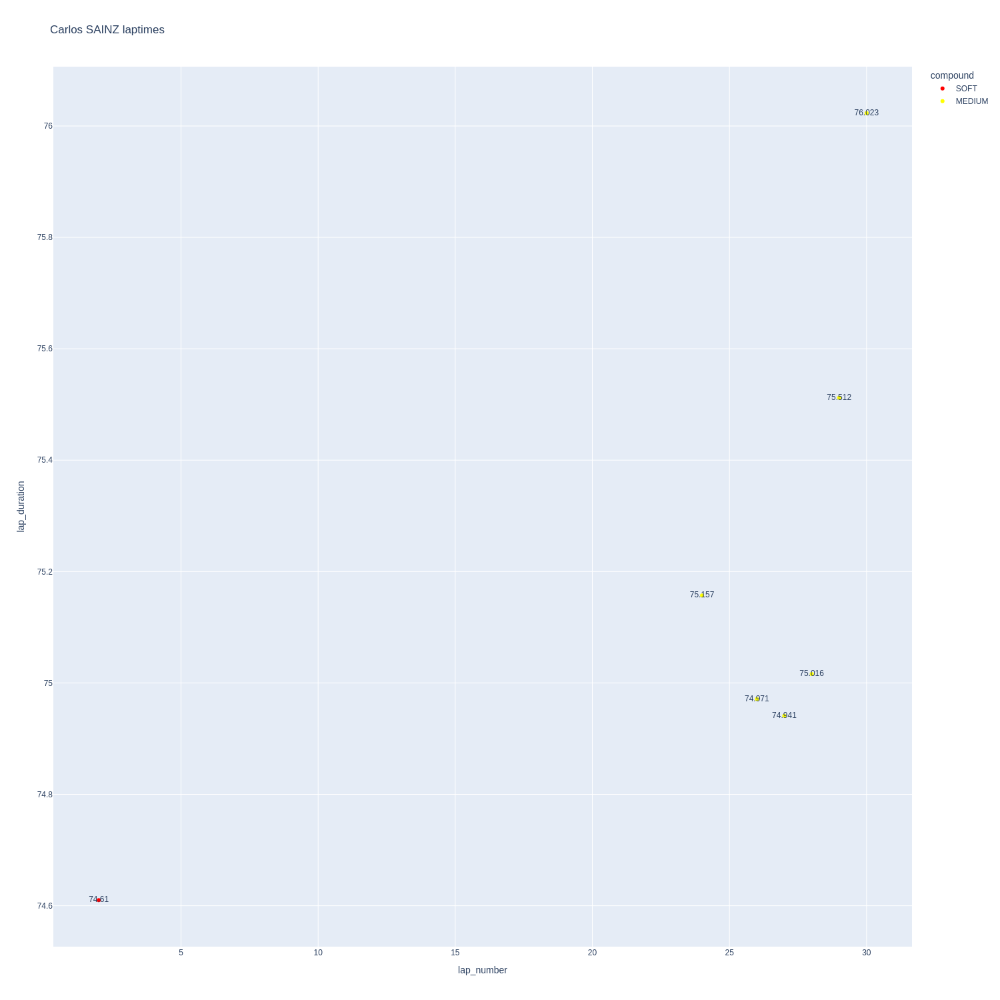

In [255]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

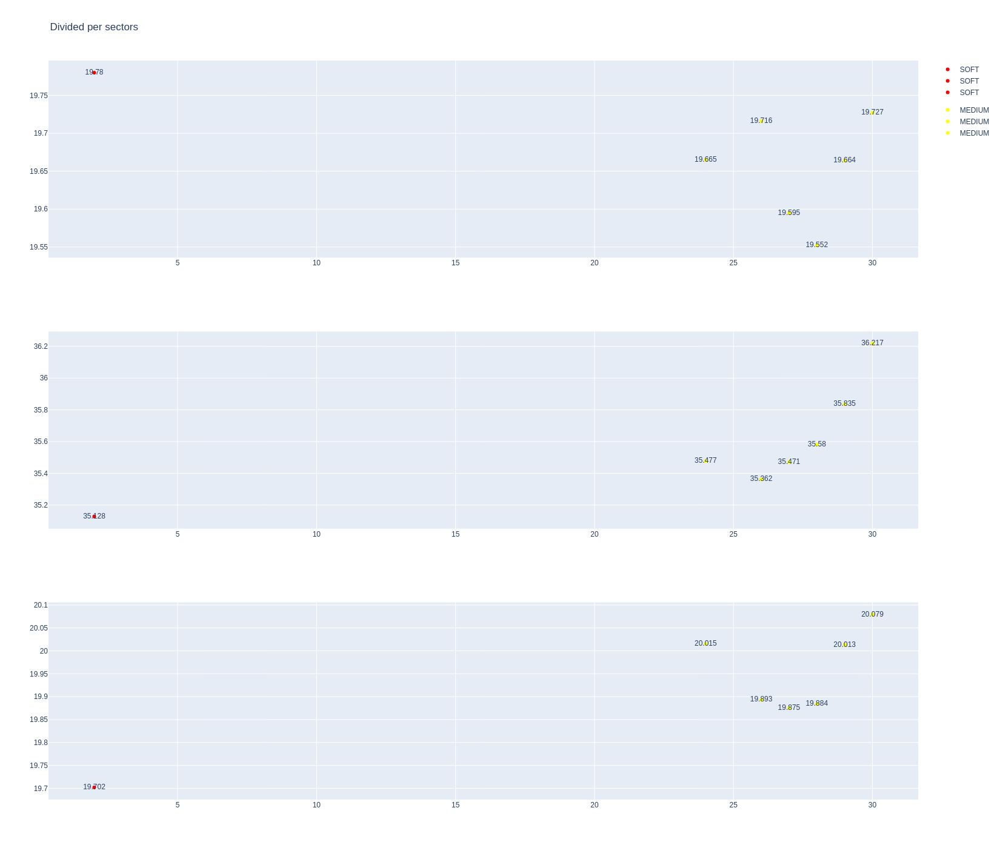

In [256]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [257]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1261,9973,1,27,1,4,HARD,0
11,1261,9973,1,5,1,5,HARD,0
30,1261,9973,2,27,5,9,HARD,4
35,1261,9973,2,5,6,9,HARD,5
55,1261,9973,3,5,10,14,SOFT,0
56,1261,9973,3,27,10,16,SOFT,0
69,1261,9973,4,5,15,19,SOFT,0
73,1261,9973,4,27,17,28,SOFT,0
79,1261,9973,5,5,20,29,SOFT,10
94,1261,9973,5,27,29,32,HARD,9


In [258]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
46,Nico HULKENBERG,HARD,2025-05-23T15:04:00.825000+00:00,3,19.528,35.127,19.595,74.250
373,Nico HULKENBERG,SOFT,2025-05-23T15:43:45.801000+00:00,18,19.996,35.481,19.990,75.467
379,Nico HULKENBERG,SOFT,2025-05-23T15:45:01.248000+00:00,19,19.921,35.511,19.800,75.232
386,Nico HULKENBERG,SOFT,2025-05-23T15:46:16.436000+00:00,20,19.914,35.391,20.192,75.497
393,Nico HULKENBERG,SOFT,2025-05-23T15:47:31.958000+00:00,21,19.716,35.317,19.796,74.829
441,Nico HULKENBERG,SOFT,2025-05-23T15:51:26.397000+00:00,24,19.827,35.209,19.745,74.781
458,Nico HULKENBERG,SOFT,2025-05-23T15:52:41.227000+00:00,25,19.753,35.736,20.024,75.513
494,Nico HULKENBERG,SOFT,2025-05-23T15:55:15.542000+00:00,27,19.673,35.773,20.034,75.480
556,Nico HULKENBERG,HARD,2025-05-23T15:59:24.280000+00:00,30,19.778,35.623,20.320,75.721


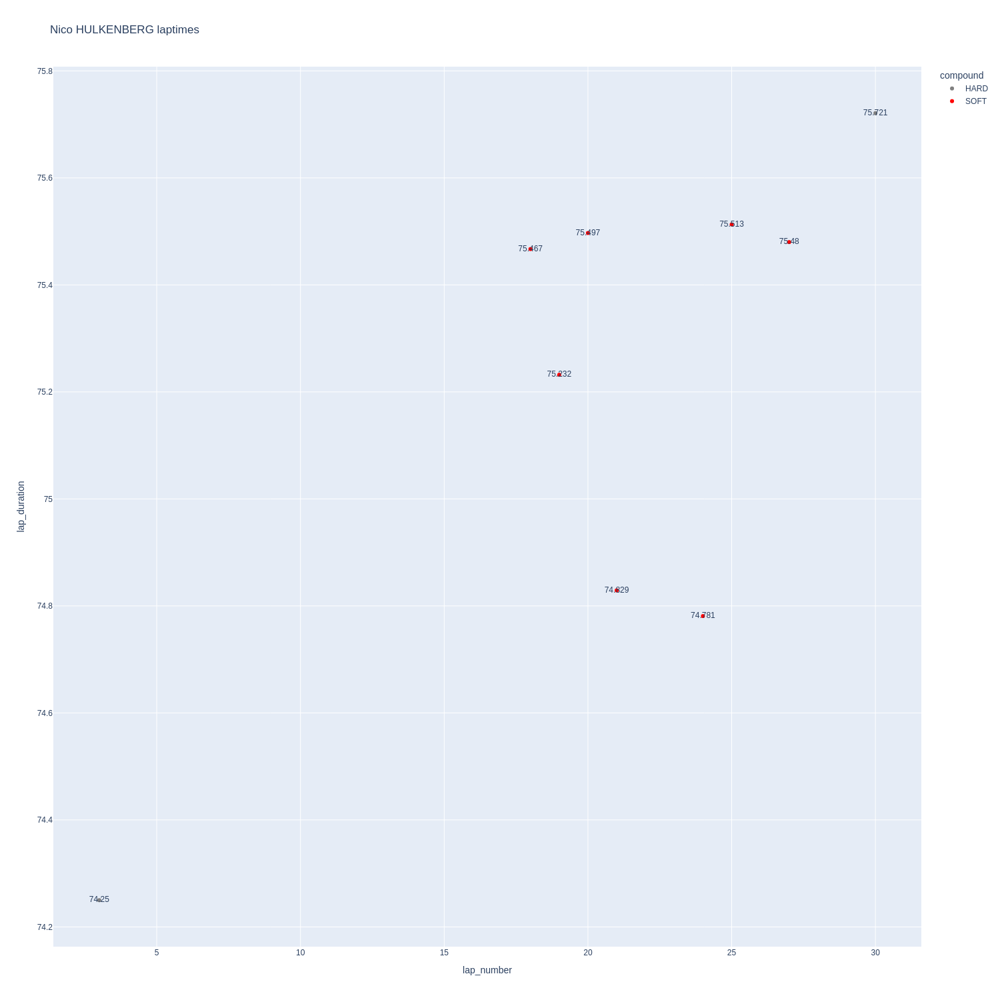

In [259]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

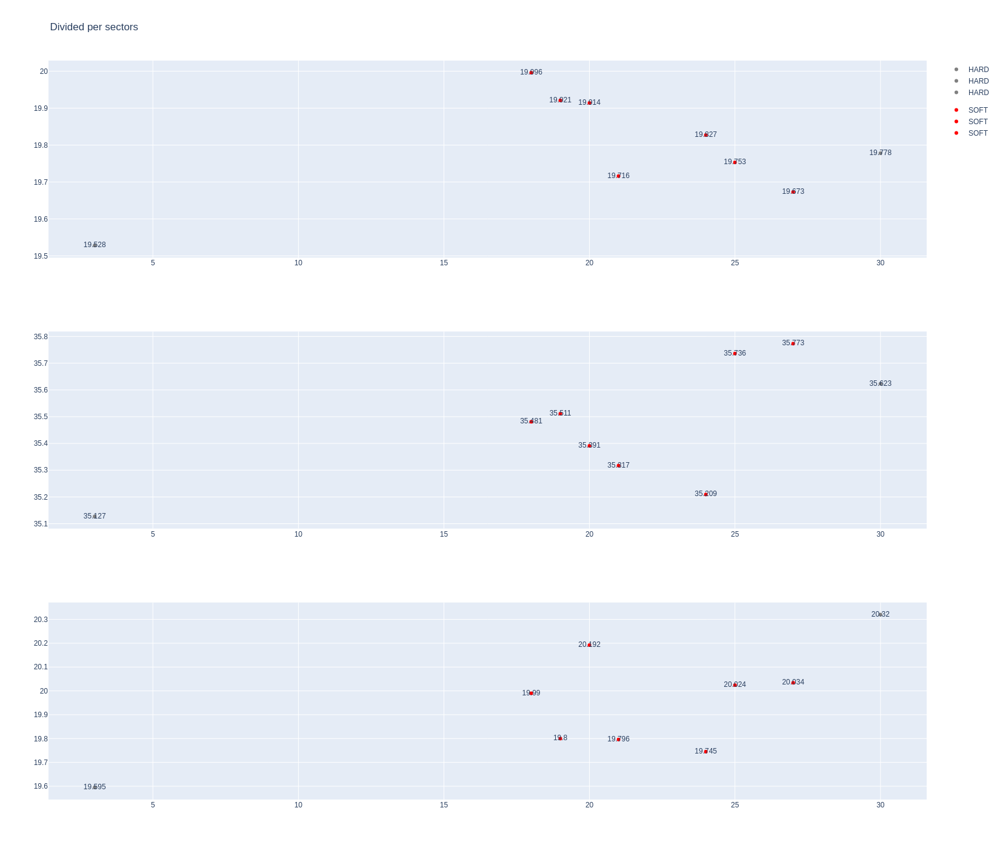

In [260]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [261]:
data = libraryDataF1.getinfolongruns(jointables2,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
70,Gabriel BORTOLETO,HARD,2025-05-23T15:05:40.320000+00:00,4,19.890,35.222,19.638,74.750
448,Gabriel BORTOLETO,SOFT,2025-05-23T15:51:54.445000+00:00,21,19.872,36.144,19.921,75.937
465,Gabriel BORTOLETO,SOFT,2025-05-23T15:53:10.364000+00:00,22,19.624,35.814,19.975,75.413
482,Gabriel BORTOLETO,SOFT,2025-05-23T15:54:25.792000+00:00,23,19.698,35.852,20.291,75.841
501,Gabriel BORTOLETO,SOFT,2025-05-23T15:55:41.665000+00:00,24,19.790,35.864,20.213,75.867
520,Gabriel BORTOLETO,SOFT,2025-05-23T15:56:57.363000+00:00,25,19.771,35.720,20.090,75.581


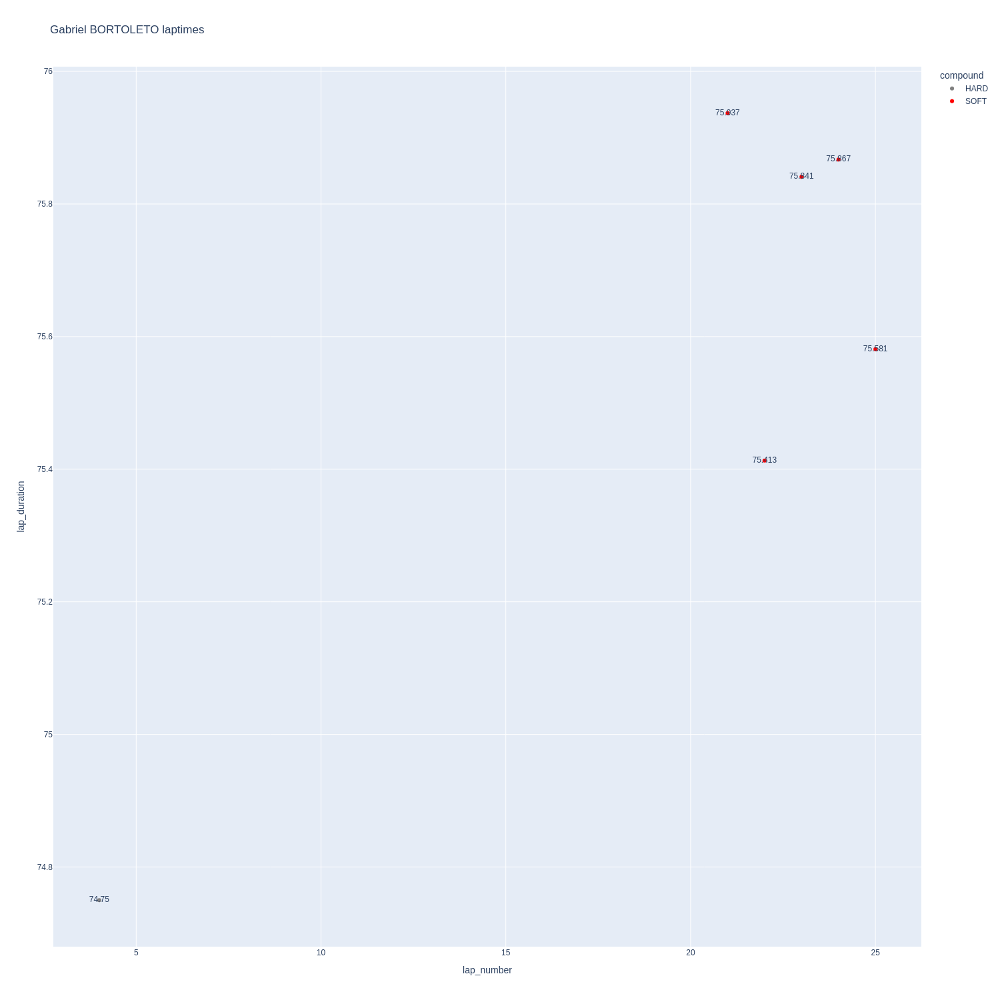

In [262]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

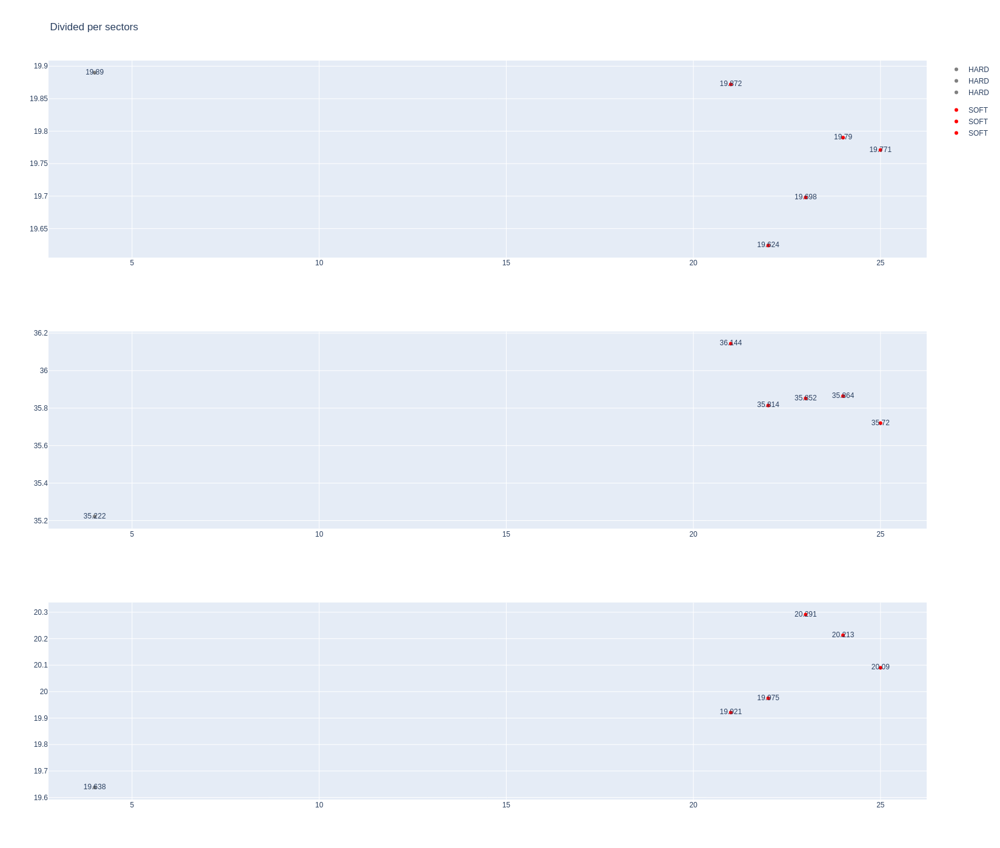

In [263]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [264]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration

In [265]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [266]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
17,Oscar PIASTRI,SOFT,74.455000,19.588500,35.102500,19.764000
6,Charles LECLERC,HARD,74.474400,19.483600,35.278600,19.712200
14,Lewis HAMILTON,MEDIUM,74.957571,19.560429,35.445571,19.951571
1,Lando NORRIS,MEDIUM,75.010714,19.617857,35.576714,19.816143
15,Carlos SAINZ,MEDIUM,75.175714,19.671286,35.581429,19.923000
10,Nico HULKENBERG,SOFT,75.196667,19.789556,35.463111,19.944000
7,Lance STROLL,MEDIUM,75.210000,19.617250,35.507125,20.085625
4,Kimi ANTONELLI,MEDIUM,75.230333,19.679889,35.365444,20.185000
3,Pierre GASLY,MEDIUM,75.245600,19.625100,35.604500,20.016000
0,Max VERSTAPPEN,MEDIUM,75.245667,19.938333,35.459000,19.848333


##### Sorted by sector 1

In [267]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
6,Charles LECLERC,HARD,19.483600
14,Lewis HAMILTON,MEDIUM,19.560429
17,Oscar PIASTRI,SOFT,19.588500
7,Lance STROLL,MEDIUM,19.617250
1,Lando NORRIS,MEDIUM,19.617857
3,Pierre GASLY,MEDIUM,19.625100
15,Carlos SAINZ,MEDIUM,19.671286
4,Kimi ANTONELLI,MEDIUM,19.679889
13,Franco COLAPINTO,MEDIUM,19.728000
11,Liam LAWSON,MEDIUM,19.742750


##### Sorted by sector 2

In [268]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
17,Oscar PIASTRI,SOFT,35.102500
6,Charles LECLERC,HARD,35.278600
4,Kimi ANTONELLI,MEDIUM,35.365444
14,Lewis HAMILTON,MEDIUM,35.445571
0,Max VERSTAPPEN,MEDIUM,35.459000
10,Nico HULKENBERG,SOFT,35.463111
7,Lance STROLL,MEDIUM,35.507125
12,Esteban OCON,MEDIUM,35.554250
16,George RUSSELL,MEDIUM,35.564600
1,Lando NORRIS,MEDIUM,35.576714


##### Sorted by sector 3

In [269]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
6,Charles LECLERC,HARD,19.712200
17,Oscar PIASTRI,SOFT,19.764000
1,Lando NORRIS,MEDIUM,19.816143
0,Max VERSTAPPEN,MEDIUM,19.848333
15,Carlos SAINZ,MEDIUM,19.923000
10,Nico HULKENBERG,SOFT,19.944000
14,Lewis HAMILTON,MEDIUM,19.951571
18,Oliver BEARMAN,SOFT,19.991200
3,Pierre GASLY,MEDIUM,20.016000
2,Gabriel BORTOLETO,SOFT,20.021333


#### Long runs mean

In [270]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [271]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
14,L HAMILTON,74.958
1,L NORRIS,75.011
4,K ANTONELLI,75.190
7,L STROLL,75.210
0,M VERSTAPPEN,75.246
3,P GASLY,75.246
15,C SAINZ,75.270
16,G RUSSELL,75.529
13,F COLAPINTO,75.540
12,E OCON,75.543


In [272]:
libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
17,O PIASTRI,74.455
10,N HULKENBERG,75.257
18,O BEARMAN,75.494
2,G BORTOLETO,75.728


In [273]:
libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
6,C LECLERC,74.474


## Free Practice 3
### Obtain setup

In [4]:
practice = libraryDataF1.obtain_information('laps',session_key=9974)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9974)
drivers = libraryDataF1.obtain_information('drivers',session_key=9974)

In [5]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

In [7]:
session = ff1.get_session(2025, 8, 'FP3')
session.load();

core           INFO 	Loading data for Monaco Grand Prix - Practice 3 [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for _extended_timing_data. Loading data.

### Speed trap

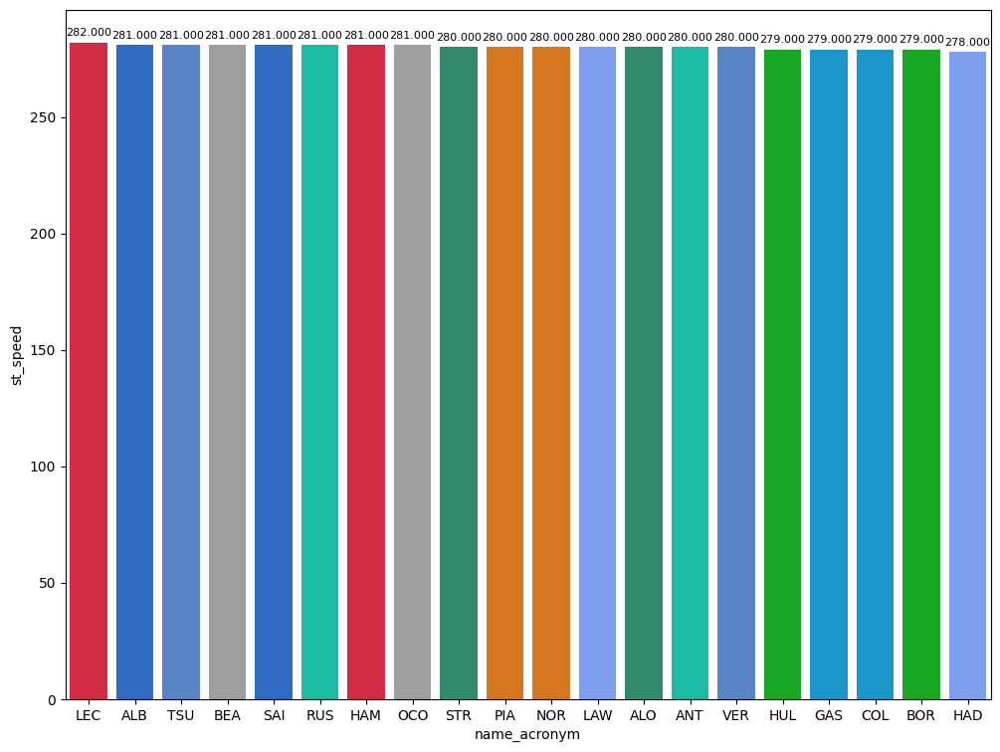

In [8]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

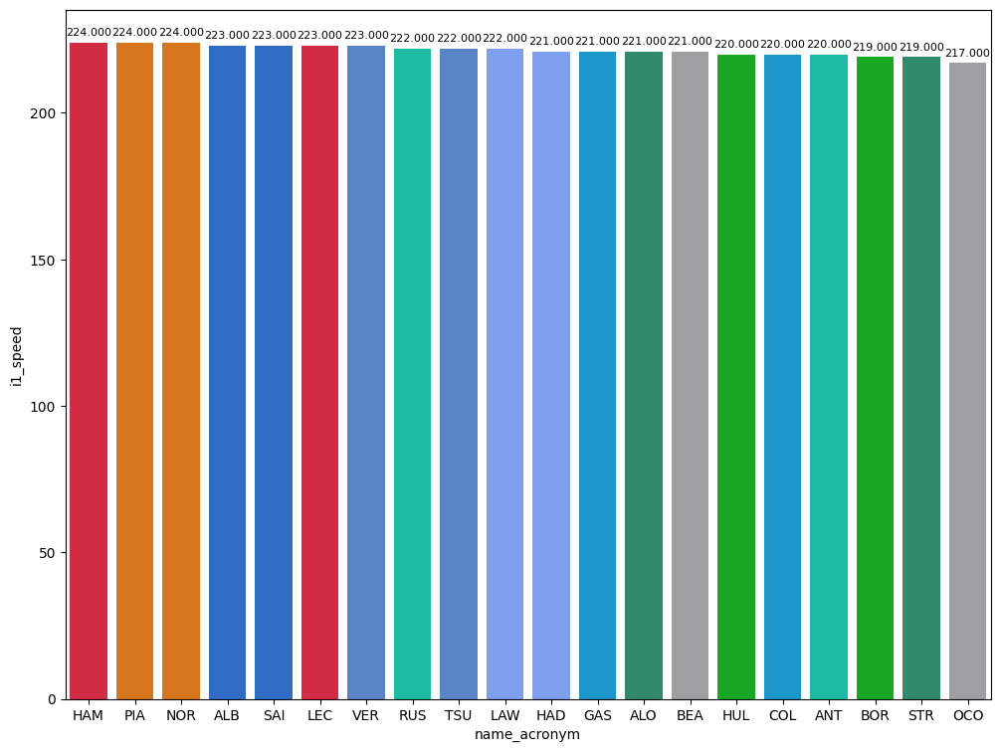

In [9]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

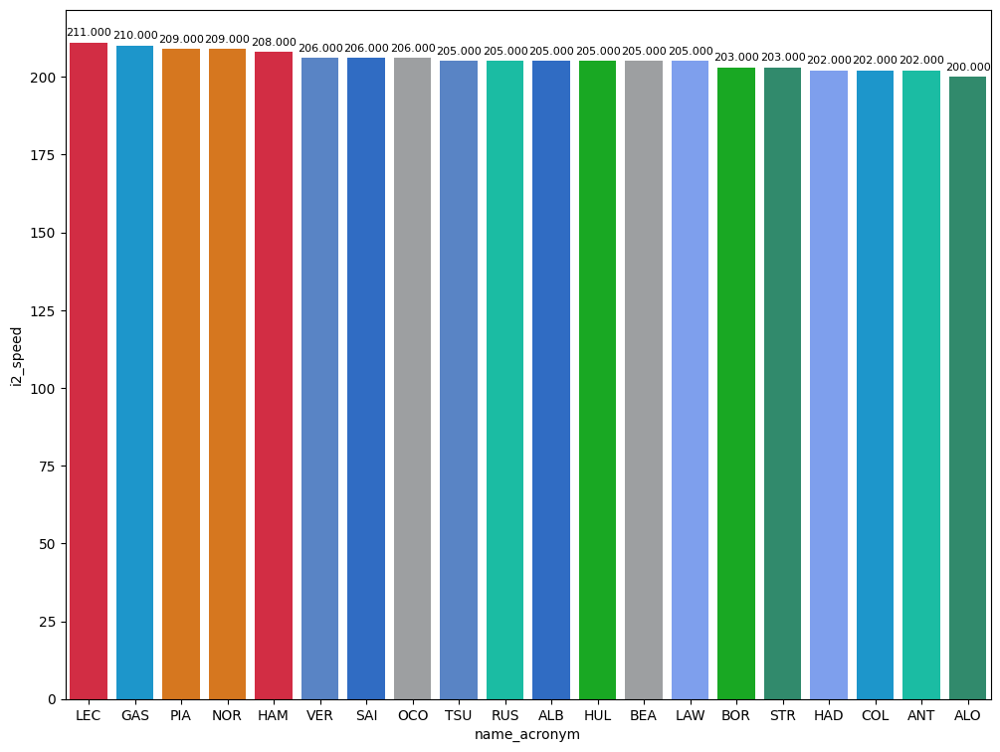

In [10]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [11]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
8,Fernando ALONSO,HARD,24.658,38.890,41.591,105.139
232,Max VERSTAPPEN,MEDIUM,18.515,33.774,18.944,71.233
454,Charles LECLERC,SOFT,18.396,33.660,18.897,70.953


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [12]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


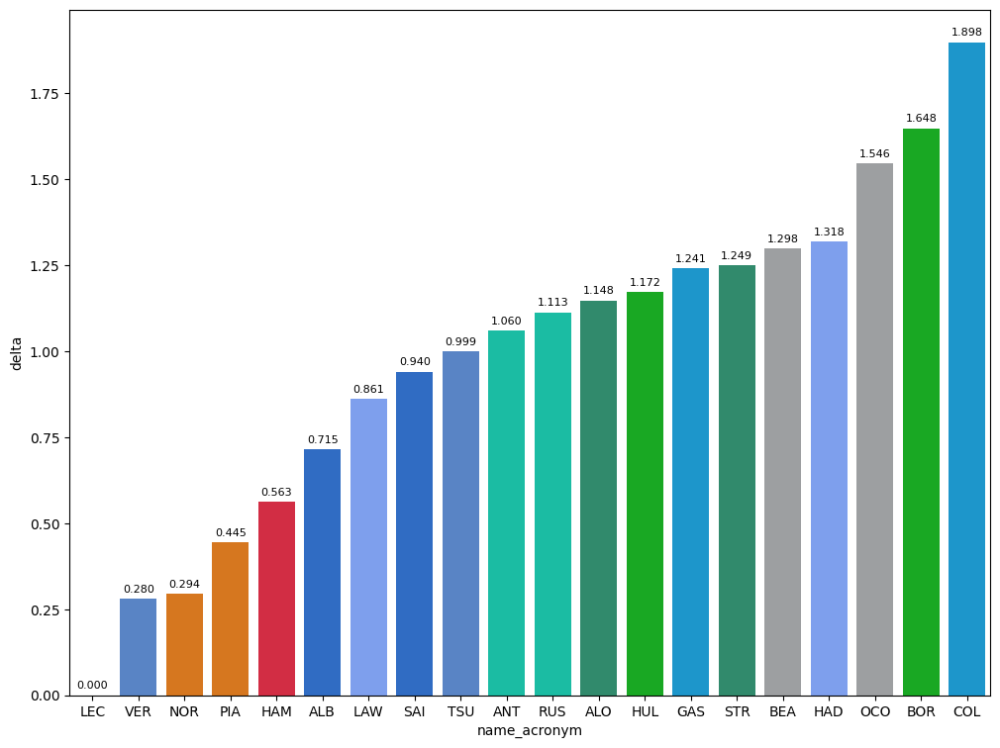

In [13]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

<b>Sector 1:</b> Piastri was the fastest in sector 1 but Verstappen and Russell were close to Piastri. As we can see in delta section, Hamilton finished P2 but in this sector he was the 14th fastest being 5 tenths slower than Piastri but if he can replicate Russell's laptime, he will be able to opt to take the pole.
<br>
<b>Sector 2:</b> In sector 2 we can a close battle among them, as well. But, in this sector, Aston Martin is not far, being one tenth behind Norris. 
<br>
<b>Sector 3:</b> Unlike the first and second sector, Mercedes was the team that leaded the pace in this sector.

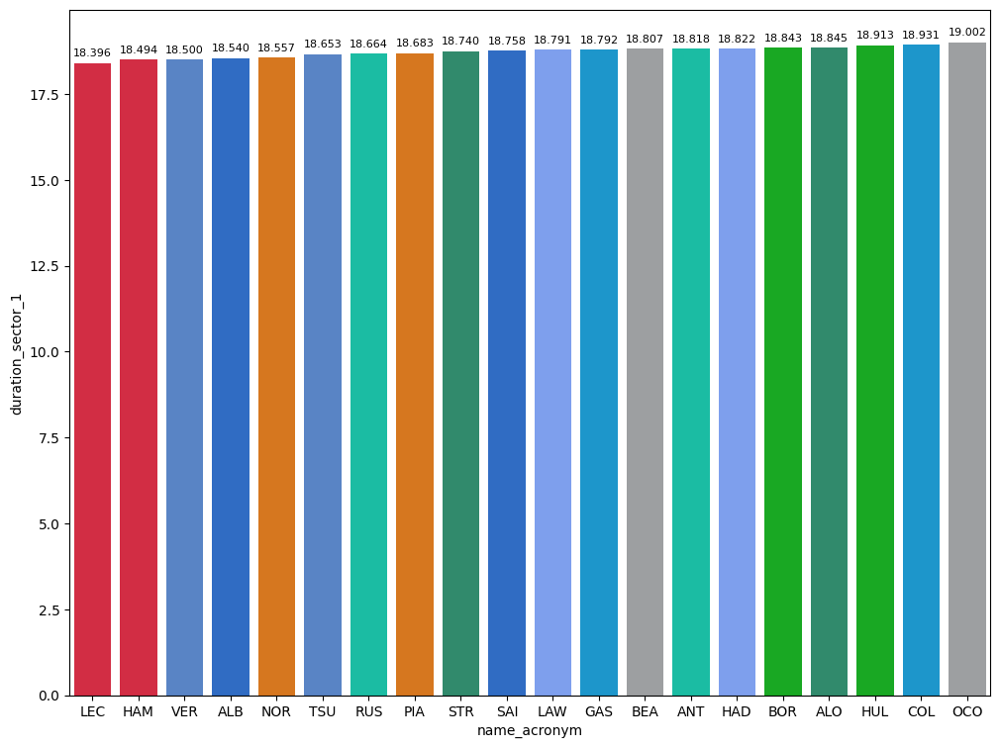

In [14]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

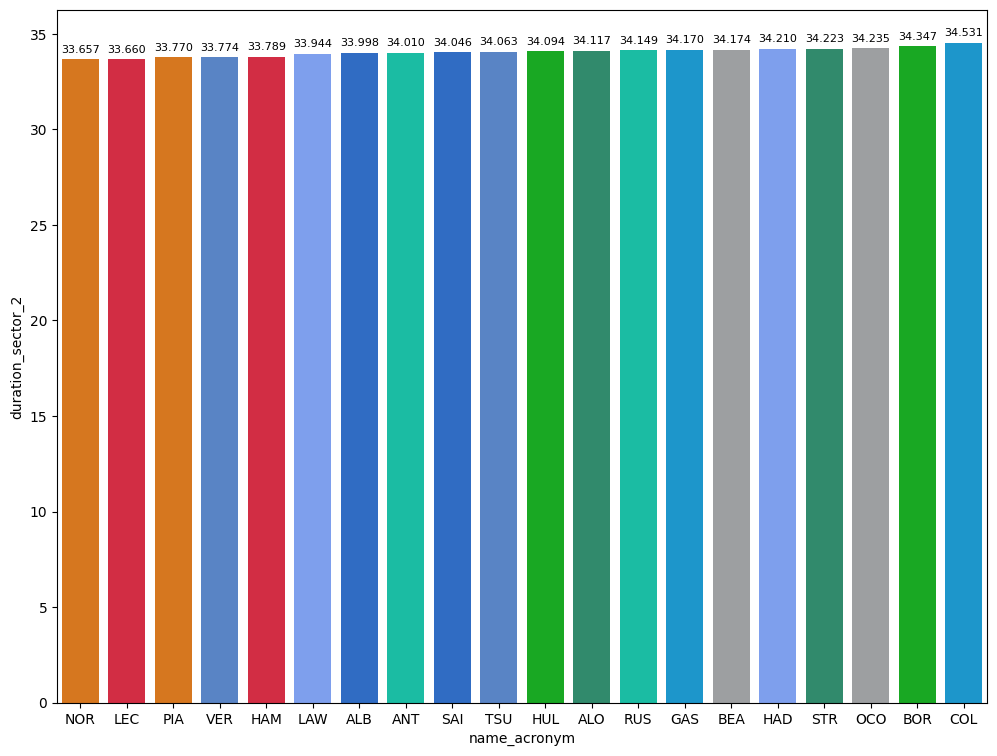

In [15]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

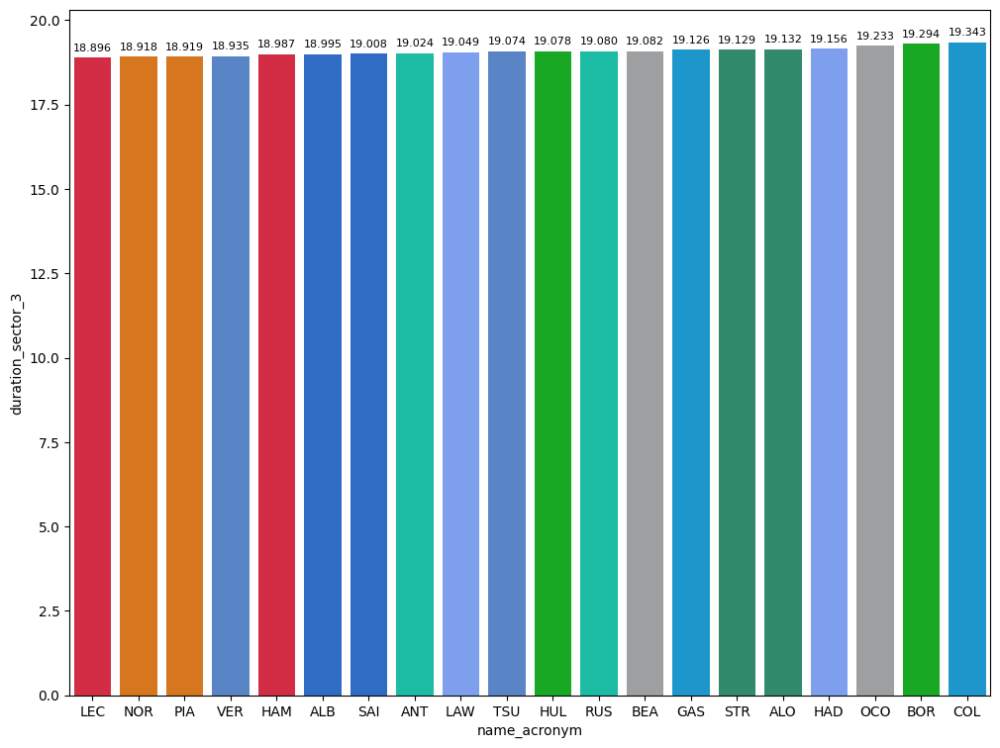

In [16]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [17]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 78").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,72.831067
MEDIUM,73.118000


### Comparaison between the poleman and the second

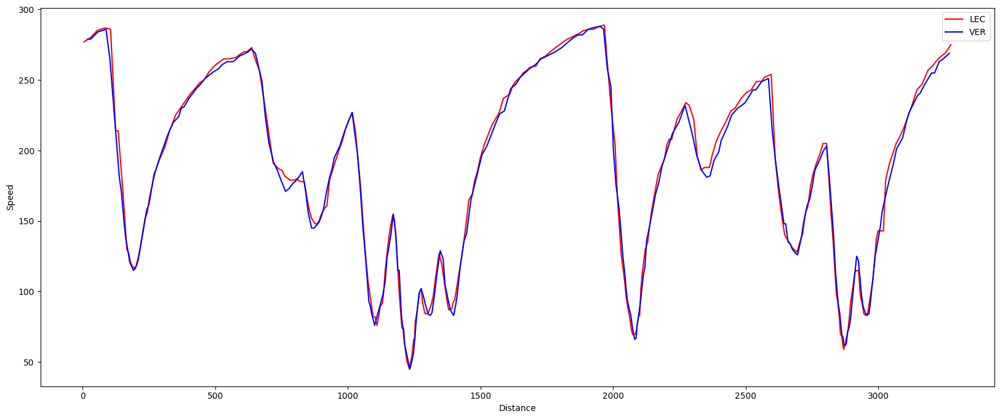

In [18]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

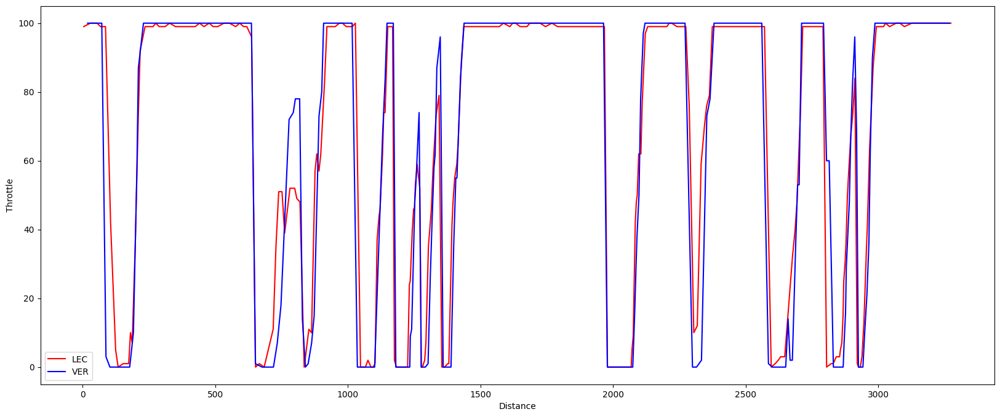

In [19]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

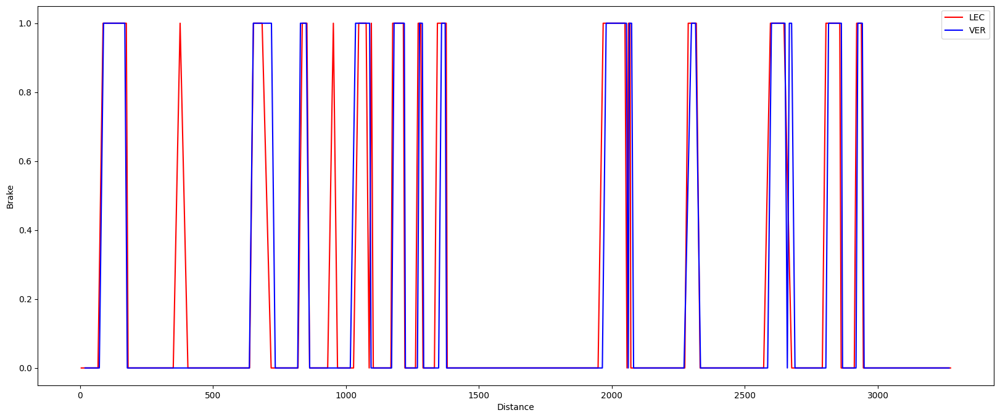

In [20]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

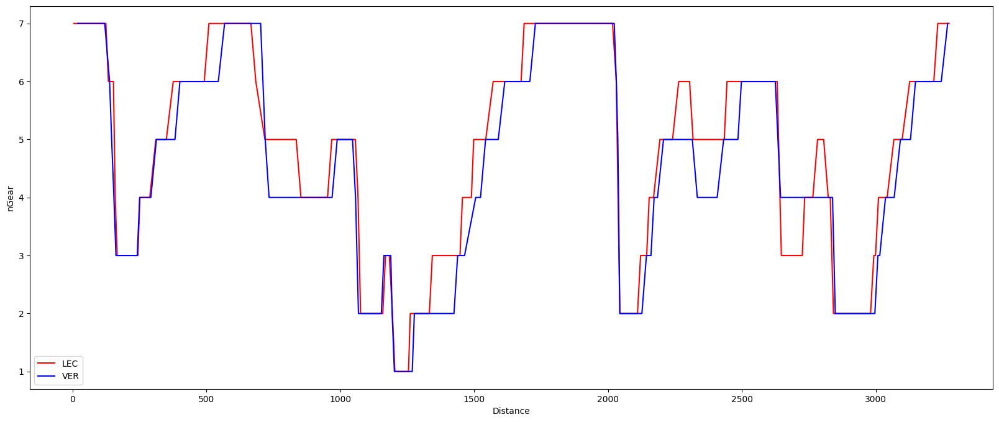

In [21]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session.

In [39]:
libraryDataF1.obtain_information('race_control',session_key=9975).query('message.str.contains("OPEN")',engine='python')

,meeting_key,session_key,date,driver_number,lap_number,category,flag,scope,sector,message
1,1261,9975,2025-05-24T14:00:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
44,1261,9975,2025-05-24T14:29:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
57,1261,9975,2025-05-24T14:44:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
67,1261,9975,2025-05-24T15:03:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN


In [40]:
libraryDataF1.obtain_information('race_control',session_key=9975).query('message.str.contains("DELETED")',engine='python')

,meeting_key,session_key,date,driver_number,lap_number,category,flag,scope,sector,message
2,1261,9975,2025-05-24T14:05:09+00:00,None,None,Other,None,None,NaN,CAR 10 (GAS) TIME 1:38.777 DELETED - TRACK LIM...
3,1261,9975,2025-05-24T14:06:12+00:00,None,None,Other,None,None,NaN,CAR 55 (SAI) TIME 1:42.829 DELETED - TRACK LIM...
4,1261,9975,2025-05-24T14:06:13+00:00,None,None,Other,None,None,NaN,CAR 55 (SAI) TIME 1:42.829 DELETED - TRACK LIM...
5,1261,9975,2025-05-24T14:06:14+00:00,None,None,Other,None,None,NaN,CAR 55 (SAI) TIME 1:42.829 DELETED - TRACK LIM...
6,1261,9975,2025-05-24T14:06:44+00:00,None,None,Other,None,None,NaN,CAR 5 (BOR) TIME 1:16.057 DELETED - TRACK LIMI...
7,1261,9975,2025-05-24T14:06:57+00:00,None,None,Other,None,None,NaN,CAR 12 (ANT) TIME 1:40.471 DELETED - TRACK LIM...
8,1261,9975,2025-05-24T14:08:41+00:00,None,None,Other,None,None,NaN,CAR 12 (ANT) TIME 1:45.507 DELETED - TRACK LIM...
9,1261,9975,2025-05-24T14:08:51+00:00,None,None,Other,None,None,NaN,CAR 23 (ALB) TIME 1:44.082 DELETED - TRACK LIM...
10,1261,9975,2025-05-24T14:09:00+00:00,None,None,Other,None,None,NaN,CAR 55 (SAI) TIME 1:43.600 DELETED - TRACK LIM...
11,1261,9975,2025-05-24T14:09:39+00:00,None,None,Other,None,None,NaN,CAR 63 (RUS) TIME 1:49.685 DELETED - TRACK LIM...


### Obtain setup

In [54]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9975)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9975)
drivers = libraryDataF1.obtain_information('drivers',session_key=9975)
libraryDataF1.obtain_drivers_colours(drivers)

In [42]:
session = ff1.get_session(2025, 8, 'Q')
session.load()
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

logger      WARNING 	Failed to load schedule from FastF1 backend!
req            INFO 	No cached data found for season_schedule. Loading data...
_api           INFO 	Fetching season schedule...
req            INFO 	Data has been written to cache!
core           INFO 	Loading data for Monaco Grand Prix - Qualifying [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 

To obtain a better analysis, those laptimes deleted will be removed from this analysis in order to obtain the data with valid values. So that,taking into account the race control table, it will be neccesary to consult the qualyfing data to obtain the ids. 

In [ ]:
# qualyfing = qualyfing.drop(12)
# qualyfing = qualyfing.drop(33)
# qualyfing = qualyfing.drop(118)
# qualyfing = qualyfing.drop(203)

In [59]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)
bestlap[0:1]

,meeting_key,session_key,driver_number,lap_number,date_start,duration_sector_1,duration_sector_2,duration_sector_3,i1_speed,i2_speed,is_pit_out_lap,lap_duration,segments_sector_1,segments_sector_2,segments_sector_3,st_speed
373,1261,9975,4,21,2025-05-24T15:05:09.245000+00:00,18.402,33.473,18.589,223.0,213.0,False,70.464,"[2049, 2051, 2049, 2049, 2049, 2049]","[2049, 2049, 2049, 2049, 2049, 2049, 2051, 205...","[2051, 2051, 2051, 2049, 2049]",279.0


In [64]:
qualyfing.query("driver_number == 4")

,meeting_key,session_key,driver_number,lap_number,date_start,duration_sector_1,duration_sector_2,duration_sector_3,i1_speed,i2_speed,is_pit_out_lap,lap_duration,segments_sector_1,segments_sector_2,segments_sector_3,st_speed
39,1261,9975,4,1,2025-05-24T14:03:33.850000+00:00,26.421,47.431,33.226,156.0,184.0,True,107.078,"[2064, 2049, 2049, 2049, 2049, 2049]","[2049, 2049, 2049, 2049, 2049, 2049, 2049, 204...","[2049, 2049, 2049, 2049, 2049]",242.0
61,1261,9975,4,2,2025-05-24T14:05:20.156000+00:00,19.256,34.544,19.060,214.0,196.0,False,72.860,"[2049, 2049, 2049, 2049, 2051, 2049]","[2051, 2051, 2049, 2049, 2051, 2049, 2051, 204...","[2049, 2049, 2051, 2049, 2051]",280.0
78,1261,9975,4,3,2025-05-24T14:06:33.146000+00:00,25.163,47.396,NaN,111.0,163.0,False,NaN,"[2048, 2048, 2048, 2048, 2048, 2048]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 204...","[0, 0, 0, 0, 0]",243.0
100,1261,9975,4,4,2025-05-24T14:08:12.232000+00:00,18.806,33.840,18.950,217.0,205.0,False,79.257,"[2049, 2049, 2049, 2048, 2051, 2049]","[2051, 2051, 2049, 2051, 2048, 2049, 2048, 204...","[2051, 2049, 2048, 2049, 2048]",280.0
115,1261,9975,4,5,2025-05-24T14:09:23.773000+00:00,25.155,46.054,NaN,63.0,148.0,False,NaN,"[2048, 2048, 2048, 2048, 2048, 2048]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 204...","[0, 0, 0, 0, 0]",215.0
131,1261,9975,4,6,2025-05-24T14:10:57.696000+00:00,18.803,33.794,22.692,220.0,199.0,False,75.289,"[None, 2049, 2048, 2048, 2048, 2049]","[2051, 2051, 2051, 2048, 2049, 2048, 2048, 204...","[0, 0, 0, 0, 0]",279.0
145,1261,9975,4,7,2025-05-24T14:12:09.446000+00:00,24.975,45.799,44.073,131.0,121.0,False,89.916,"[None, 2048, 2048, 2048, 2048, 2048]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 204...","[2048, 2048, 2048, 2064, 2064]",209.0
170,1261,9975,4,8,2025-05-24T14:14:05.355000+00:00,31.986,44.581,NaN,156.0,190.0,True,NaN,"[2064, 2048, 2048, 2048, 2048, 2048]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 204...","[0, 0, 0, 0, 0]",243.0
193,1261,9975,4,9,2025-05-24T14:15:45.199000+00:00,18.755,40.085,24.345,221.0,169.0,False,83.185,"[2048, 2049, 2049, 2049, 2048, 2049]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 204...","[0, 0, 0, 0, 0]",227.0
210,1261,9975,4,10,2025-05-24T14:17:15.435000+00:00,18.694,33.817,18.774,NaN,207.0,False,83.856,"[2049, 2049, 2049, 2048, 2048, 2048]","[2048, 2048, 2048, 2048, 2048, 2048, 2048, 204...","[2049, 2051, 2051, 2049, 2048]",280.0


In this case, the fastest lap is 70.464 seconds (1.10.464= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 (75.39 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [60]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < 76.69")

In [61]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
In this chart we can see the deltas with compared with the fastest lap of the session that it could be different than the pole.

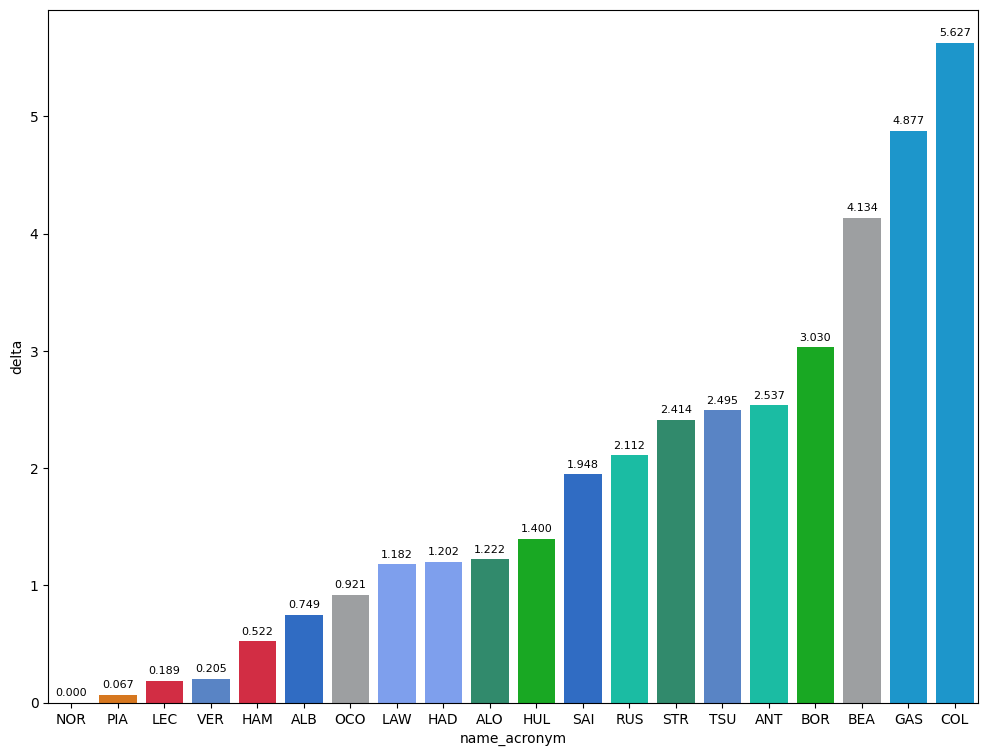

In [62]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

In [ ]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

In [ ]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [ ]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [ ]:
maximumDateQ1 = "date_start <'2025-05-24T14:29:00+00:00'"
maximumDateQ2 = "date_start <'2025-05-24T15:03:00+00:00' and date_start >'2025-05-24T14:29:00+00:00'"
maximumDateQ3 = "date_start >'2025-05-24T15:03:00+00:00'"

### Qualyfing 1
In this session the surprise came from Aston Martin with Fernando that knocked-out in Q1. The rest of the drivers were expected to be knocked-out

In [ ]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [ ]:
#Reference
P15 = q1Data[14:15]

In [ ]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

In [ ]:
q1Data[15::]

##### Analysis of each sector of the driver at risk compared to the drivers eliminated.


In [ ]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

In [ ]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.

In [ ]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

#### Best sector per driver
In this section we can see the best sector of the session

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2
In this session, both Alpine,Albon,Stroll and Perez knocked out. Perez was so close to make it through Q3 but his first sector was bad.

In [ ]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [ ]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
RB had a good pace being able to pass to Q3 eliminating Perez in Q2

In [ ]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

In [ ]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
Both Mercedes would have suffered for their third sector losing 1.5 tenths.

In [ ]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

#### Best sector per driver
In this section we can see the best sector of the session

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [ ]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [ ]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
As we saw in the free practices, pole position was going to be very close among Red Bull, Ferrari and McLaren. Verstappen took the pole but, as other grand prix, he suffered a lot to get it. His first sector, with two tenths of difference compared to his rivals, afforded to Verstappen to take the pole.

In [ ]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

#### Best sector per driver
In this section we can see the best sector of the session

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

In [ ]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Comparaison between the poleman and the second

In [ ]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

In [ ]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

In [ ]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

In [ ]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [90]:
race = libraryDataF1.obtain_information('laps',session_key=9979)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9979)
drivers = libraryDataF1.obtain_information('drivers',session_key=9979)
libraryDataF1.obtain_drivers_colours(drivers)

In [91]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [92]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Mean pace with the different compound used on the session

In [93]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 80").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
MEDIUM,76.878372
HARD,77.040280
SOFT,77.388256


### Tyre Strategies

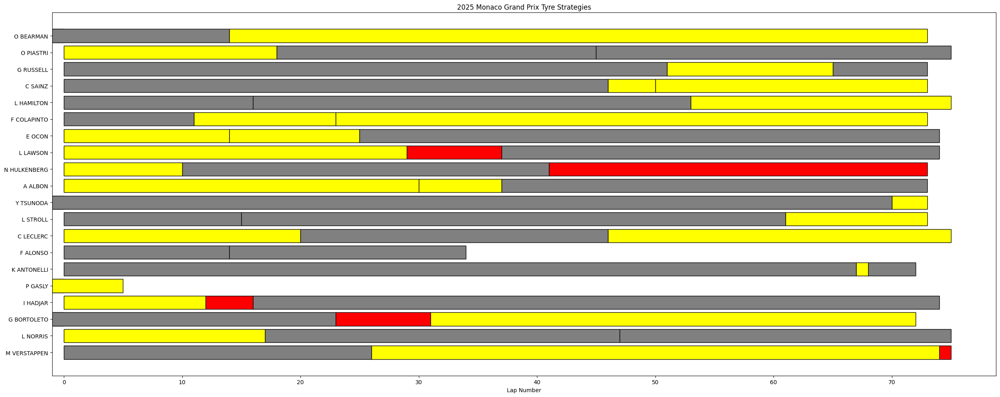

In [94]:
libraryDataF1.race_strategies("2025 Monaco Grand Prix Tyre Strategies",drivers,stintInformation)

### Lap Time Distributions

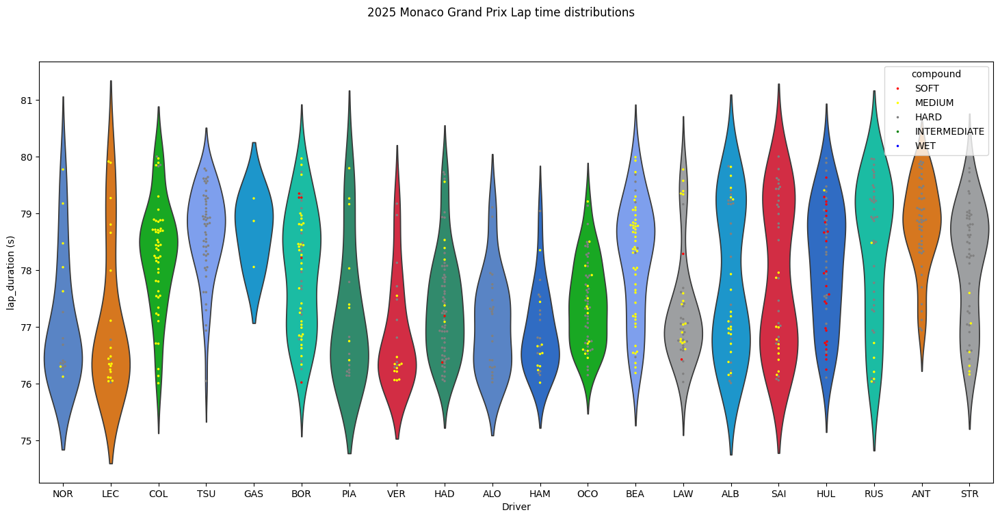

In [95]:
libraryDataF1.lap_time_distributions("2025 Monaco Grand Prix Lap time distributions",drivers,jointables.query("lap_duration<80 and lap_duration>76"))

### Speed trap

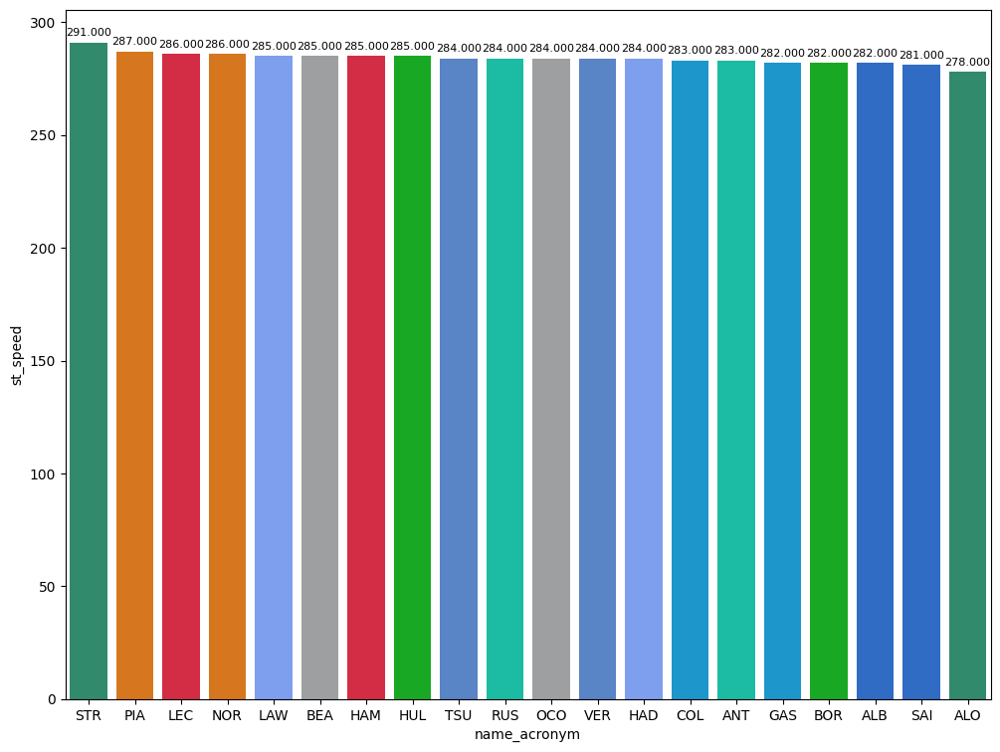

In [96]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

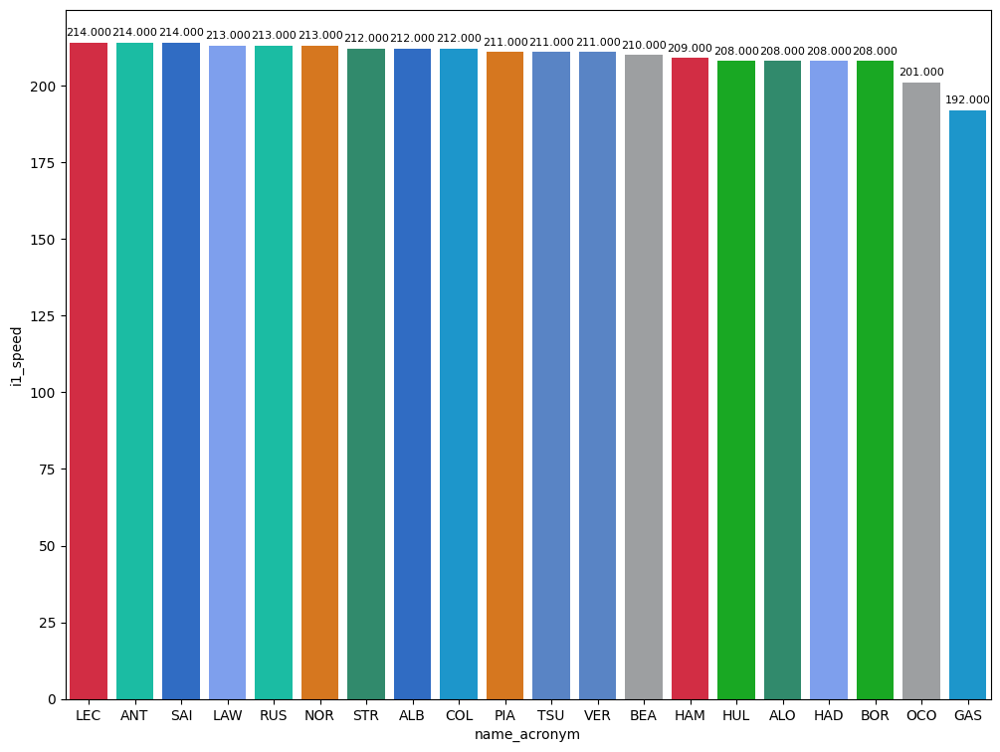

In [97]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

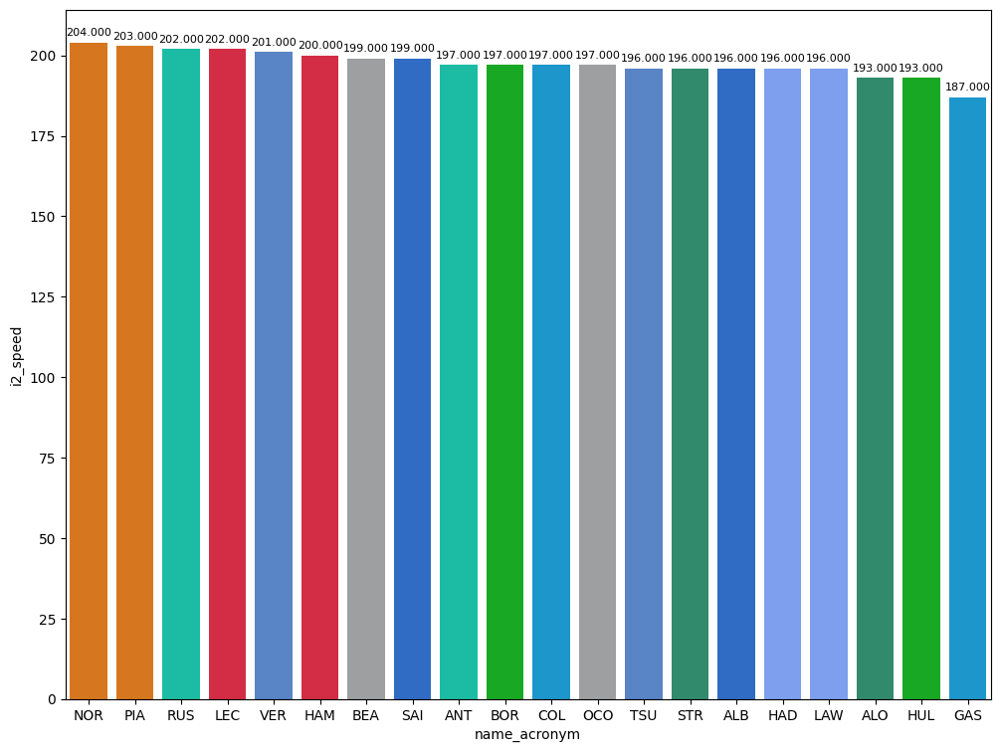

In [98]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Race pace
General explanation
Explanation per teams

In [99]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 80").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
McLaren,75.509161
Ferrari,75.785150
Red Bull Racing,76.912637
Williams,76.978840
Racing Bulls,77.155495
Aston Martin,77.558419
Haas F1 Team,77.591000
Kick Sauber,77.941291
Mercedes,77.945245


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending. As we can see in the race, after red flag, drivers decided to manage their tyres in order to finish and, for this reason, pace was not important.

#### Sector 1

In [100]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 80").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
McLaren,19.752097
Ferrari,19.781458
Red Bull Racing,20.095000
Williams,20.142250
Racing Bulls,20.167757
Aston Martin,20.318338
Alpine,20.320333
Haas F1 Team,20.331456
Kick Sauber,20.341029


#### Sector 2

In [101]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 80").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
McLaren,35.729742
Ferrari,35.905450
Williams,36.407580
Red Bull Racing,36.428177
Racing Bulls,36.534879
Haas F1 Team,36.604281
Aston Martin,36.625959
Mercedes,36.809765
Kick Sauber,36.835874


#### Sector 3

In [102]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 80").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
McLaren,20.027323
Ferrari,20.098242
Red Bull Racing,20.389460
Williams,20.429010
Racing Bulls,20.452860
Aston Martin,20.614122
Haas F1 Team,20.655263
Mercedes,20.673206
Alpine,20.728526


### Long runs

In [103]:
MINIMUN_SECONDS = 75
MAXIMUM_SECONDS = 80

#### Red Bull Racing

In [104]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1261,9979,1,22,1,0,SOFT,0
17,1261,9979,1,1,1,27,HARD,0
23,1261,9979,2,22,1,72,HARD,0
38,1261,9979,2,1,28,76,MEDIUM,0
57,1261,9979,3,22,73,76,MEDIUM,0
58,1261,9979,3,1,77,78,SOFT,3


In [105]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
119,Max VERSTAPPEN,HARD,2025-05-25T13:12:32.954000+00:00,7,21.250,37.105,20.613,78.968
139,Max VERSTAPPEN,HARD,2025-05-25T13:13:51.898000+00:00,8,20.467,36.796,20.451,77.714
177,Max VERSTAPPEN,HARD,2025-05-25T13:16:30.837000+00:00,10,20.440,38.145,20.584,79.169
196,Max VERSTAPPEN,HARD,2025-05-25T13:17:49.955000+00:00,11,20.295,36.676,20.510,77.481
215,Max VERSTAPPEN,HARD,2025-05-25T13:19:07.503000+00:00,12,20.612,37.001,20.515,78.128
234,Max VERSTAPPEN,HARD,2025-05-25T13:20:25.576000+00:00,13,20.309,36.424,20.389,77.122
252,Max VERSTAPPEN,HARD,2025-05-25T13:21:42.720000+00:00,14,20.267,36.267,20.276,76.810
270,Max VERSTAPPEN,HARD,2025-05-25T13:22:59.536000+00:00,15,20.364,35.859,20.157,76.380
288,Max VERSTAPPEN,HARD,2025-05-25T13:24:15.948000+00:00,16,19.731,35.563,20.098,75.392
307,Max VERSTAPPEN,HARD,2025-05-25T13:25:31.283000+00:00,17,19.685,35.563,19.883,75.131


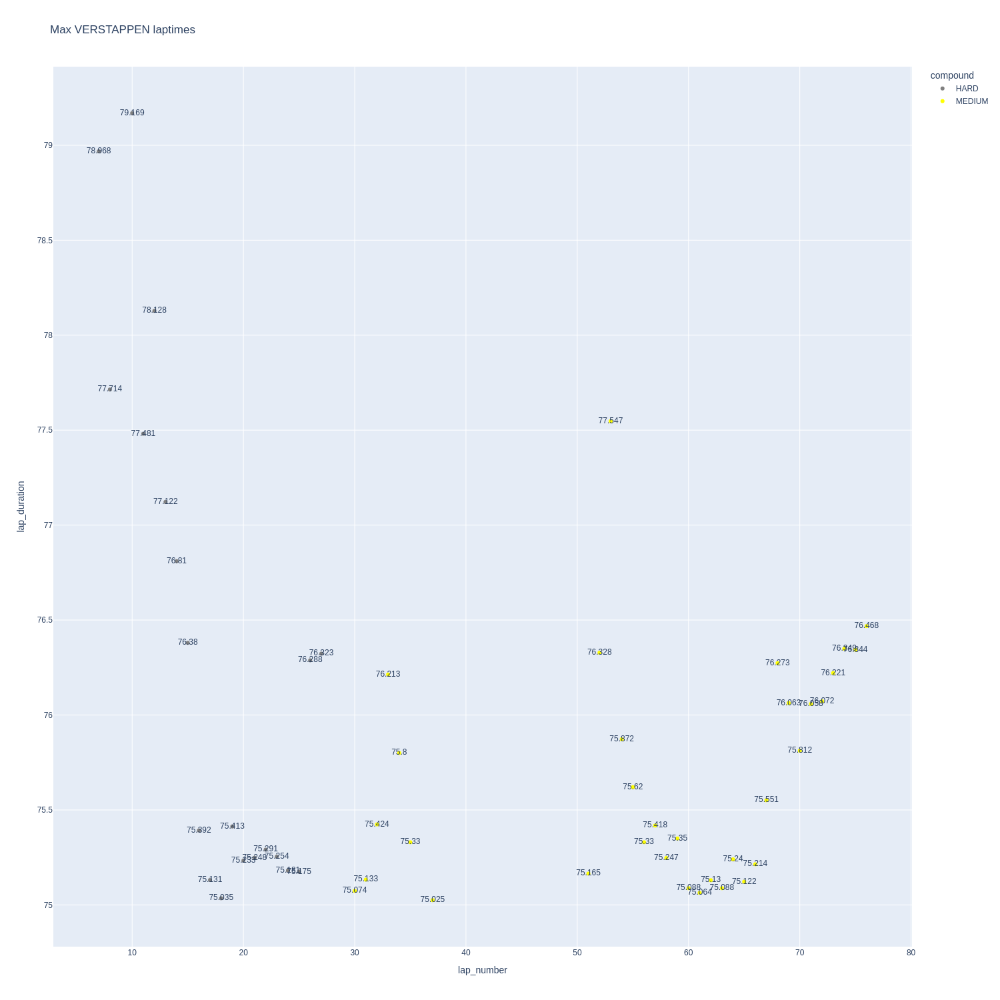

In [106]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

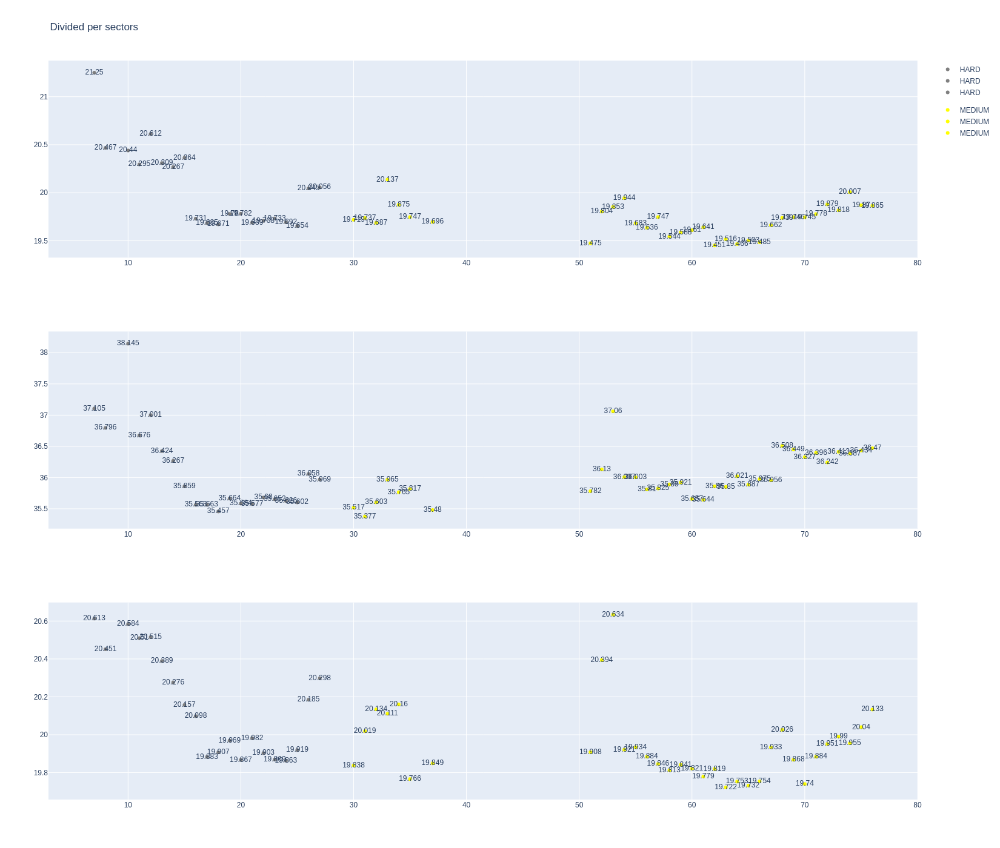

In [107]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [108]:
data = libraryDataF1.getinfolongruns(jointables,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
92,Yuki TSUNODA,HARD,2025-05-25T13:10:10.728000+00:00,5,21.055,36.977,20.631,78.663
112,Yuki TSUNODA,HARD,2025-05-25T13:11:29.267000+00:00,6,20.891,36.667,20.723,78.281
132,Yuki TSUNODA,HARD,2025-05-25T13:12:47.645000+00:00,7,20.886,37.098,21.173,79.157
171,Yuki TSUNODA,HARD,2025-05-25T13:15:30.096000+00:00,9,20.404,37.584,21.623,79.611
228,Yuki TSUNODA,HARD,2025-05-25T13:19:31.582000+00:00,12,20.862,37.540,21.235,79.637
246,Yuki TSUNODA,HARD,2025-05-25T13:20:51.236000+00:00,13,20.856,37.714,20.731,79.301
263,Yuki TSUNODA,HARD,2025-05-25T13:22:10.411000+00:00,14,20.772,37.026,20.977,78.775
280,Yuki TSUNODA,HARD,2025-05-25T13:23:29.302000+00:00,15,20.680,37.202,21.204,79.086
334,Yuki TSUNODA,HARD,2025-05-25T13:27:29.861000+00:00,18,20.927,37.480,21.201,79.608
350,Yuki TSUNODA,HARD,2025-05-25T13:28:49.544000+00:00,19,21.070,37.720,20.962,79.752


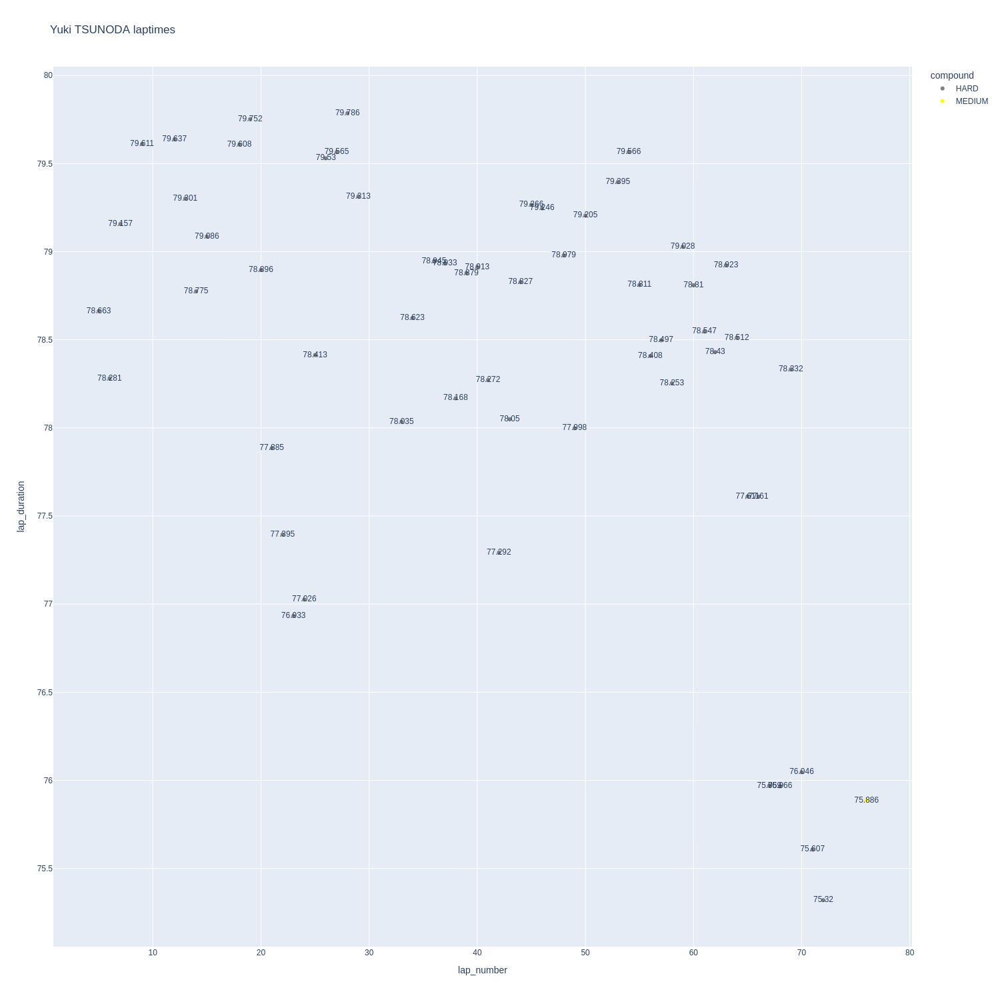

In [109]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

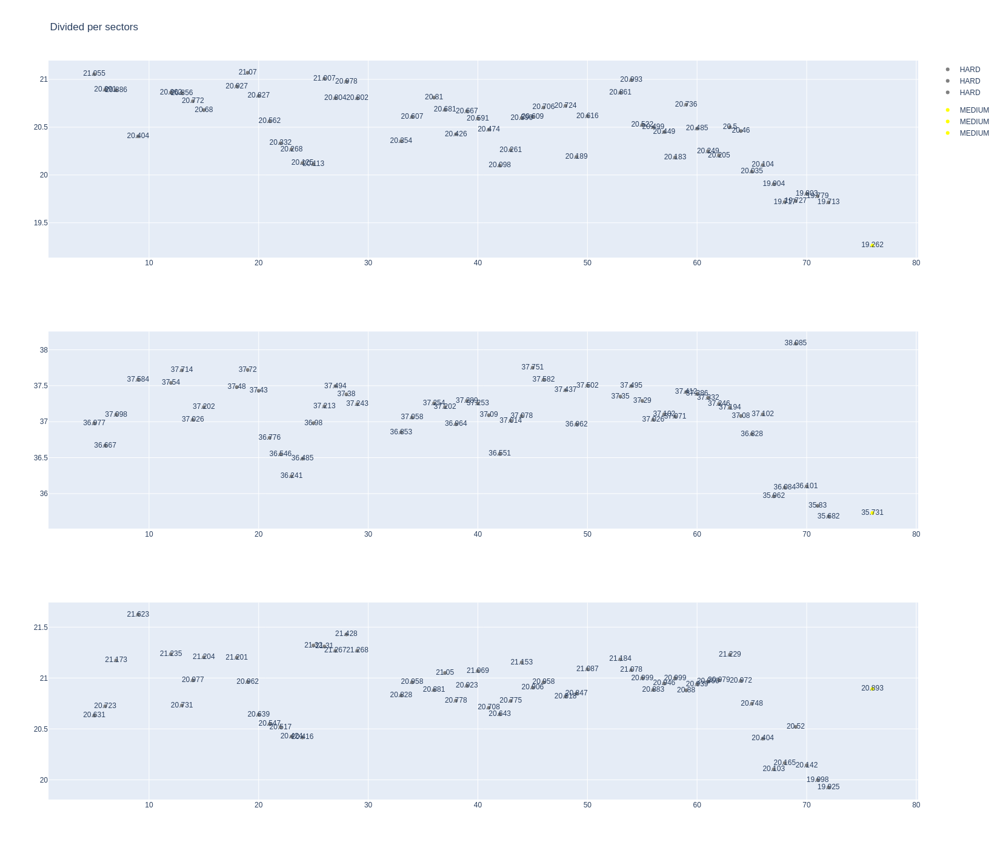

In [110]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [111]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1261,9979,1,44,1,17,HARD,0
15,1261,9979,1,16,1,21,MEDIUM,0
31,1261,9979,2,44,18,55,HARD,1
35,1261,9979,2,16,22,48,HARD,0
48,1261,9979,3,16,49,78,MEDIUM,0
52,1261,9979,3,44,56,78,MEDIUM,0


In [112]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
77,Charles LECLERC,MEDIUM,2025-05-25T13:09:48.934000+00:00,5,20.597,37.317,20.887,78.801
97,Charles LECLERC,MEDIUM,2025-05-25T13:11:07.754000+00:00,6,20.621,37.804,20.842,79.267
117,Charles LECLERC,MEDIUM,2025-05-25T13:12:27.079000+00:00,7,20.633,37.281,20.742,78.656
137,Charles LECLERC,MEDIUM,2025-05-25T13:13:45.695000+00:00,8,20.357,36.978,20.655,77.990
175,Charles LECLERC,MEDIUM,2025-05-25T13:16:24.852000+00:00,10,20.059,38.874,20.979,79.912
194,Charles LECLERC,MEDIUM,2025-05-25T13:17:44.728000+00:00,11,20.125,39.049,20.716,79.890
213,Charles LECLERC,MEDIUM,2025-05-25T13:19:04.706000+00:00,12,20.313,35.908,20.218,76.439
232,Charles LECLERC,MEDIUM,2025-05-25T13:20:21.216000+00:00,13,19.961,36.049,20.197,76.207
250,Charles LECLERC,MEDIUM,2025-05-25T13:21:37.428000+00:00,14,20.011,36.164,20.455,76.630
268,Charles LECLERC,MEDIUM,2025-05-25T13:22:53.942000+00:00,15,19.885,35.894,20.263,76.042


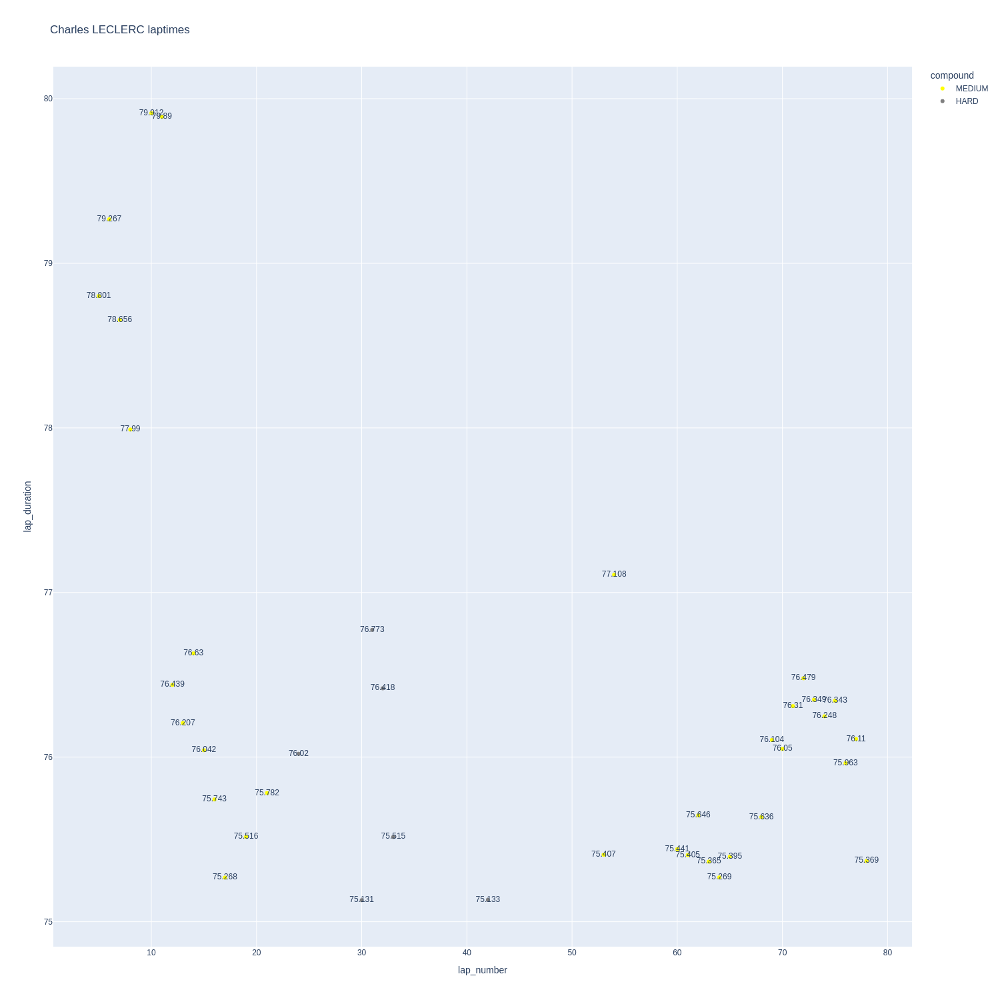

In [113]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

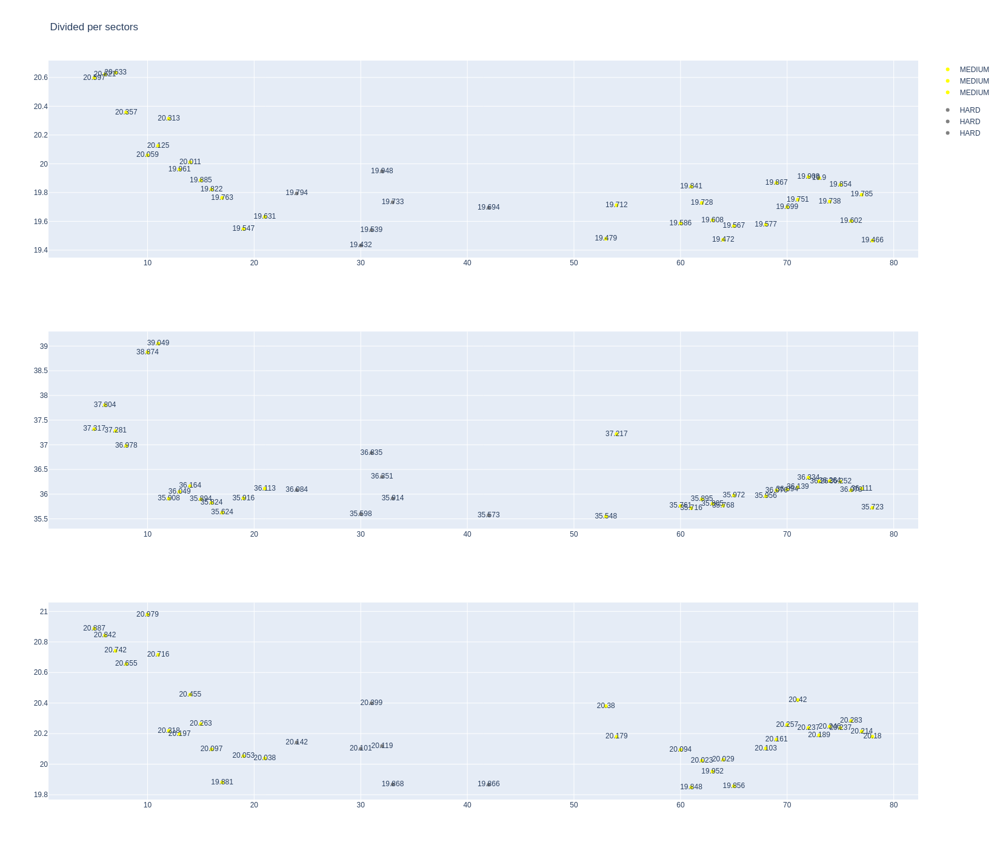

In [114]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [115]:
data = libraryDataF1.getinfolongruns(jointables,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
142,Lewis HAMILTON,HARD,2025-05-25T13:13:56.711000+00:00,8,21.005,37.058,20.976,79.039
199,Lewis HAMILTON,HARD,2025-05-25T13:17:58.255000+00:00,11,20.216,36.509,20.395,77.120
218,Lewis HAMILTON,HARD,2025-05-25T13:19:15.316000+00:00,12,20.524,36.457,20.549,77.530
237,Lewis HAMILTON,HARD,2025-05-25T13:20:32.951000+00:00,13,20.185,36.352,20.262,76.799
255,Lewis HAMILTON,HARD,2025-05-25T13:21:49.659000+00:00,14,19.982,35.936,20.233,76.151
272,Lewis HAMILTON,HARD,2025-05-25T13:23:05.864000+00:00,15,19.869,35.944,20.178,75.991
290,Lewis HAMILTON,HARD,2025-05-25T13:24:21.895000+00:00,16,19.798,35.920,20.223,75.941
359,Lewis HAMILTON,HARD,2025-05-25T13:29:42.606000+00:00,20,19.671,35.370,20.024,75.065
376,Lewis HAMILTON,HARD,2025-05-25T13:30:57.682000+00:00,21,19.882,35.758,20.110,75.750
395,Lewis HAMILTON,HARD,2025-05-25T13:32:13.558000+00:00,22,19.655,35.418,19.930,75.003


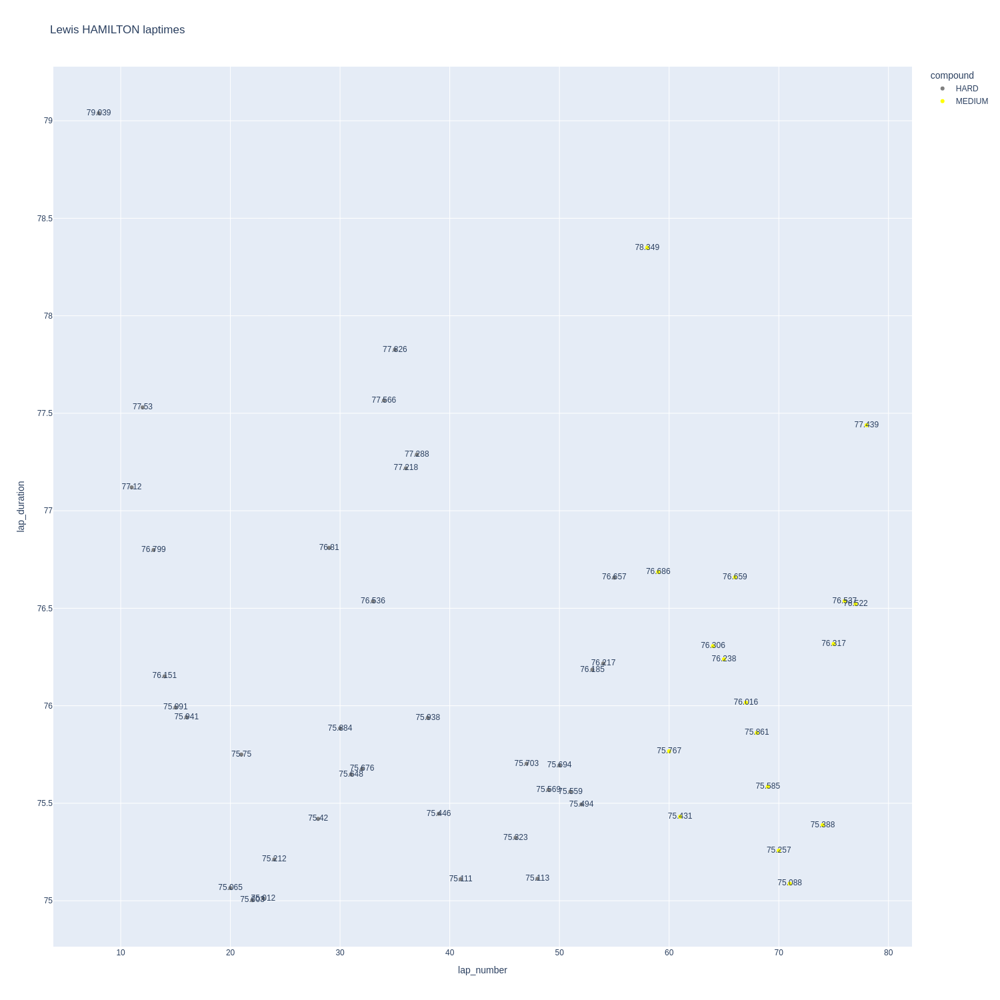

In [116]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

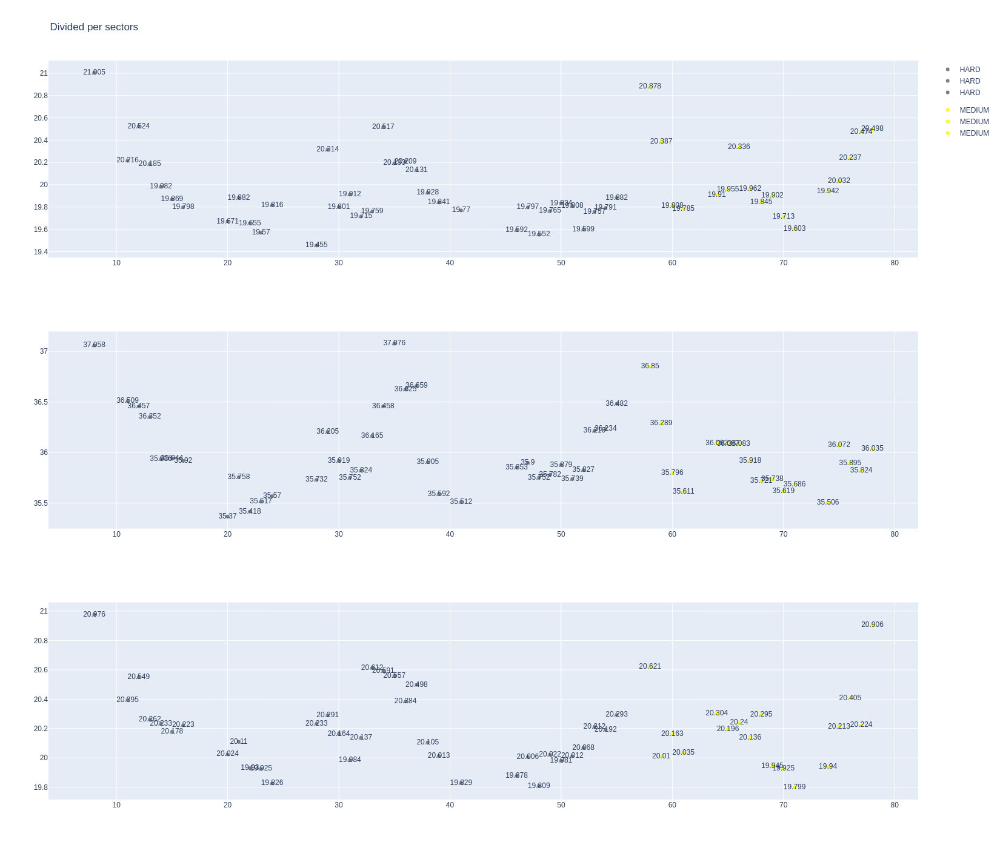

In [117]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [118]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
21,1261,9979,1,63,1,52,HARD,0
22,1261,9979,1,12,1,68,HARD,0
50,1261,9979,2,63,53,67,MEDIUM,53
54,1261,9979,3,63,68,76,HARD,0
55,1261,9979,2,12,69,70,MEDIUM,0
56,1261,9979,3,12,71,75,HARD,0


In [119]:
data = libraryDataF1.getinfolongruns(jointables,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
206,Kimi ANTONELLI,HARD,2025-05-25T13:18:09.281000+00:00,11,21.213,37.509,21.172,79.894
225,Kimi ANTONELLI,HARD,2025-05-25T13:19:29.222000+00:00,12,20.978,37.394,21.416,79.788
243,Kimi ANTONELLI,HARD,2025-05-25T13:20:48.952000+00:00,13,20.856,36.970,21.042,78.868
261,Kimi ANTONELLI,HARD,2025-05-25T13:22:07.801000+00:00,14,20.941,37.250,20.884,79.075
278,Kimi ANTONELLI,HARD,2025-05-25T13:23:26.942000+00:00,15,21.196,37.149,21.513,79.858
349,Kimi ANTONELLI,HARD,2025-05-25T13:28:48.872000+00:00,19,21.185,37.413,21.026,79.624
366,Kimi ANTONELLI,HARD,2025-05-25T13:30:08.435000+00:00,20,21.039,37.139,20.664,78.842
384,Kimi ANTONELLI,HARD,2025-05-25T13:31:27.354000+00:00,21,20.697,36.624,20.593,77.914
403,Kimi ANTONELLI,HARD,2025-05-25T13:32:45.183000+00:00,22,20.267,36.522,20.484,77.273
421,Kimi ANTONELLI,HARD,2025-05-25T13:34:02.493000+00:00,23,20.207,36.409,20.357,76.973


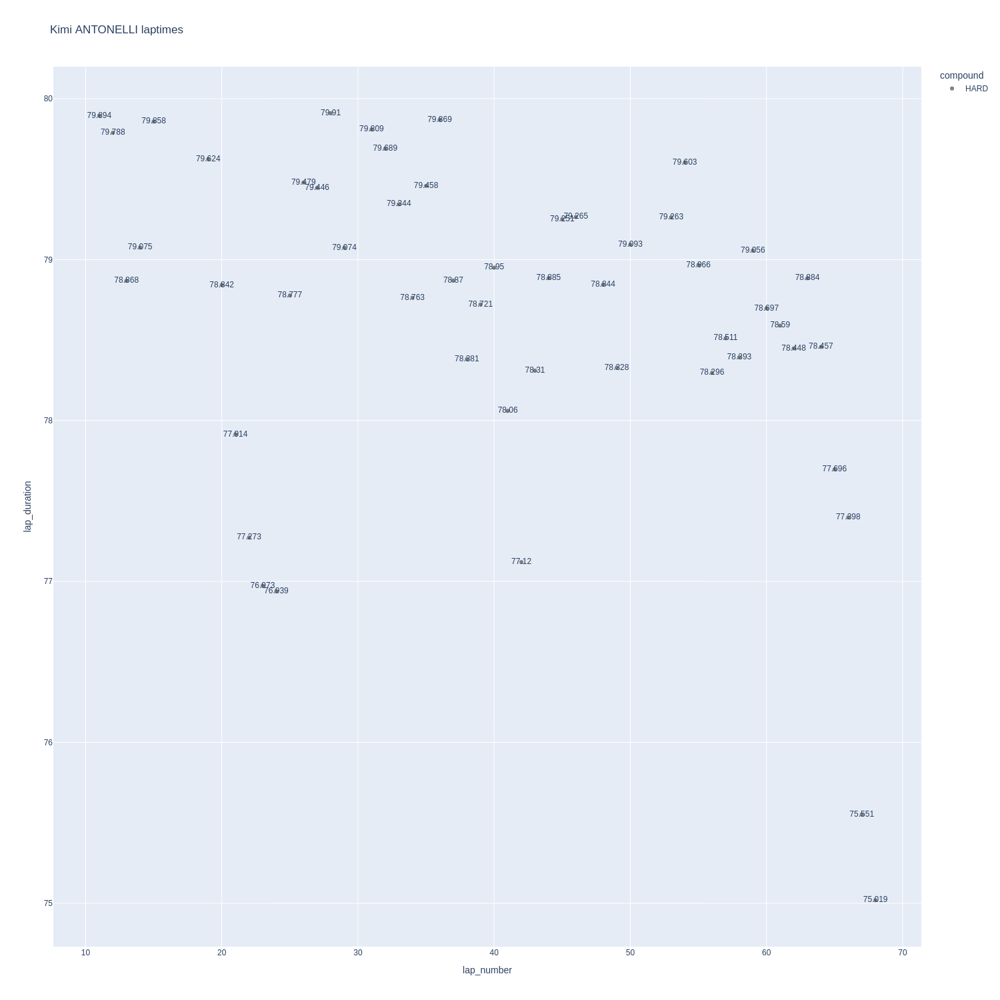

In [120]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

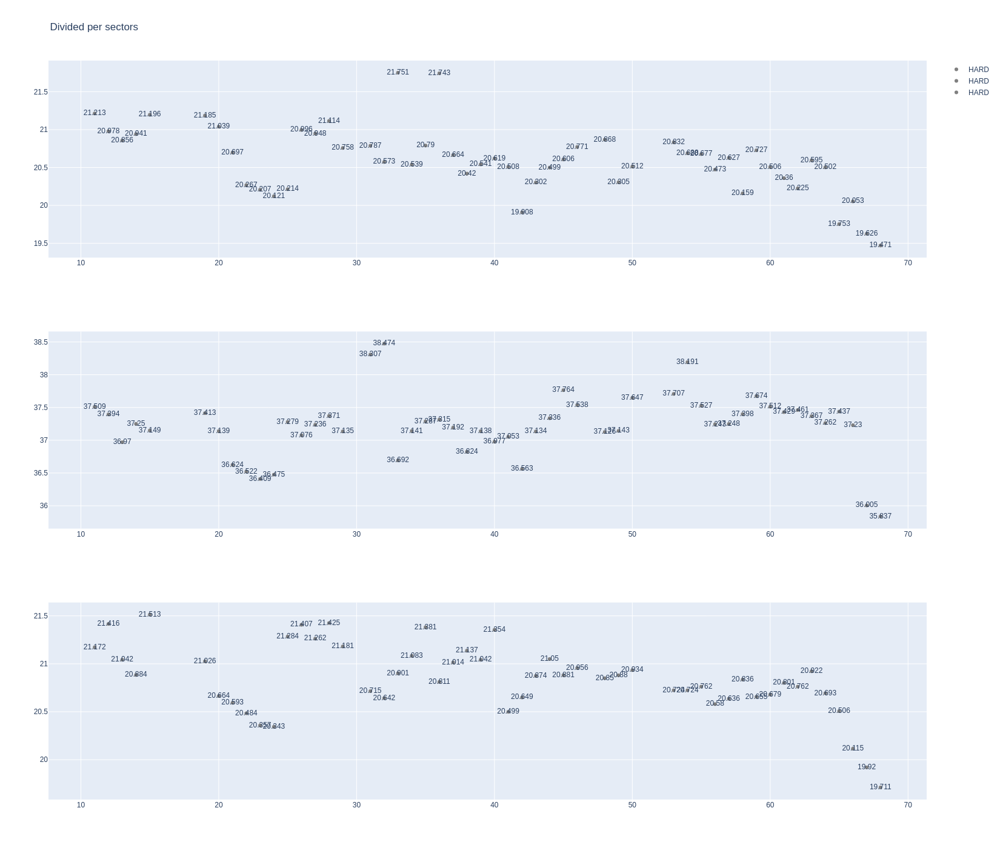

In [121]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [122]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
205,George RUSSELL,HARD,2025-05-25T13:18:08.764000+00:00,11,21.311,37.353,21.189,79.853
224,George RUSSELL,HARD,2025-05-25T13:19:28.628000+00:00,12,21.052,37.456,21.218,79.726
242,George RUSSELL,HARD,2025-05-25T13:20:48.263000+00:00,13,20.928,36.921,21.052,78.901
260,George RUSSELL,HARD,2025-05-25T13:22:07.268000+00:00,14,21.028,37.128,21.091,79.247
277,George RUSSELL,HARD,2025-05-25T13:23:26.489000+00:00,15,21.176,37.170,21.418,79.764
348,George RUSSELL,HARD,2025-05-25T13:28:48.216000+00:00,19,21.289,37.250,21.090,79.629
365,George RUSSELL,HARD,2025-05-25T13:30:07.903000+00:00,20,21.071,36.757,20.685,78.513
383,George RUSSELL,HARD,2025-05-25T13:31:26.417000+00:00,21,20.729,36.459,20.587,77.775
402,George RUSSELL,HARD,2025-05-25T13:32:44.121000+00:00,22,20.428,36.414,20.459,77.301
420,George RUSSELL,HARD,2025-05-25T13:34:01.477000+00:00,23,20.341,36.229,20.330,76.900


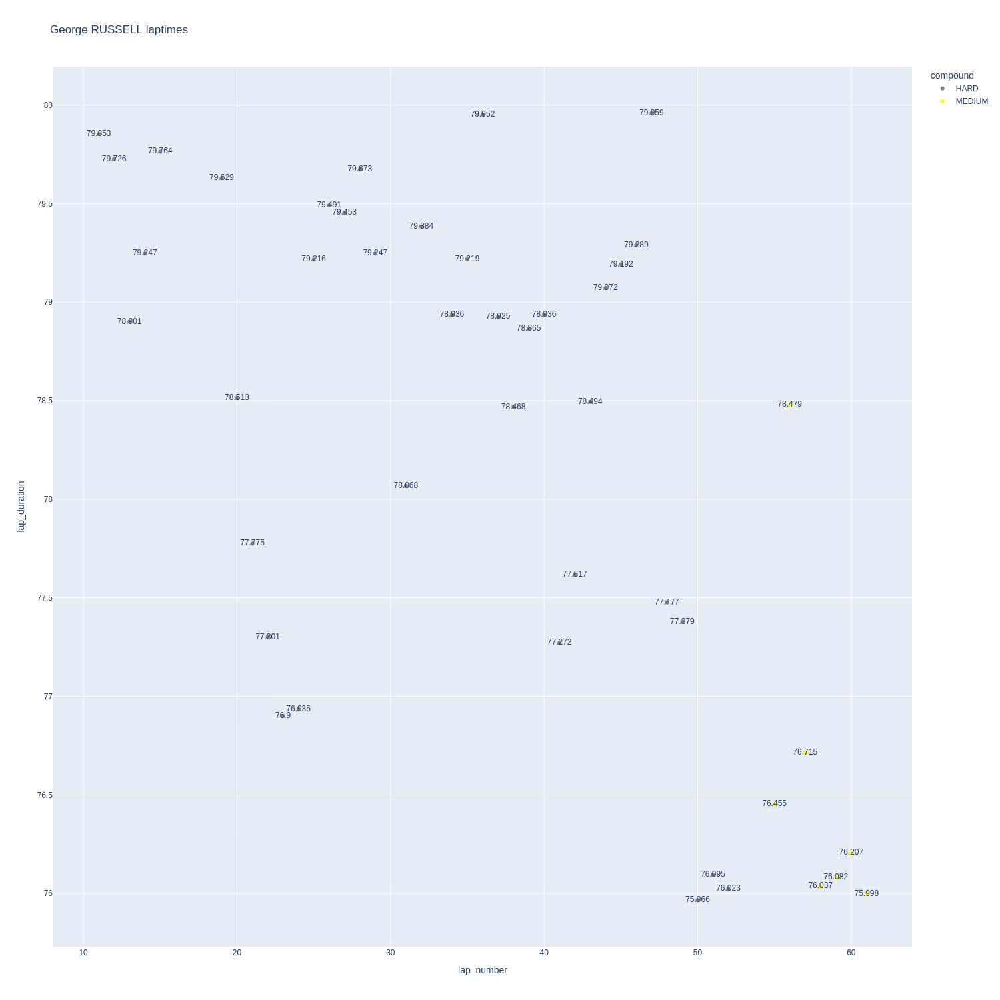

In [123]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

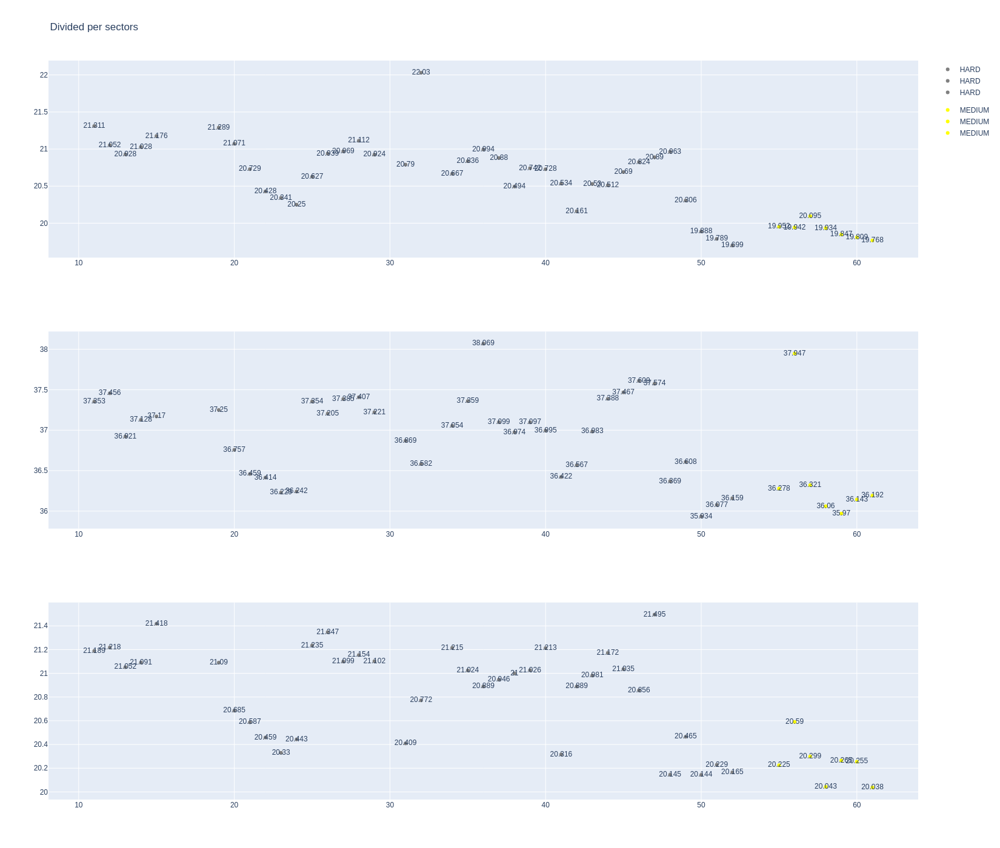

In [124]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [125]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
13,1261,9979,1,4,1,18,MEDIUM,0
14,1261,9979,1,81,1,19,MEDIUM,0
32,1261,9979,2,4,19,49,HARD,0
34,1261,9979,2,81,20,47,HARD,0
47,1261,9979,3,81,48,78,HARD,0
49,1261,9979,3,4,50,78,HARD,0


In [126]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
76,Lando NORRIS,MEDIUM,2025-05-25T13:09:48.215000+00:00,5,20.559,36.559,20.932,78.050
96,Lando NORRIS,MEDIUM,2025-05-25T13:11:06.430000+00:00,6,20.643,37.367,21.162,79.172
116,Lando NORRIS,MEDIUM,2025-05-25T13:12:25.486000+00:00,7,20.536,37.171,20.763,78.470
136,Lando NORRIS,MEDIUM,2025-05-25T13:13:43.898000+00:00,8,20.324,36.551,20.751,77.626
193,Lando NORRIS,MEDIUM,2025-05-25T13:17:44.072000+00:00,11,20.086,38.999,20.686,79.771
212,Lando NORRIS,MEDIUM,2025-05-25T13:19:03.894000+00:00,12,20.126,35.936,20.238,76.300
231,Lando NORRIS,MEDIUM,2025-05-25T13:20:20.326000+00:00,13,20.017,35.712,20.259,75.988
249,Lando NORRIS,MEDIUM,2025-05-25T13:21:36.178000+00:00,14,19.931,35.991,20.200,76.122
267,Lando NORRIS,MEDIUM,2025-05-25T13:22:52.364000+00:00,15,19.875,35.541,20.257,75.673
321,Lando NORRIS,MEDIUM,2025-05-25T13:26:37.443000+00:00,18,19.776,35.567,19.937,75.280


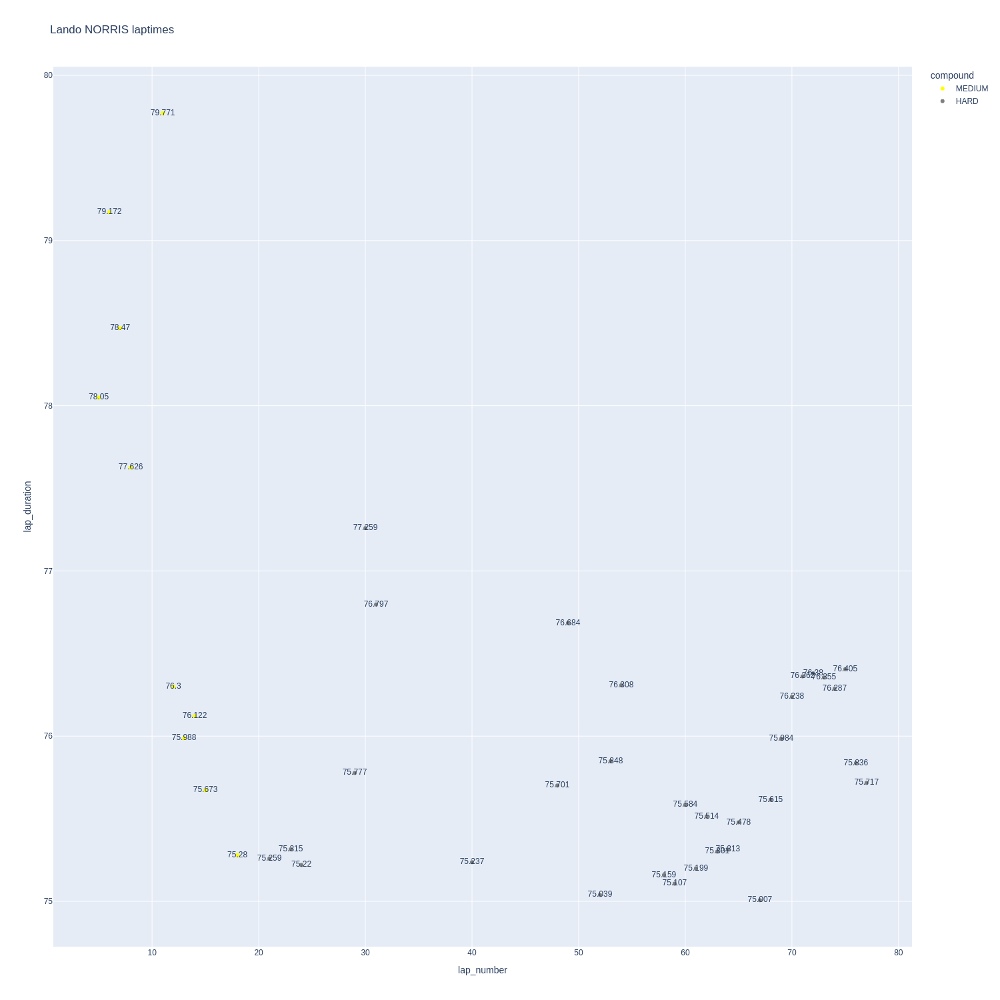

In [127]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

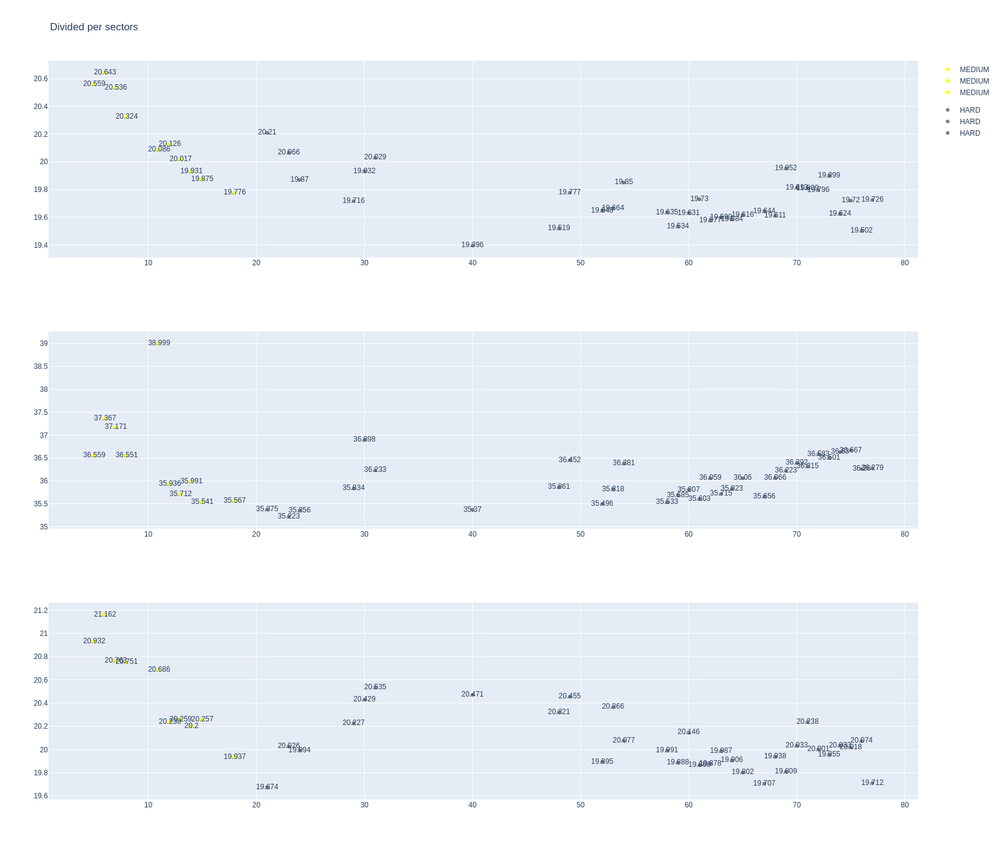

In [128]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [129]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
98,Oscar PIASTRI,MEDIUM,2025-05-25T13:11:11.195000+00:00,6,20.928,37.577,21.288,79.793
118,Oscar PIASTRI,MEDIUM,2025-05-25T13:12:30.908000+00:00,7,20.688,37.373,21.200,79.261
138,Oscar PIASTRI,MEDIUM,2025-05-25T13:13:50.179000+00:00,8,20.392,36.990,20.647,78.029
176,Oscar PIASTRI,MEDIUM,2025-05-25T13:16:30.508000+00:00,10,20.161,38.417,20.582,79.160
195,Oscar PIASTRI,MEDIUM,2025-05-25T13:17:49.701000+00:00,11,19.958,36.973,20.404,77.335
214,Oscar PIASTRI,MEDIUM,2025-05-25T13:19:07.081000+00:00,12,20.349,36.354,20.690,77.393
233,Oscar PIASTRI,MEDIUM,2025-05-25T13:20:24.451000+00:00,13,20.083,36.218,20.447,76.748
251,Oscar PIASTRI,MEDIUM,2025-05-25T13:21:41.194000+00:00,14,19.907,36.040,20.465,76.412
269,Oscar PIASTRI,MEDIUM,2025-05-25T13:22:57.505000+00:00,15,19.659,35.481,20.382,75.522
287,Oscar PIASTRI,MEDIUM,2025-05-25T13:24:13.168000+00:00,16,19.859,35.629,20.155,75.643


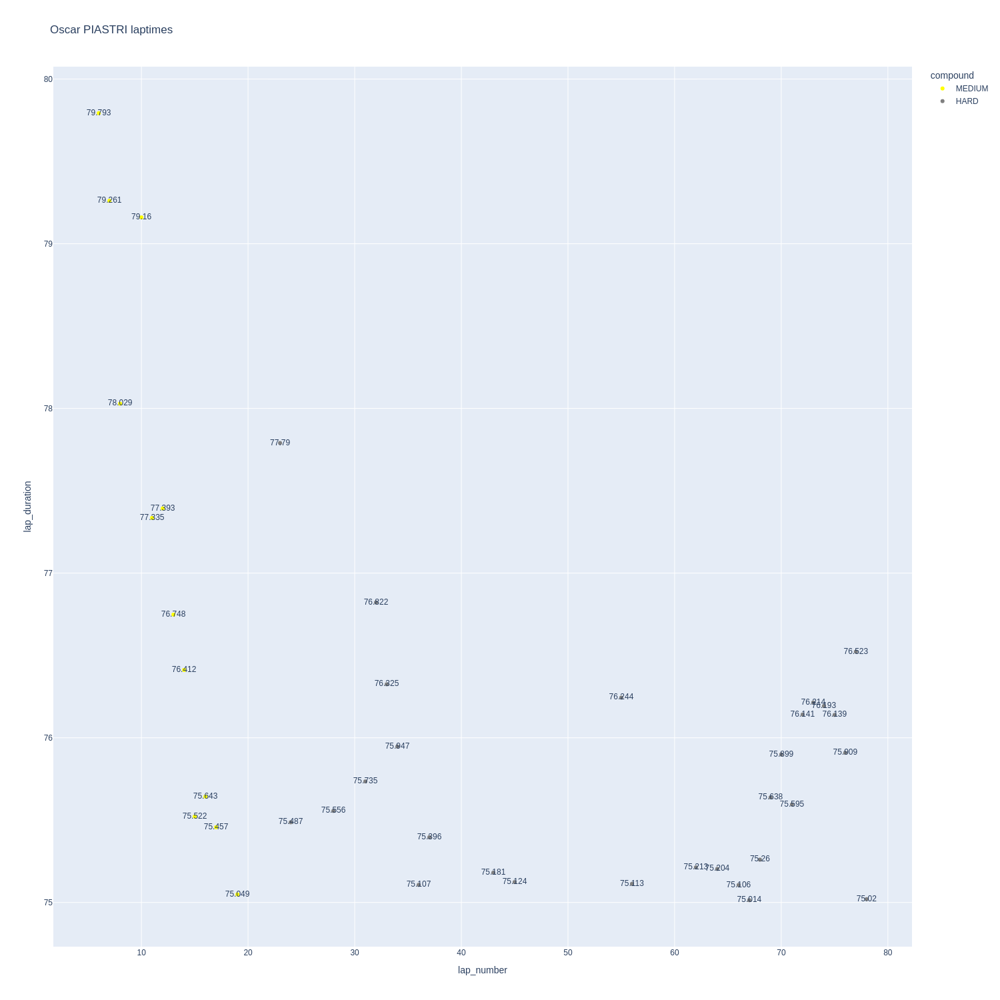

In [130]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

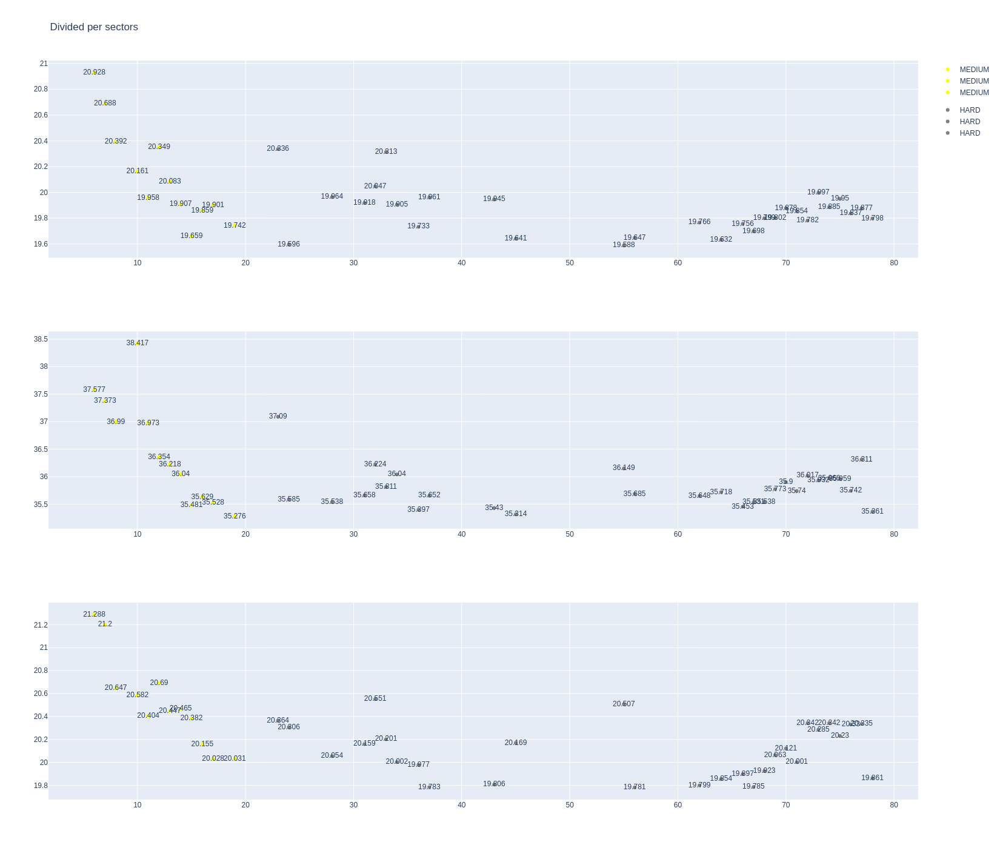

In [131]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [132]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1261,9979,1,14,1,15,HARD,1
10,1261,9979,1,18,1,16,HARD,1
28,1261,9979,2,14,16,36,HARD,1
29,1261,9979,2,18,17,63,HARD,1
53,1261,9979,3,18,64,76,MEDIUM,1


In [133]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
141,Fernando ALONSO,HARD,2025-05-25T13:13:55.523000+00:00,8,20.807,37.418,20.880,79.105
198,Fernando ALONSO,HARD,2025-05-25T13:17:56.969000+00:00,11,20.465,36.583,20.421,77.469
217,Fernando ALONSO,HARD,2025-05-25T13:19:14.472000+00:00,12,20.378,36.539,20.402,77.319
236,Fernando ALONSO,HARD,2025-05-25T13:20:31.810000+00:00,13,20.107,36.105,20.199,76.411
254,Fernando ALONSO,HARD,2025-05-25T13:21:48.237000+00:00,14,20.050,35.994,20.251,76.295
271,Fernando ALONSO,HARD,2025-05-25T13:23:04.536000+00:00,15,19.849,35.665,20.079,75.593
327,Fernando ALONSO,HARD,2025-05-25T13:27:14.524000+00:00,18,20.136,36.258,20.446,76.840
343,Fernando ALONSO,HARD,2025-05-25T13:28:31.372000+00:00,19,20.330,36.465,20.431,77.226
360,Fernando ALONSO,HARD,2025-05-25T13:29:48.591000+00:00,20,20.228,36.520,20.519,77.267
377,Fernando ALONSO,HARD,2025-05-25T13:31:05.807000+00:00,21,20.283,36.918,20.720,77.921


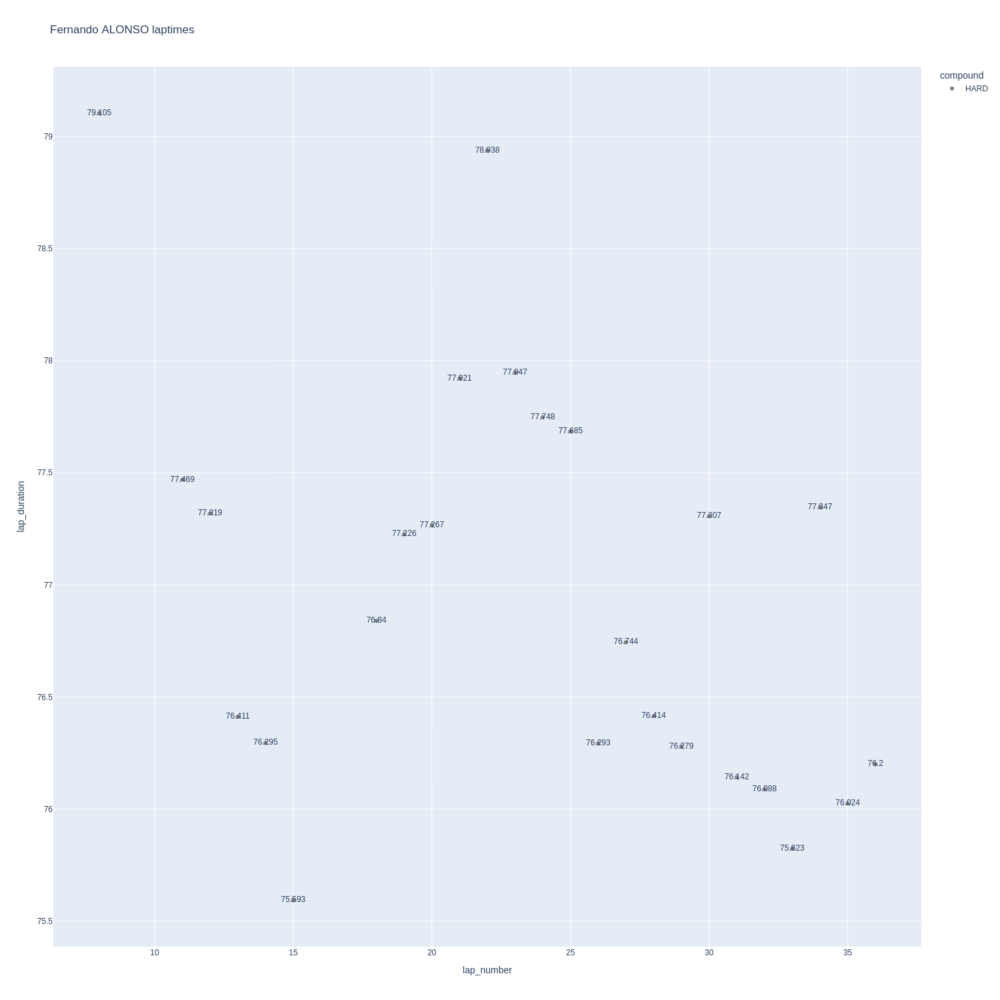

In [134]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

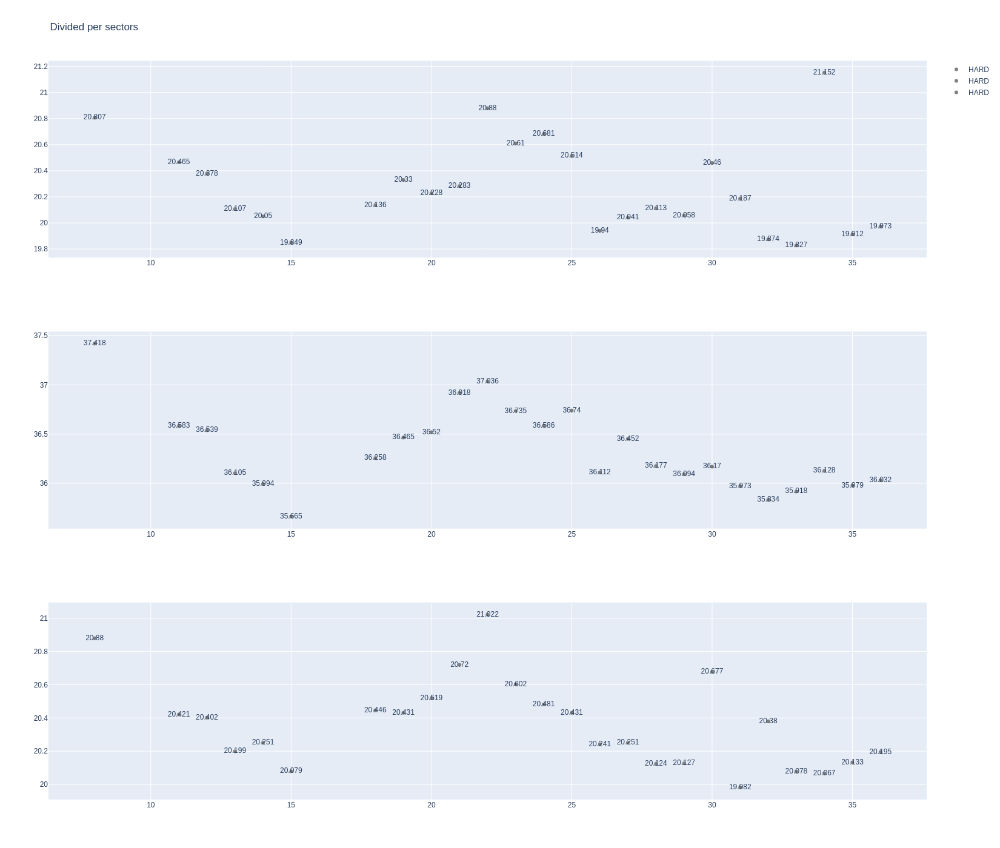

In [135]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [136]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
227,Lance STROLL,HARD,2025-05-25T13:19:30.785000+00:00,12,20.816,37.483,21.266,79.565
245,Lance STROLL,HARD,2025-05-25T13:20:50.258000+00:00,13,20.858,37.526,21.003,79.387
262,Lance STROLL,HARD,2025-05-25T13:22:09.629000+00:00,14,20.429,37.070,20.973,78.472
279,Lance STROLL,HARD,2025-05-25T13:23:28.239000+00:00,15,20.875,37.163,21.309,79.347
354,Lance STROLL,HARD,2025-05-25T13:29:05.325000+00:00,19,20.209,35.999,20.373,76.581
371,Lance STROLL,HARD,2025-05-25T13:30:22.059000+00:00,20,20.176,35.820,20.437,76.433
389,Lance STROLL,HARD,2025-05-25T13:31:38.355000+00:00,21,20.400,36.010,20.497,76.907
408,Lance STROLL,HARD,2025-05-25T13:32:55.292000+00:00,22,20.102,36.126,20.445,76.673
426,Lance STROLL,HARD,2025-05-25T13:34:11.962000+00:00,23,20.038,35.934,20.607,76.579
445,Lance STROLL,HARD,2025-05-25T13:35:28.533000+00:00,24,20.183,36.423,20.436,77.042


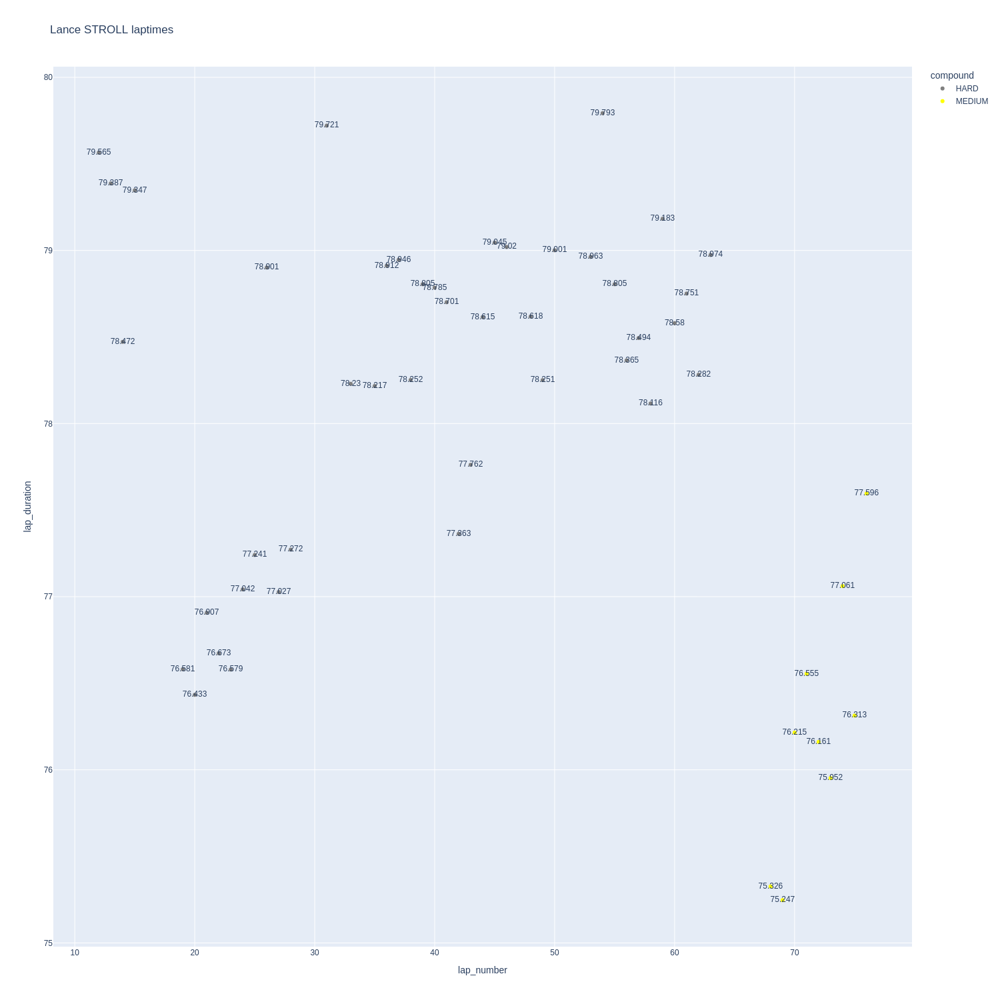

In [137]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

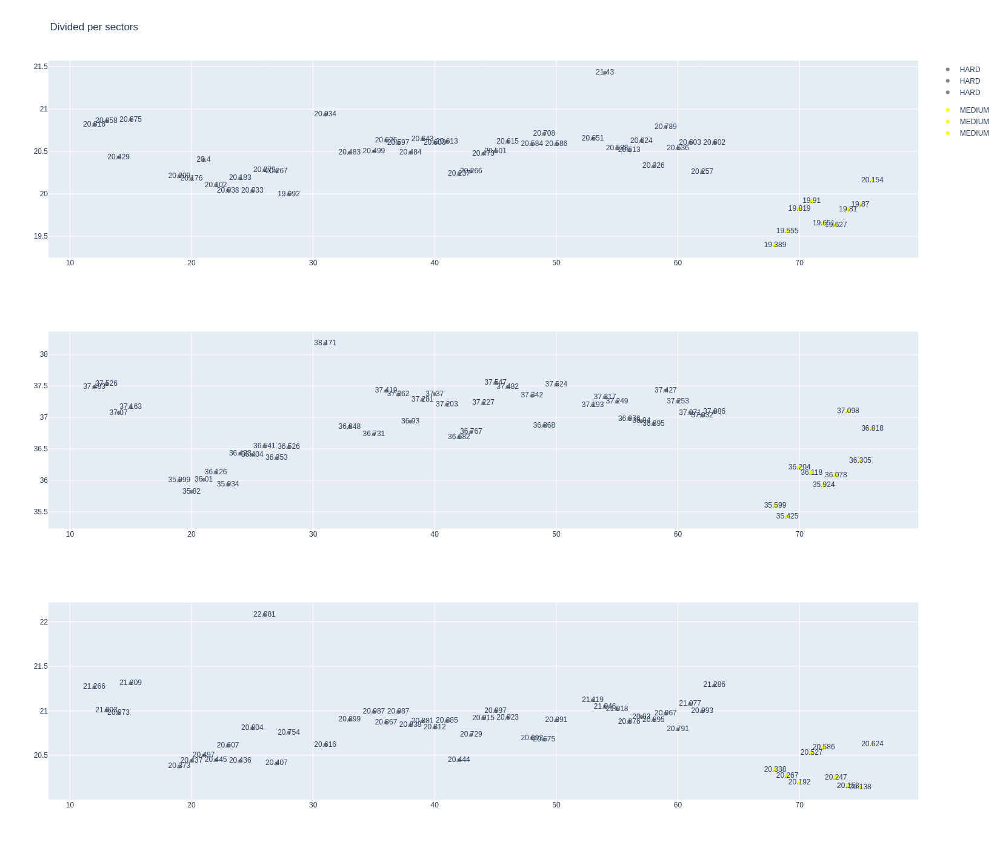

In [138]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [139]:
stintInformation.query('driver_number == 30 or driver_number == 6')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1261,9979,1,6,1,13,MEDIUM,0
18,1261,9979,1,30,1,30,MEDIUM,6
26,1261,9979,2,6,14,18,SOFT,3
33,1261,9979,3,6,19,77,HARD,1
40,1261,9979,2,30,31,39,SOFT,3
44,1261,9979,3,30,40,77,HARD,1


In [140]:
data = libraryDataF1.getinfolongruns(jointables,30,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [141]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [142]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [143]:
data = libraryDataF1.getinfolongruns(jointables,6,'RB',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [144]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [145]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [146]:
stintInformation.query('driver_number == 87 or driver_number == 31')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1261,9979,1,87,1,0,MEDIUM,0
9,1261,9979,1,31,1,15,MEDIUM,0
11,1261,9979,2,87,1,16,HARD,0
27,1261,9979,2,31,16,27,MEDIUM,4
30,1261,9979,3,87,17,76,MEDIUM,0
39,1261,9979,3,31,28,77,HARD,0


In [147]:
data = libraryDataF1.getinfolongruns(jointables,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
143,Esteban OCON,MEDIUM,2025-05-25T13:13:57.258000+00:00,8,21.235,37.131,20.841,79.207
200,Esteban OCON,MEDIUM,2025-05-25T13:17:59.490000+00:00,11,20.474,36.288,20.557,77.319
219,Esteban OCON,MEDIUM,2025-05-25T13:19:16.831000+00:00,12,20.435,36.337,20.586,77.358
238,Esteban OCON,MEDIUM,2025-05-25T13:20:34.216000+00:00,13,20.454,36.265,20.522,77.241
256,Esteban OCON,MEDIUM,2025-05-25T13:21:51.377000+00:00,14,20.265,35.920,20.268,76.453
...,...,...,...,...,...,...,...,...
1309,Esteban OCON,HARD,2025-05-25T14:38:26.233000+00:00,73,20.063,36.313,20.276,76.652
1326,Esteban OCON,HARD,2025-05-25T14:39:42.908000+00:00,74,20.025,36.237,20.318,76.580
1343,Esteban OCON,HARD,2025-05-25T14:40:59.516000+00:00,75,20.114,36.237,20.363,76.714
1360,Esteban OCON,HARD,2025-05-25T14:42:16.191000+00:00,76,20.093,36.305,20.206,76.604


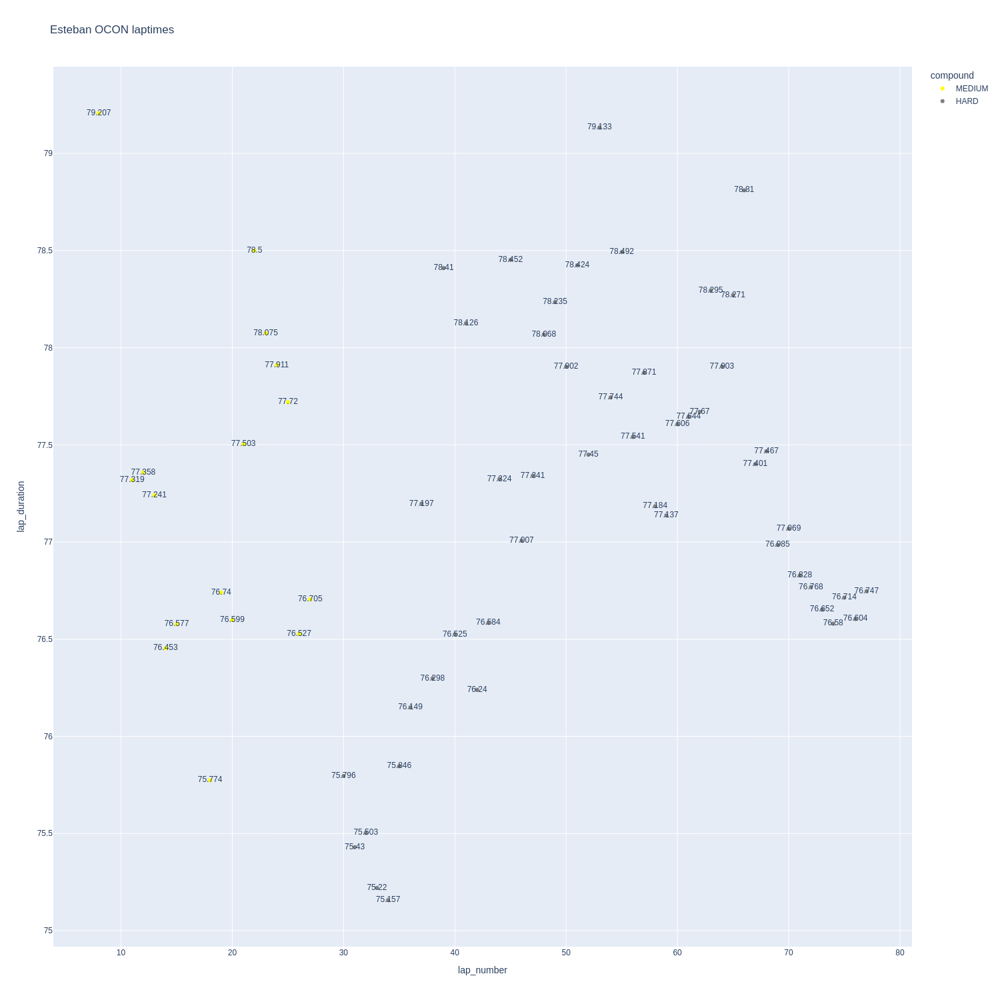

In [148]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

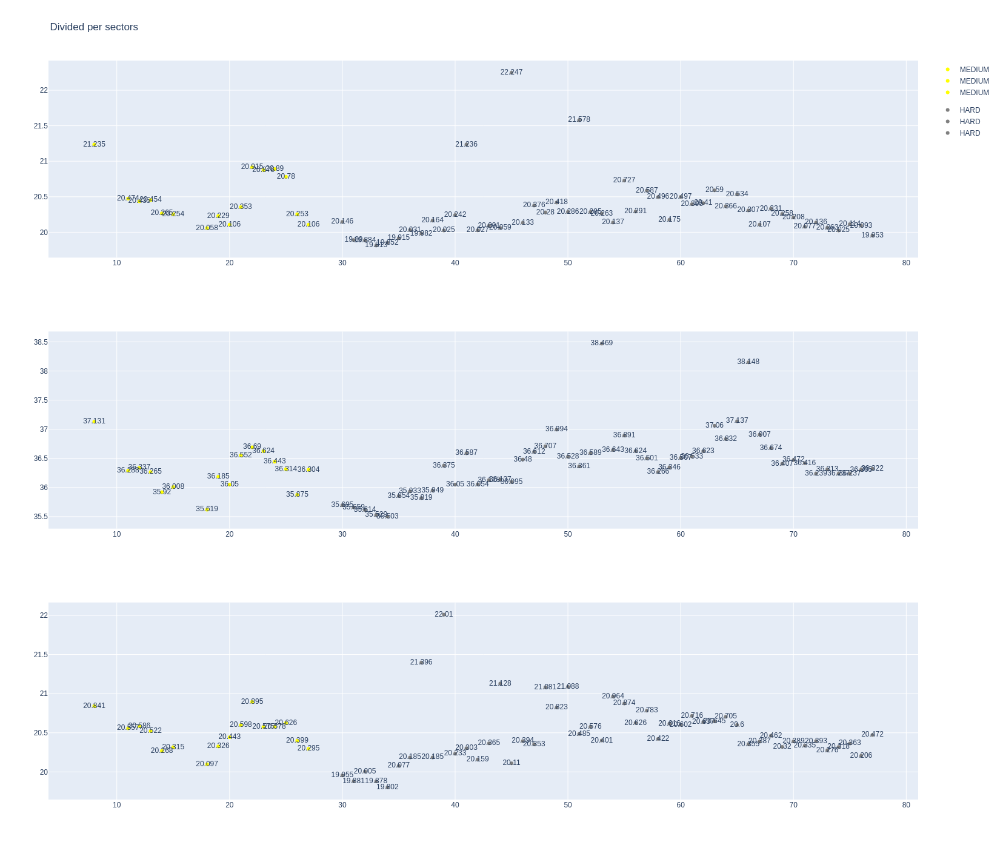

In [149]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [150]:
data = libraryDataF1.getinfolongruns(jointables,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
94,Oliver BEARMAN,HARD,2025-05-25T13:10:32.792000+00:00,5,20.059,35.746,19.771,75.576
134,Oliver BEARMAN,HARD,2025-05-25T13:13:03.244000+00:00,7,19.736,35.502,19.820,75.058
153,Oliver BEARMAN,HARD,2025-05-25T13:14:18.132000+00:00,8,19.782,37.095,21.426,78.303
172,Oliver BEARMAN,HARD,2025-05-25T13:15:36.424000+00:00,9,19.799,36.351,20.317,76.467
191,Oliver BEARMAN,HARD,2025-05-25T13:16:53.009000+00:00,10,20.089,38.146,21.320,79.555
...,...,...,...,...,...,...,...,...
1306,Oliver BEARMAN,MEDIUM,2025-05-25T14:38:19.036000+00:00,72,19.724,35.867,19.836,75.427
1323,Oliver BEARMAN,MEDIUM,2025-05-25T14:39:34.471000+00:00,73,19.631,35.894,19.830,75.355
1340,Oliver BEARMAN,MEDIUM,2025-05-25T14:40:49.775000+00:00,74,19.528,35.823,20.014,75.365
1357,Oliver BEARMAN,MEDIUM,2025-05-25T14:42:05.097000+00:00,75,19.650,36.177,19.972,75.799


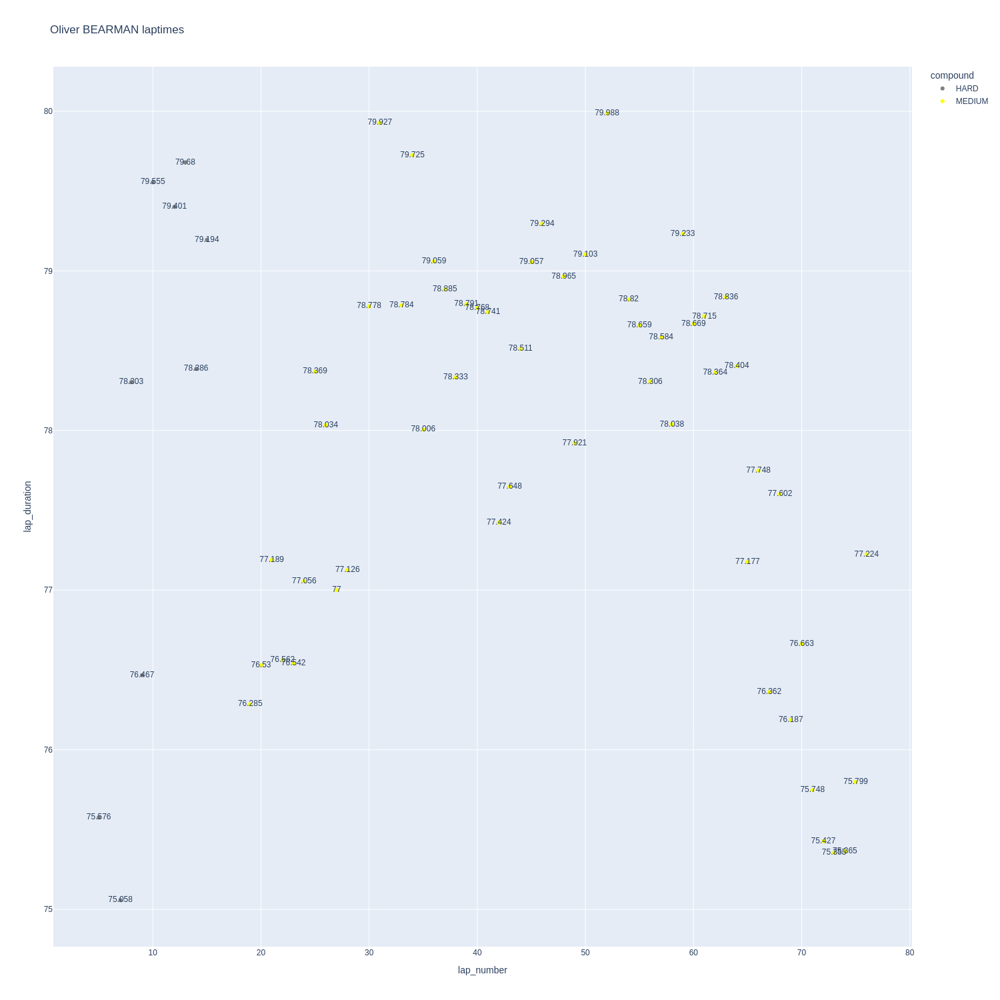

In [151]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

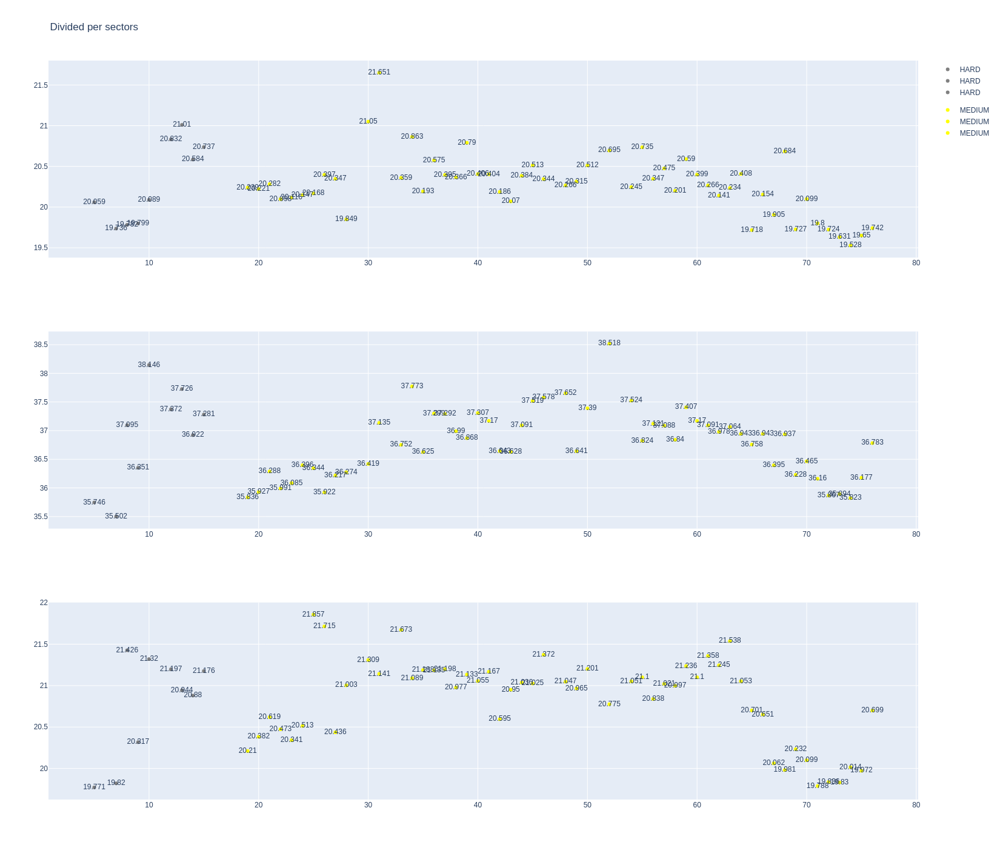

In [152]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [153]:
stintInformation.query('driver_number == 10 or driver_number == 43')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1261,9979,1,10,1,0,MEDIUM,6
4,1261,9979,2,10,1,7,MEDIUM,0
6,1261,9979,1,43,1,12,HARD,0
25,1261,9979,2,43,13,25,MEDIUM,7
37,1261,9979,3,43,26,76,MEDIUM,0


In [154]:
data =libraryDataF1.getinfolongruns(jointables,43,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
90,Franco COLAPINTO,HARD,2025-05-25T13:10:02.509000+00:00,5,20.959,37.709,21.331,79.999
207,Franco COLAPINTO,HARD,2025-05-25T13:18:09.994000+00:00,11,20.995,37.590,21.266,79.851
226,Franco COLAPINTO,HARD,2025-05-25T13:19:29.847000+00:00,12,21.071,37.383,21.373,79.827
284,Franco COLAPINTO,MEDIUM,2025-05-25T13:23:45.786000+00:00,15,20.031,35.484,19.994,75.509
303,Franco COLAPINTO,MEDIUM,2025-05-25T13:25:01.267000+00:00,16,19.967,35.484,19.984,75.435
320,Franco COLAPINTO,MEDIUM,2025-05-25T13:26:16.699000+00:00,17,20.025,36.508,21.014,77.547
337,Franco COLAPINTO,MEDIUM,2025-05-25T13:27:34.140000+00:00,18,20.569,37.021,20.761,78.351
353,Franco COLAPINTO,MEDIUM,2025-05-25T13:28:52.622000+00:00,19,20.572,37.322,20.957,78.851
370,Franco COLAPINTO,MEDIUM,2025-05-25T13:30:11.419000+00:00,20,20.775,37.347,21.174,79.296
388,Franco COLAPINTO,MEDIUM,2025-05-25T13:31:30.761000+00:00,21,20.526,36.855,20.833,78.214


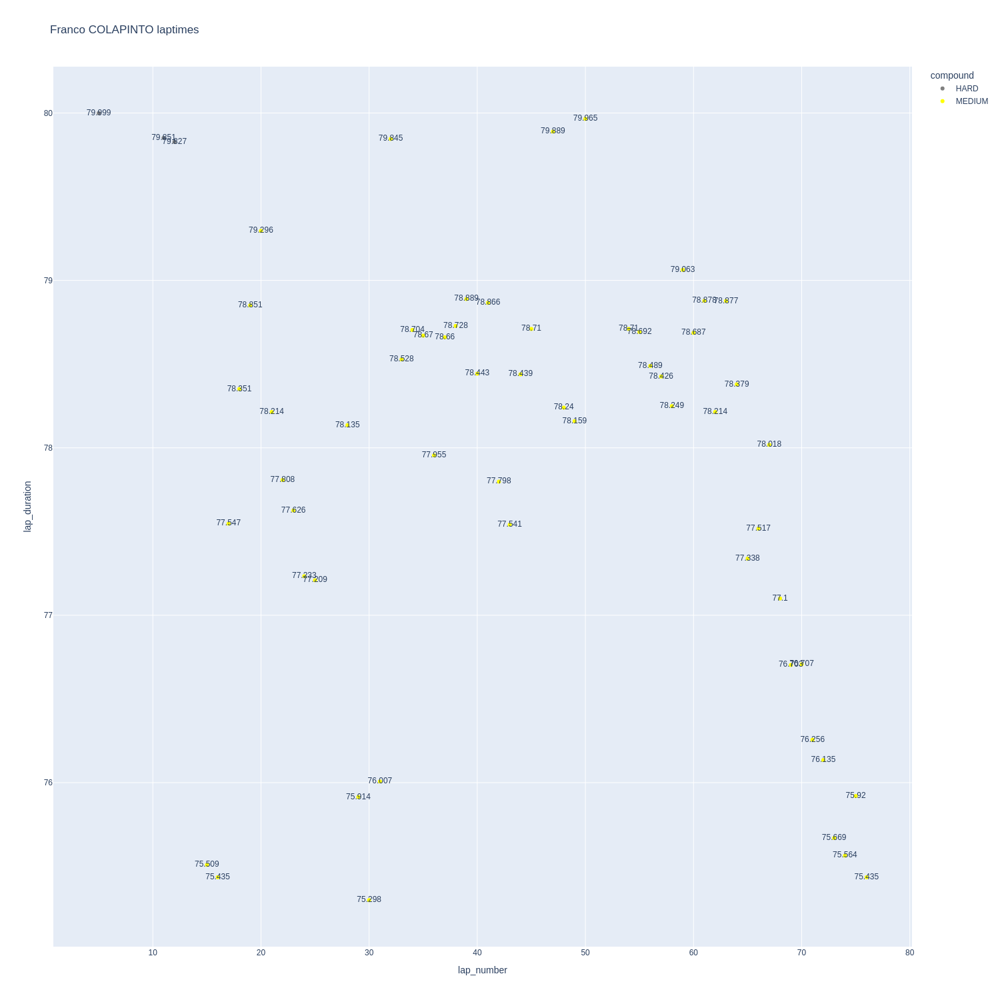

In [155]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

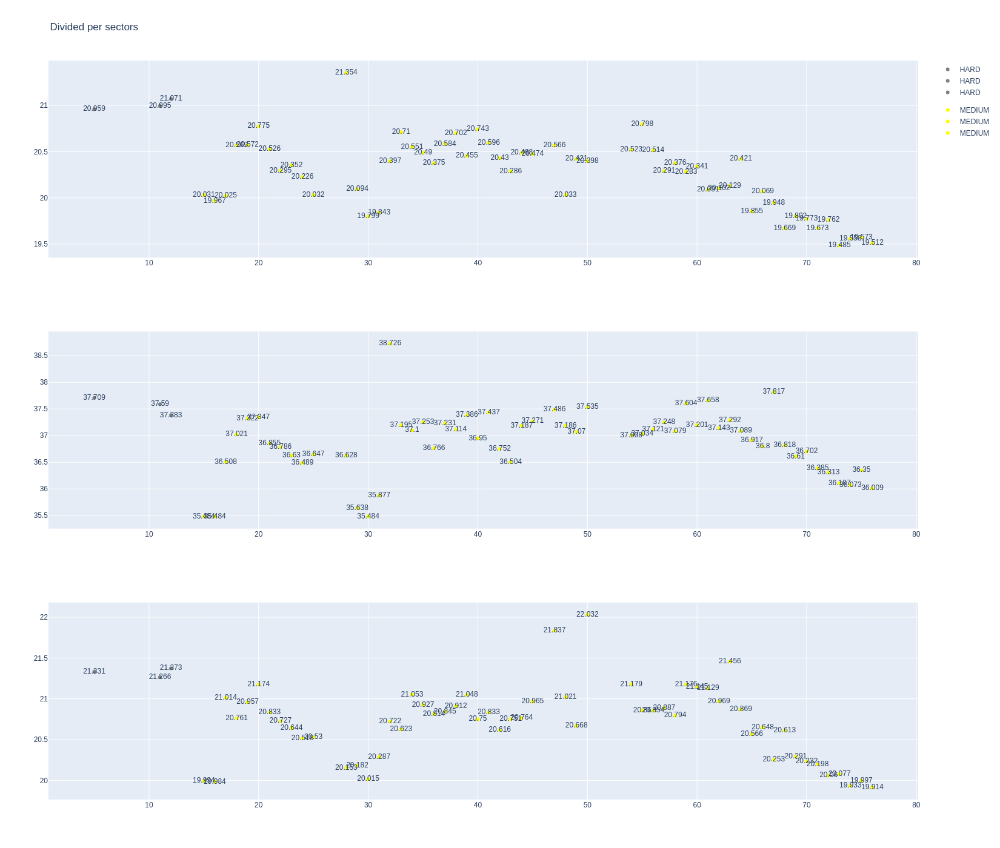

In [156]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [157]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
93,Pierre GASLY,MEDIUM,2025-05-25T13:10:11.181000+00:00,5,21.094,37.068,20.702,78.864
113,Pierre GASLY,MEDIUM,2025-05-25T13:11:30.017000+00:00,6,20.587,36.799,20.668,78.054
133,Pierre GASLY,MEDIUM,2025-05-25T13:12:47.994000+00:00,7,20.844,37.141,21.277,79.262


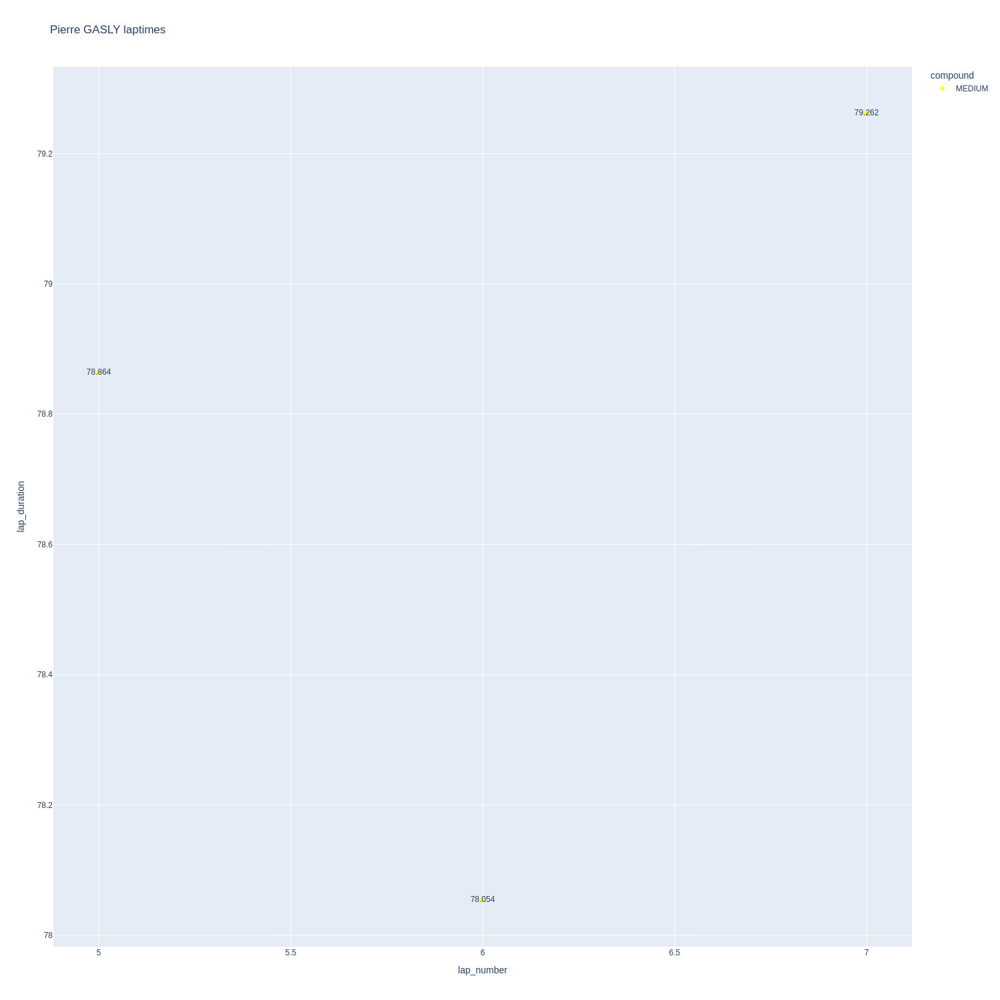

In [158]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

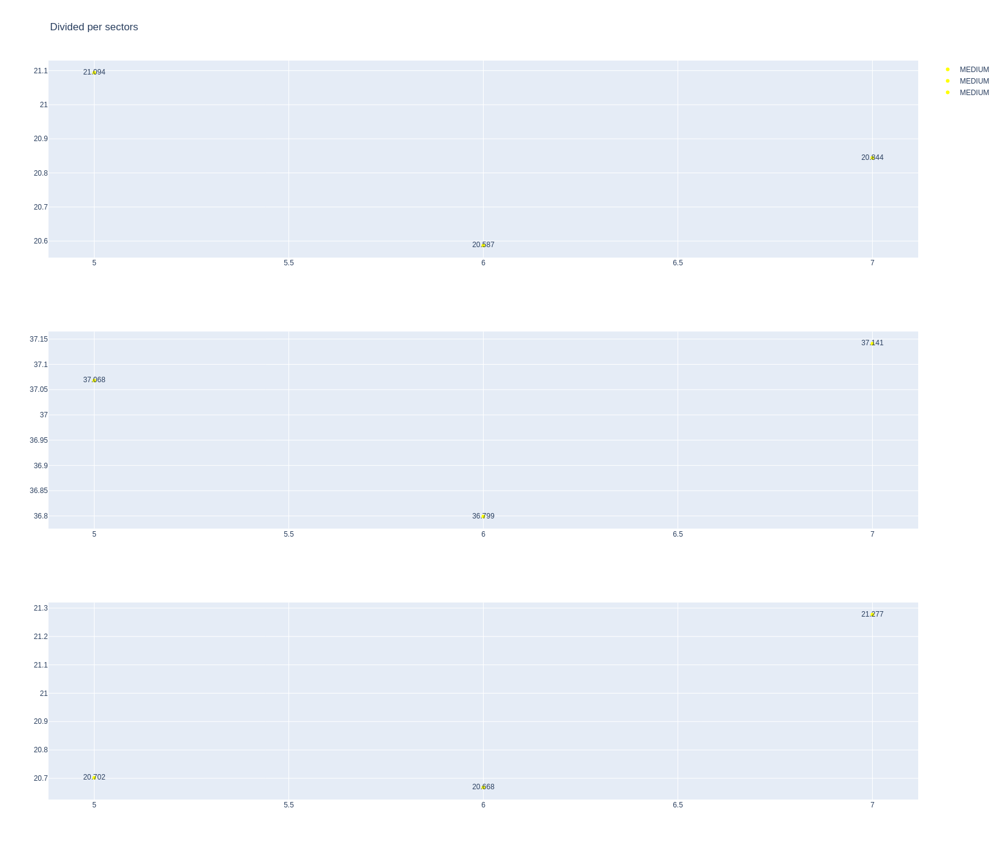

In [159]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [160]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
19,1261,9979,1,23,1,31,MEDIUM,4
20,1261,9979,1,55,1,47,HARD,0
41,1261,9979,2,23,32,39,MEDIUM,8
43,1261,9979,3,23,40,76,HARD,0
46,1261,9979,2,55,48,52,MEDIUM,0
51,1261,9979,3,55,53,76,MEDIUM,8


In [161]:
data = libraryDataF1.getinfolongruns(jointables,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
203,Carlos SAINZ,HARD,2025-05-25T13:18:07.774000+00:00,11,21.101,37.017,21.312,79.430
241,Carlos SAINZ,HARD,2025-05-25T13:20:47.377000+00:00,13,20.908,37.095,21.146,79.149
259,Carlos SAINZ,HARD,2025-05-25T13:22:06.493000+00:00,14,21.001,37.410,21.018,79.429
276,Carlos SAINZ,HARD,2025-05-25T13:23:26.052000+00:00,15,20.911,37.607,21.481,79.999
347,Carlos SAINZ,HARD,2025-05-25T13:28:47.903000+00:00,19,21.170,37.086,21.266,79.522
364,Carlos SAINZ,HARD,2025-05-25T13:30:07.341000+00:00,20,20.652,36.577,20.626,77.855
382,Carlos SAINZ,HARD,2025-05-25T13:31:25.323000+00:00,21,20.392,36.522,20.547,77.461
401,Carlos SAINZ,HARD,2025-05-25T13:32:42.714000+00:00,22,20.285,36.360,20.419,77.064
419,Carlos SAINZ,HARD,2025-05-25T13:33:59.727000+00:00,23,20.083,36.350,20.317,76.750
438,Carlos SAINZ,HARD,2025-05-25T13:35:16.486000+00:00,24,20.105,36.345,20.568,77.018


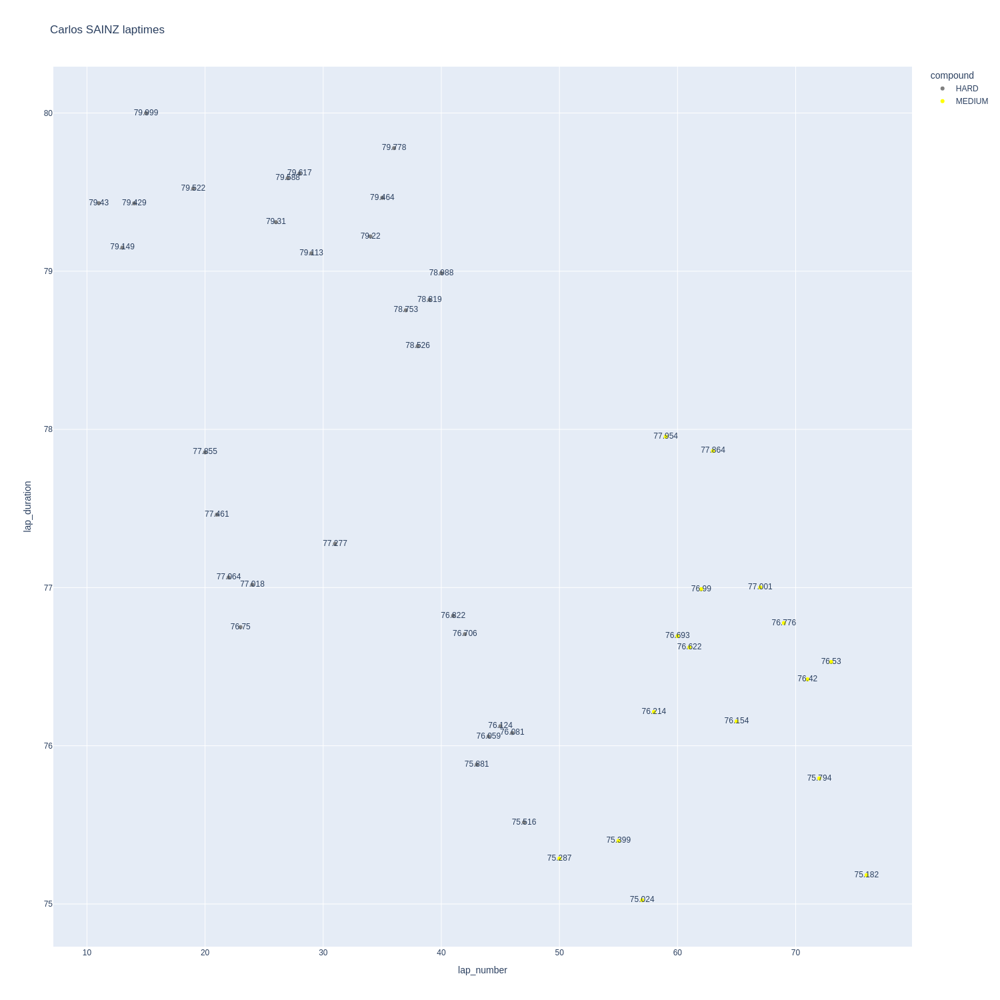

In [162]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

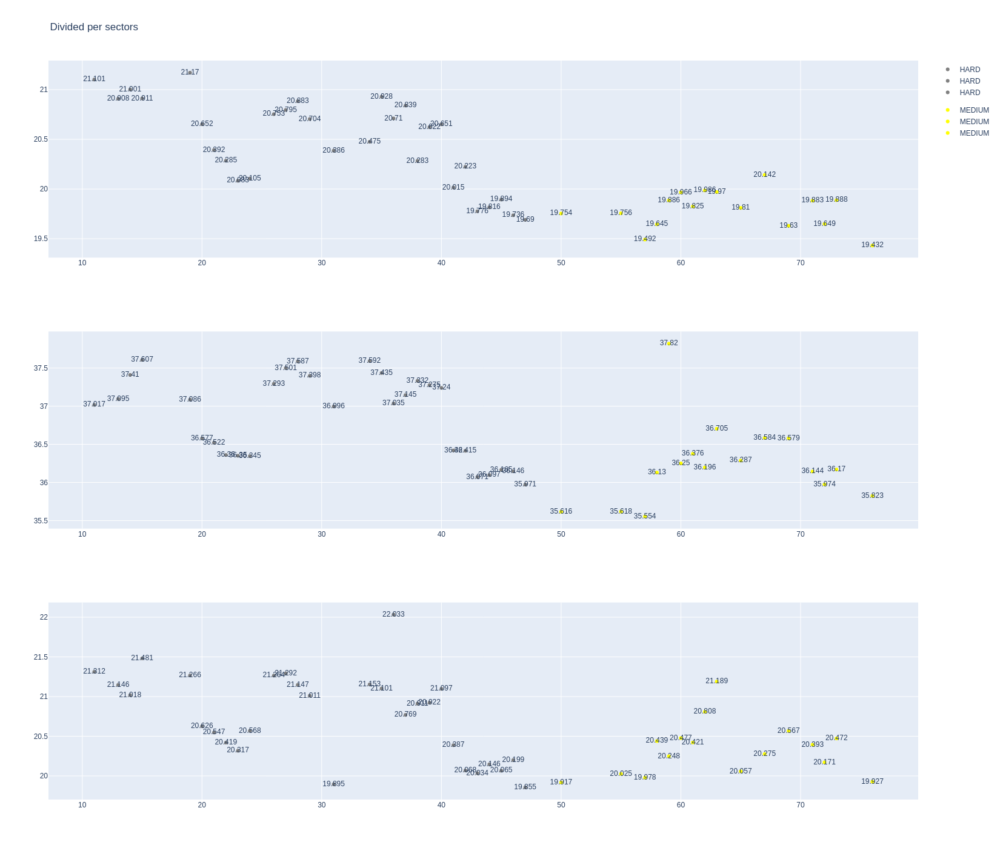

In [163]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [164]:
data= libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
202,Alexander ALBON,MEDIUM,2025-05-25T13:18:07.008000+00:00,11,21.057,37.217,21.173,79.447
221,Alexander ALBON,MEDIUM,2025-05-25T13:19:26.347000+00:00,12,21.127,37.603,20.930,79.660
240,Alexander ALBON,MEDIUM,2025-05-25T13:20:46.076000+00:00,13,21.144,37.200,20.900,79.244
258,Alexander ALBON,MEDIUM,2025-05-25T13:22:05.334000+00:00,14,21.334,37.341,21.142,79.817
346,Alexander ALBON,MEDIUM,2025-05-25T13:28:47.106000+00:00,19,21.045,37.003,21.231,79.279
363,Alexander ALBON,MEDIUM,2025-05-25T13:30:06.482000+00:00,20,20.723,36.668,20.537,77.928
381,Alexander ALBON,MEDIUM,2025-05-25T13:31:24.448000+00:00,21,20.289,36.265,20.542,77.096
400,Alexander ALBON,MEDIUM,2025-05-25T13:32:41.464000+00:00,22,20.270,36.252,20.479,77.001
418,Alexander ALBON,MEDIUM,2025-05-25T13:33:58.446000+00:00,23,20.223,36.046,20.287,76.556
437,Alexander ALBON,MEDIUM,2025-05-25T13:35:15.002000+00:00,24,20.329,36.173,20.452,76.954


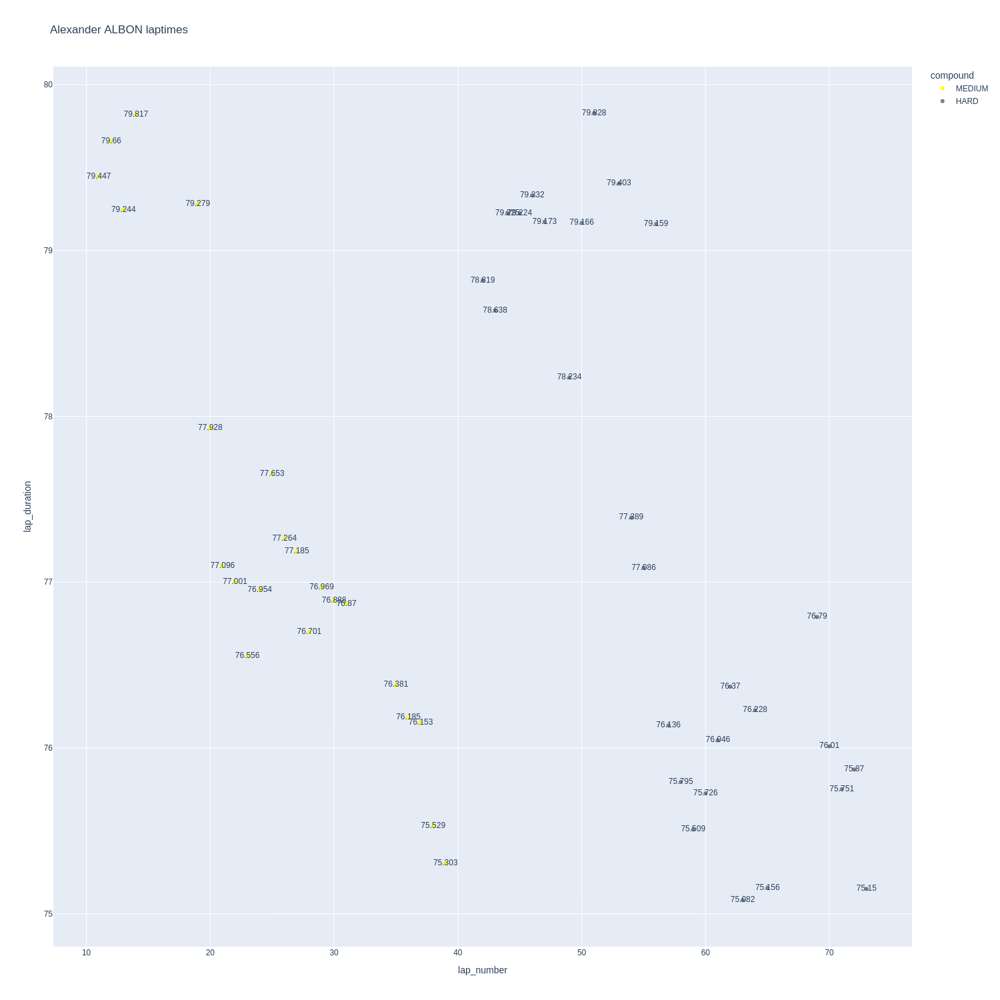

In [165]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

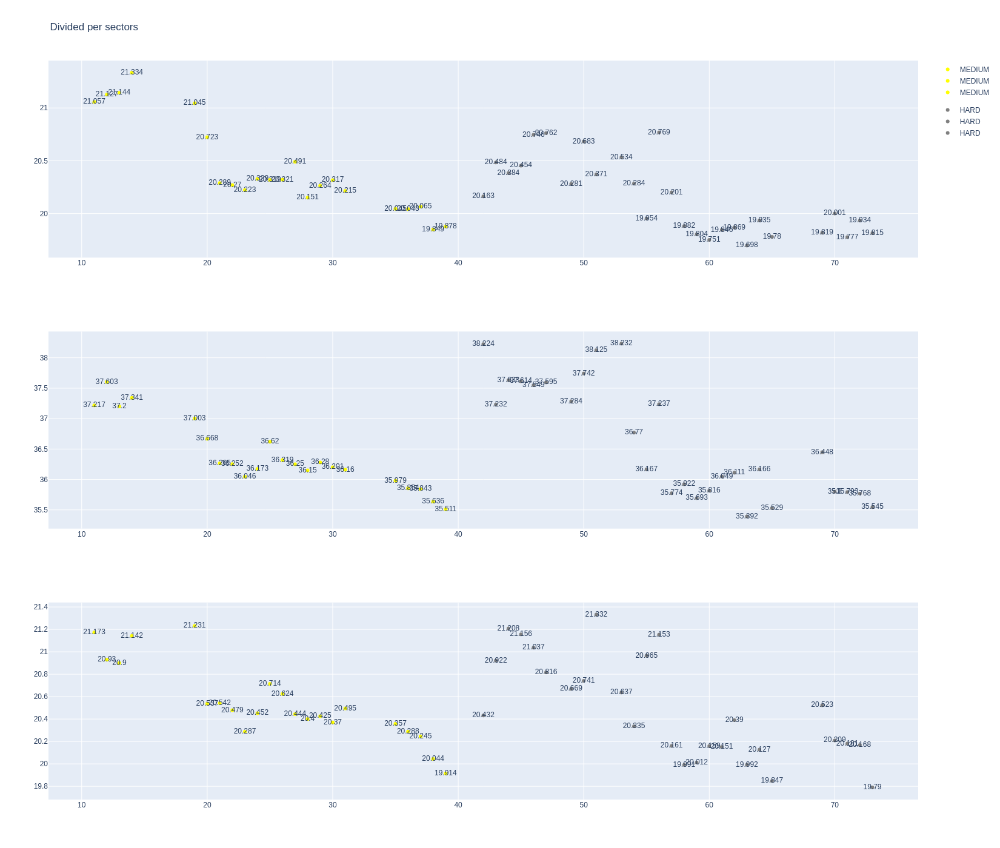

In [166]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [167]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1261,9979,1,5,1,0,MEDIUM,0
5,1261,9979,1,27,1,11,MEDIUM,0
16,1261,9979,2,5,1,25,HARD,0
24,1261,9979,2,27,12,43,HARD,0
36,1261,9979,3,5,26,34,SOFT,0
42,1261,9979,4,5,35,76,MEDIUM,0
45,1261,9979,3,27,44,76,SOFT,0


In [168]:
data = libraryDataF1.getinfolongruns(jointables,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
204,Nico HULKENBERG,MEDIUM,2025-05-25T13:18:08.215000+00:00,11,20.899,37.338,21.167,79.404
266,Nico HULKENBERG,HARD,2025-05-25T13:22:22.567000+00:00,14,20.278,35.598,20.230,76.106
283,Nico HULKENBERG,HARD,2025-05-25T13:23:38.802000+00:00,15,20.234,35.781,20.538,76.553
302,Nico HULKENBERG,HARD,2025-05-25T13:24:55.267000+00:00,16,20.418,36.555,21.344,78.317
319,Nico HULKENBERG,HARD,2025-05-25T13:26:13.565000+00:00,17,21.133,37.720,21.116,79.969
336,Nico HULKENBERG,HARD,2025-05-25T13:27:33.569000+00:00,18,20.535,36.604,20.905,78.044
352,Nico HULKENBERG,HARD,2025-05-25T13:28:51.669000+00:00,19,20.794,37.368,20.896,79.058
369,Nico HULKENBERG,HARD,2025-05-25T13:30:10.638000+00:00,20,20.840,37.388,21.153,79.381
387,Nico HULKENBERG,HARD,2025-05-25T13:31:30.058000+00:00,21,20.547,36.837,20.766,78.150
406,Nico HULKENBERG,HARD,2025-05-25T13:32:48.230000+00:00,22,20.326,36.551,20.632,77.509


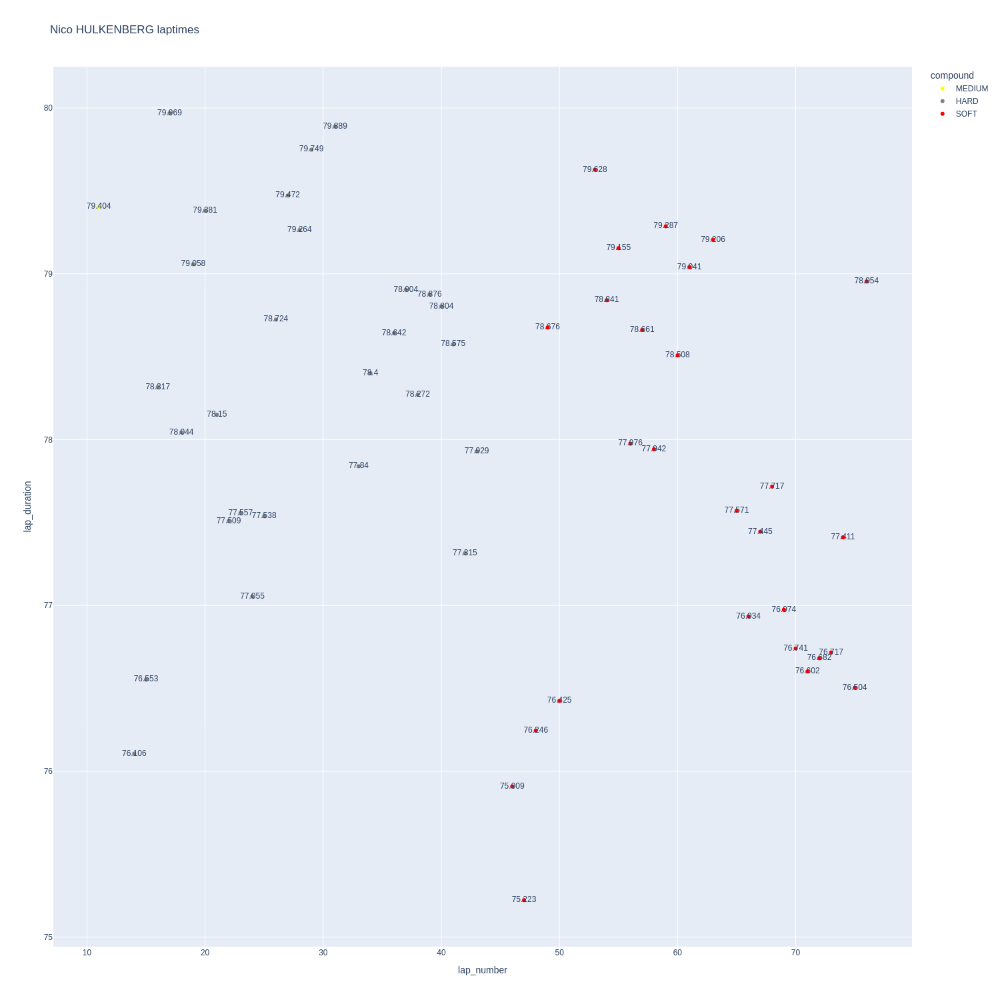

In [169]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

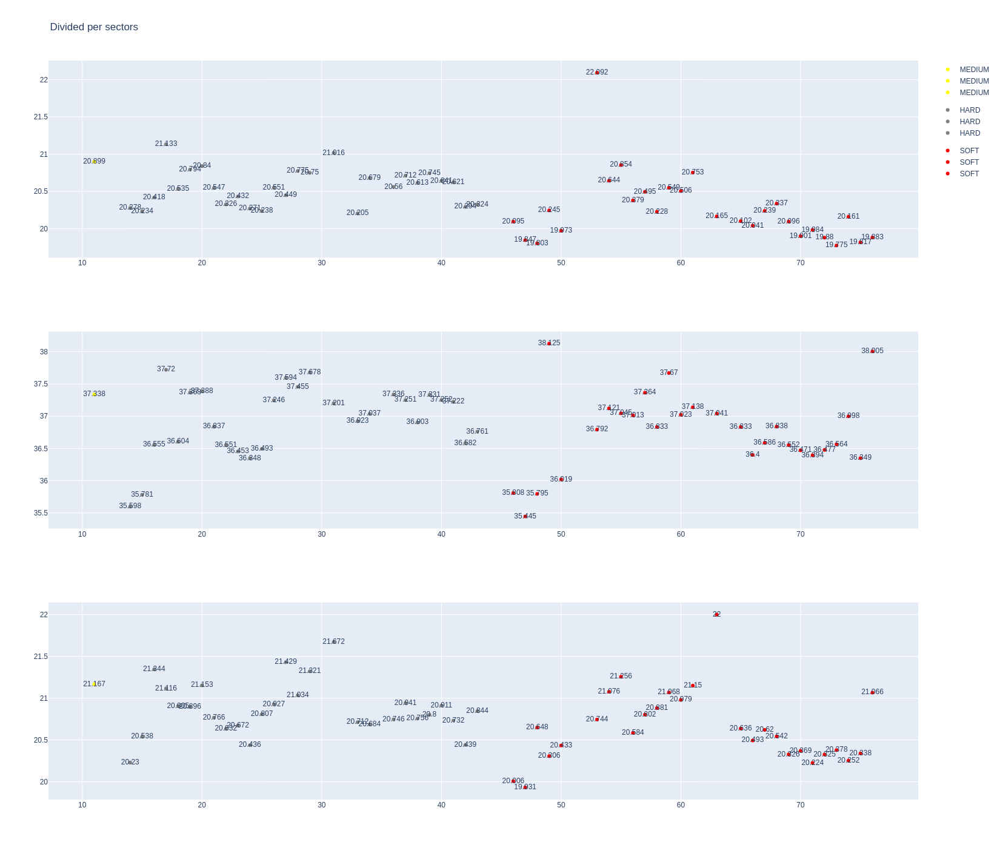

In [170]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [171]:
data = libraryDataF1.getinfolongruns(jointables,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
95,Gabriel BORTOLETO,HARD,2025-05-25T13:10:38.063000+00:00,5,20.236,36.043,20.115,76.394
115,Gabriel BORTOLETO,HARD,2025-05-25T13:11:54.454000+00:00,6,19.917,35.681,20.159,75.757
154,Gabriel BORTOLETO,HARD,2025-05-25T13:14:25.845000+00:00,8,19.866,37.166,21.299,78.331
173,Gabriel BORTOLETO,HARD,2025-05-25T13:15:44.174000+00:00,9,19.887,37.090,21.434,78.411
192,Gabriel BORTOLETO,HARD,2025-05-25T13:17:02.571000+00:00,10,19.881,36.748,20.153,76.782
211,Gabriel BORTOLETO,HARD,2025-05-25T13:18:19.332000+00:00,11,19.890,36.030,20.336,76.256
230,Gabriel BORTOLETO,HARD,2025-05-25T13:19:35.550000+00:00,12,20.254,36.728,20.822,77.804
248,Gabriel BORTOLETO,HARD,2025-05-25T13:20:53.367000+00:00,13,20.471,37.542,21.075,79.088
265,Gabriel BORTOLETO,HARD,2025-05-25T13:22:12.473000+00:00,14,20.638,36.911,20.932,78.481
282,Gabriel BORTOLETO,HARD,2025-05-25T13:23:30.911000+00:00,15,20.490,37.133,21.024,78.647


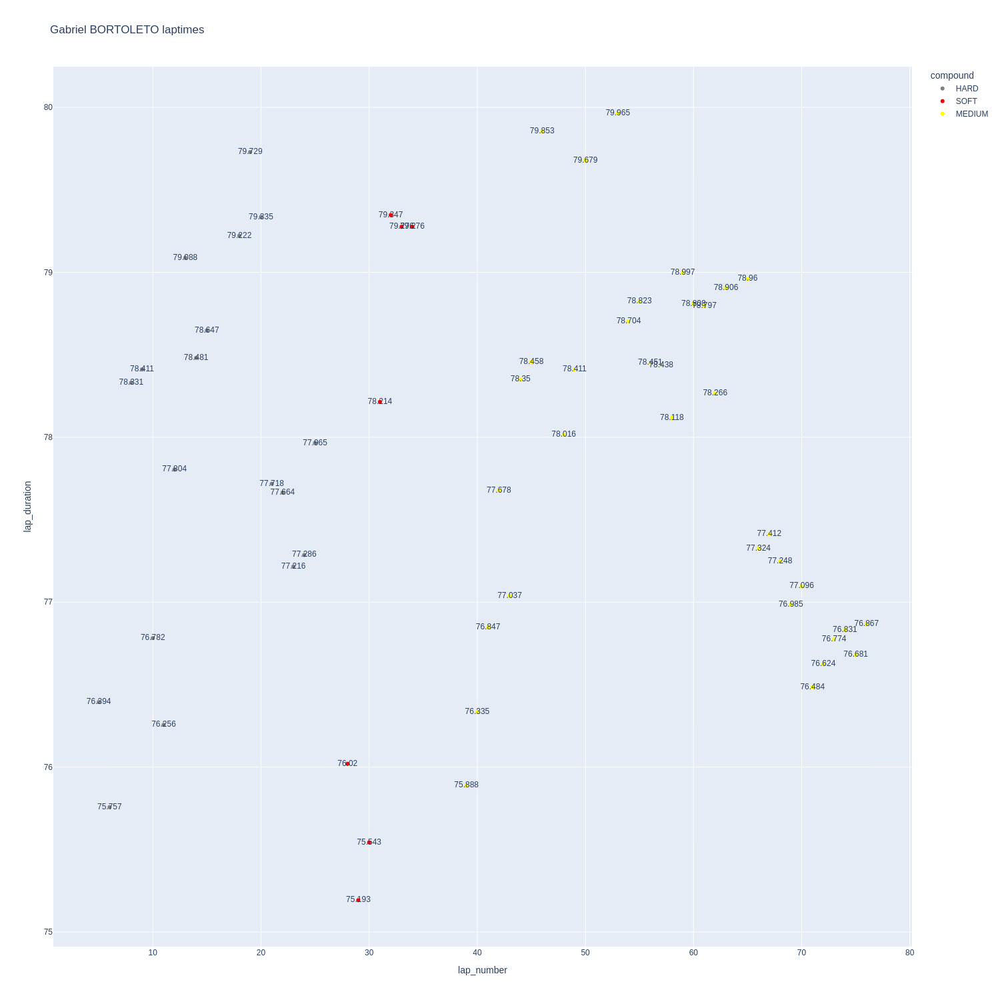

In [172]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

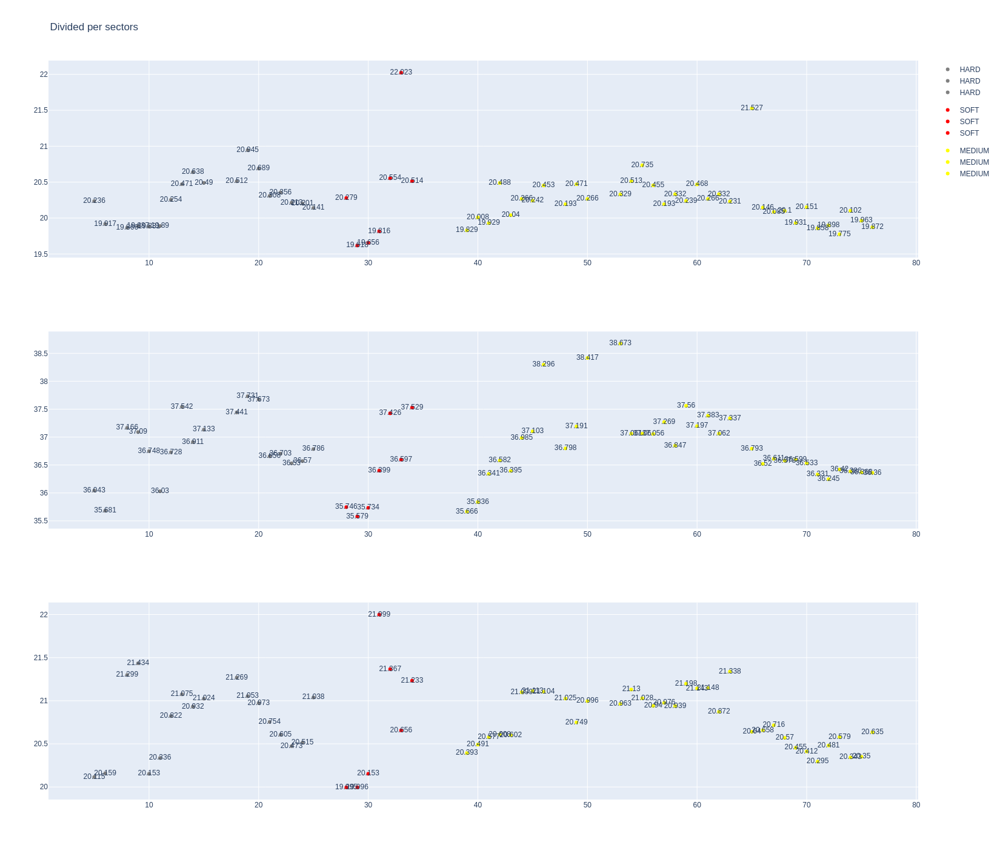

In [173]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [174]:
pit = libraryDataF1.obtain_information('pit',session_key=9979)

In [175]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration

,pit_duration
team_name,
Mercedes,23.520000
Ferrari,23.700000
Williams,24.100000
Red Bull Racing,24.125000
Racing Bulls,24.200000
Alpine,24.333333
McLaren,24.450000
Aston Martin,25.033333
Kick Sauber,26.820000
